# EDMDc battery voltage modeling

We start with the thermodynamic baseline:

$$V_k = OCV(SOC_k) + \eta_k$$

where $\eta_k$ is the dynamic voltage residual/overpotential that the later EDMDc model will learn.

## Step 0: Imports and plotting style

In [159]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LogNorm
from scipy import linalg
from scipy.interpolate import PchipInterpolator

plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 300,
    "font.size": 15,
    "axes.labelsize": 17,
    "axes.titlesize": 18,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 11,
    "axes.linewidth": 1.2,
    "lines.linewidth": 1.35,
})

## Step 1: Load the DFN drive-cycle data

Available columns are:

- `Time [s]`
- `Current [A]`
- `Terminal voltage [V]`
- `State of Charge`

Rows with negative SOC are removed before analysis.

In [160]:
DATA_DIR = Path(r"C:\GitHub Repos\ME-595-Project\pybamm_simulation_datagen\DFN_Data")
CSV_FILES = sorted(DATA_DIR.glob("*_results.csv"))

TIME_COL = "Time [s]"
CURRENT_COL = "Current [A]"
VOLTAGE_COL = "Terminal voltage [V]"
SOC_COL = "State of Charge"
CAPACITY_COL = "Discharge capacity [A.h]"

print(f"Found {len(CSV_FILES)} CSV files")
for path in CSV_FILES:
    print(path.name)

Found 5 CSV files
HWFET_results.csv
Pseudo-Random_Limit_Based_results.csv
UDDS_results.csv
US06_results.csv
WLTP_results.csv


In [161]:
cycles = {}

for path in CSV_FILES:
    cycle_name = path.stem.replace("_results", "")
    df = pd.read_csv(path)
    df = df.loc[df[SOC_COL] >= 0].reset_index(drop=True)
    df["cycle"] = cycle_name
    cycles[cycle_name] = df

data = pd.concat(cycles.values(), ignore_index=True)

print(f"Loaded {len(cycles)} cycles")
print(f"Loaded {len(data):,} rows after removing SOC < 0")
display(data.head())

summary = data.groupby("cycle")[[TIME_COL, CURRENT_COL, VOLTAGE_COL, SOC_COL]].agg(
    ["count", "min", "max", "mean", "std"]
)
display(summary)

Loaded 5 cycles
Loaded 2,038,534 rows after removing SOC < 0


,Time [s],Terminal power [W],Current [A],Terminal voltage [V],Discharge capacity [A.h],State of Charge,cycle
0,0.0,0.059330,0.014193,4.180290,0.000000e+00,1.0,HWFET
1,0.1,0.060236,0.014409,4.180278,3.988095e-07,1.0,HWFET
2,0.2,0.060236,0.014409,4.180276,7.990721e-07,1.0,HWFET
3,0.3,0.059556,0.014247,4.180282,1.194820e-06,1.0,HWFET
4,0.4,0.058650,0.014030,4.180290,1.586980e-06,1.0,HWFET


Time [s]                                            \
                             count  min      max          mean           std   
cycle                                                                          
HWFET                       321709  0.0  32170.8  16085.400000   9286.953321   
Pseudo-Random_Limit_Based   643840  0.0  64383.9  32191.950000  18586.074300   
UDDS                        317987  0.0  31798.6  15899.300000   9179.508436   
US06                        236071  0.0  23607.0  11803.500000   6814.797204   
WLTP                        518927  0.0  51909.5  25946.311145  14980.165881   

                          Current [A]                                 \
                                count       min        max      mean   
cycle                                                                  
HWFET                          321709 -2.871130   2.868543  0.559447   
Pseudo-Random_Limit_Based      643840 -5.746429   8.841349  0.278026   
UDDS                           317987 -6.894815  11.339539  0.565962   
US06                           236071 -4.474772   9.066848  0.762228   
WLTP                           518927 -2.935057   4.185538  0.346877   

                                    Terminal voltage [V]                      \
                                std                count       min       max   
cycle                                                                          
HWFET                      0.575383               321709  2.715632  4.221009   
Pseudo-Random_Limit_Based  2.167918               643840  2.494775  4.398191   
UDDS                       1.527230               317987  2.307713  4.288480   
US06                       1.571720               236071  2.596489  4.256048   
WLTP                       0.811040               518927  2.656238  4.239194   

                                              State of Charge                \
                               mean       std           count           min   
cycle                                                                         
HWFET                      3.727443  0.288851          321709  3.222924e-06   
Pseudo-Random_Limit_Based  3.780894  0.270217          643840  5.639281e-03   
UDDS                       3.729750  0.288987          317987  2.510047e-06   
US06                       3.719713  0.292106          236071  5.908306e-06   
WLTP                       3.741276  0.292552          518927  2.925443e-07   

                                                        
                               max      mean       std  
cycle                                                   
HWFET                      1.00000  0.522219  0.285867  
Pseudo-Random_Limit_Based  1.00577  0.550117  0.278185  
UDDS                       1.00000  0.522110  0.284620  
US06                       1.00000  0.523020  0.285093  
WLTP                       1.00000  0.524611  0.288165

## Step 1a: Verify the sampling time

$$\Delta t \approx 0.1\ \mathrm{s}$$

If the sample time is not uniform, later Coulomb counting must use the actual $\Delta t_k$ values.

In [162]:
dt_rows = []

for cycle_name, df in cycles.items():
    dt = np.diff(df[TIME_COL].to_numpy(dtype=float))
    dt_rows.append({
        "cycle": cycle_name,
        "n_samples": len(df),
        "dt_min_s": np.min(dt),
        "dt_median_s": np.median(dt),
        "dt_max_s": np.max(dt),
        "estimated_Hz": 1.0 / np.median(dt),
    })

dt_summary = pd.DataFrame(dt_rows)
display(dt_summary)

,cycle,n_samples,dt_min_s,dt_median_s,dt_max_s,estimated_Hz
0,HWFET,321709,0.1,0.1,0.1,10.0
1,Pseudo-Random_Limit_Based,643840,0.1,0.1,0.1,10.0
2,UDDS,317987,0.1,0.1,0.1,10.0
3,US06,236071,0.1,0.1,0.1,10.0
4,WLTP,518927,0.1,0.1,7.4,10.0


## Step 1b: Inspect the loaded signals

Before modeling, we check the raw time series

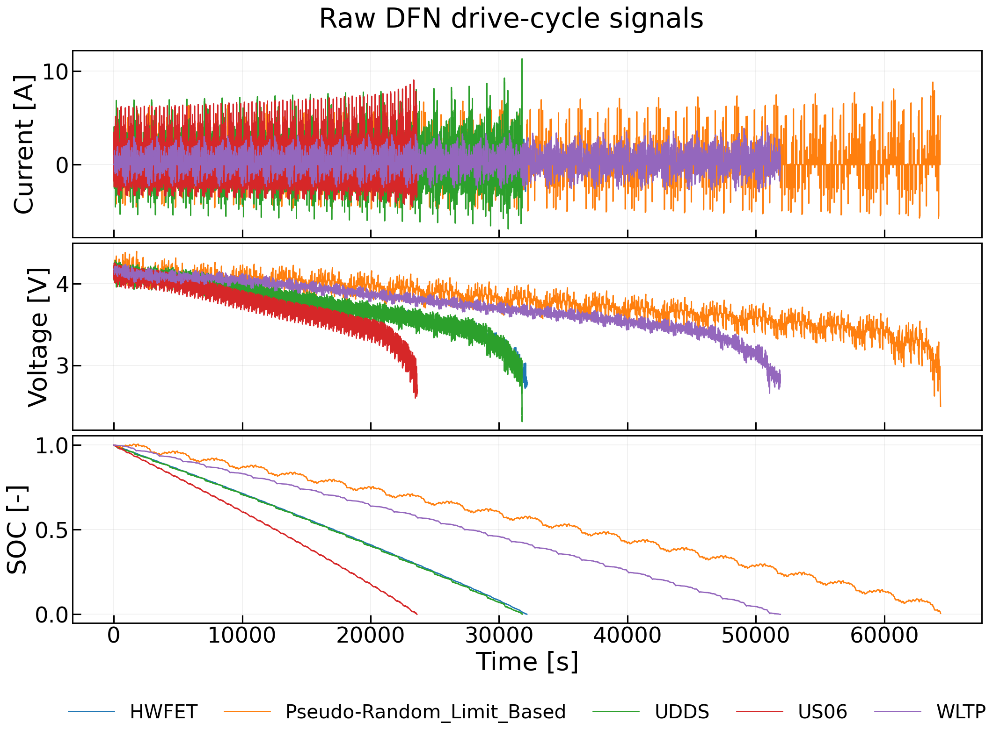

In [163]:
RAW_OVERVIEW_LABEL_SIZE = 28
RAW_OVERVIEW_TICK_SIZE = 24
RAW_OVERVIEW_TITLE_SIZE = 30
RAW_OVERVIEW_LEGEND_SIZE = 18
RAW_OVERVIEW_LINEWIDTH = 1.4

fig, axes = plt.subplots(3, 1, figsize=(15.5, 10.5), sharex=True, constrained_layout=True)

for cycle_name, df in cycles.items():
    axes[0].plot(df[TIME_COL], df[CURRENT_COL], label=cycle_name, linewidth=RAW_OVERVIEW_LINEWIDTH)
    axes[1].plot(df[TIME_COL], df[VOLTAGE_COL], label=cycle_name, linewidth=RAW_OVERVIEW_LINEWIDTH)
    axes[2].plot(df[TIME_COL], df[SOC_COL], label=cycle_name, linewidth=RAW_OVERVIEW_LINEWIDTH)

axes[0].set_ylabel("Current [A]", fontsize=RAW_OVERVIEW_LABEL_SIZE)
axes[1].set_ylabel("Voltage [V]", fontsize=RAW_OVERVIEW_LABEL_SIZE)
axes[2].set_ylabel("SOC [-]", fontsize=RAW_OVERVIEW_LABEL_SIZE)
axes[2].set_xlabel("Time [s]", fontsize=RAW_OVERVIEW_LABEL_SIZE)

for ax in axes:
    ax.grid(True, alpha=0.22)
    ax.tick_params(direction="in", length=9, width=1.6, labelsize=RAW_OVERVIEW_TICK_SIZE)
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)

axes[2].legend(
    frameon=False,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.34),
    ncol=5,
    fontsize=RAW_OVERVIEW_LEGEND_SIZE+3,
    handlelength=2.4,
    columnspacing=1.4,
)
fig.suptitle("Raw DFN drive-cycle signals", fontsize=RAW_OVERVIEW_TITLE_SIZE, y=1.06)
plt.show()

## Step 1c: Inspect voltage-current coverage

These density maps show where each drive cycle excites the cell

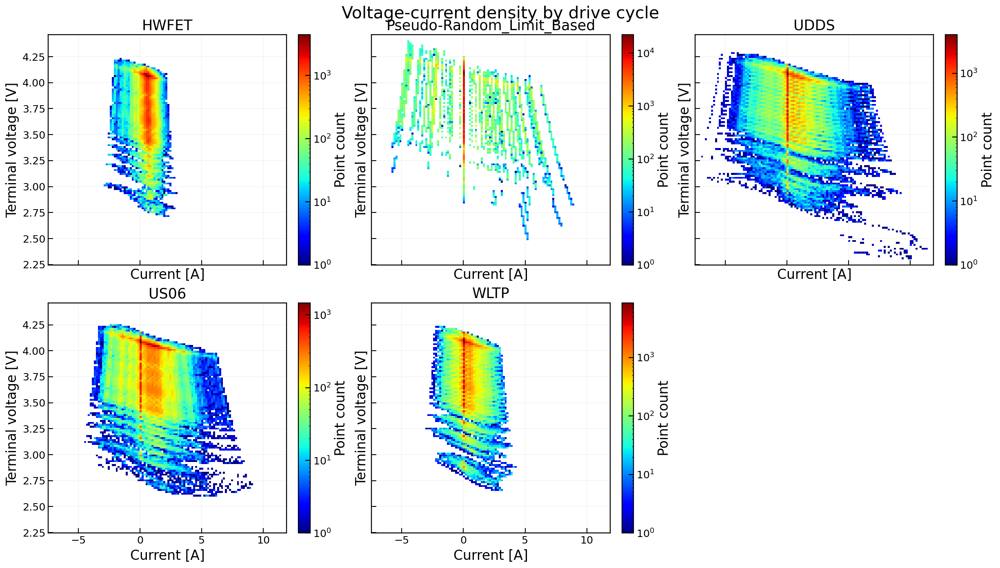

In [164]:
all_current = data[CURRENT_COL].to_numpy(dtype=float)
all_voltage = data[VOLTAGE_COL].to_numpy(dtype=float)
good = np.isfinite(all_current) & np.isfinite(all_voltage)
all_current = all_current[good]
all_voltage = all_voltage[good]

x_min, x_max = all_current.min(), all_current.max()
y_min, y_max = all_voltage.min(), all_voltage.max()
x_pad = 0.03 * (x_max - x_min)
y_pad = 0.03 * (y_max - y_min)
x_limits = (x_min - x_pad, x_max + x_pad)
y_limits = (y_min - y_pad, y_max + y_pad)
hist_range = [x_limits, y_limits]

n_cycles = len(cycles)
ncols = 3
nrows = int(np.ceil(n_cycles / ncols))

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(5.8 * ncols, 4.8 * nrows),
    sharex=True,
    sharey=True,
    constrained_layout=True,
)
axes = np.atleast_1d(axes).ravel()

for ax, (cycle_name, df) in zip(axes, cycles.items()):
    current = df[CURRENT_COL].to_numpy(dtype=float)
    voltage = df[VOLTAGE_COL].to_numpy(dtype=float)
    good = np.isfinite(current) & np.isfinite(voltage)

    density = ax.hist2d(
        current[good],
        voltage[good],
        bins=120,
        range=hist_range,
        cmap="jet",
        norm=LogNorm(),
        cmin=1,
    )

    ax.set_xlim(x_limits)
    ax.set_ylim(y_limits)
    ax.set_title(cycle_name)
    ax.set_xlabel("Current [A]")
    ax.set_ylabel("Terminal voltage [V]")
    ax.grid(True, alpha=0.15)
    ax.tick_params(direction="in", length=6, width=1.1)
    cbar = fig.colorbar(density[3], ax=ax)
    cbar.set_label("Point count")

for ax in axes[n_cycles:]:
    ax.set_visible(False)

fig.suptitle("Voltage-current density by drive cycle", y=1.02)
plt.show()

## Step 2: Define training and validation cycles

To avoid validation leakage, every fitted object in the preprocessing pipeline must use training data only:

- OCV curve
- scaling parameters
- EDMDc matrices

For this notebook, the training cycles are `US06` and `Pseudo-Random_Limit_Based`. The held-out validation cycles are `HWFET`, `UDDS`, and `WLTP`.

In [165]:
TRAIN_CYCLES = ["US06", "Pseudo-Random_Limit_Based"]
VALIDATION_CYCLES = ["HWFET", "UDDS", "WLTP"]

missing_train = sorted(set(TRAIN_CYCLES) - set(cycles))
missing_validation = sorted(set(VALIDATION_CYCLES) - set(cycles))

if missing_train or missing_validation:
    raise ValueError(
        f"Missing cycles. train={missing_train}, validation={missing_validation}. "
        f"Available cycles are {sorted(cycles)}"
    )

train_data = pd.concat([cycles[name] for name in TRAIN_CYCLES], ignore_index=True)
validation_data = pd.concat([cycles[name] for name in VALIDATION_CYCLES], ignore_index=True)

split_summary = pd.DataFrame({
    "group": ["train", "validation"],
    "cycles": [", ".join(TRAIN_CYCLES), ", ".join(VALIDATION_CYCLES)],
    "rows": [len(train_data), len(validation_data)],
    "soc_min": [train_data[SOC_COL].min(), validation_data[SOC_COL].min()],
    "soc_max": [train_data[SOC_COL].max(), validation_data[SOC_COL].max()],
    "current_min_A": [train_data[CURRENT_COL].min(), validation_data[CURRENT_COL].min()],
    "current_max_A": [train_data[CURRENT_COL].max(), validation_data[CURRENT_COL].max()],
})

display(split_summary)

,group,cycles,rows,soc_min,soc_max,current_min_A,current_max_A
0,train,"US06, Pseudo-Random_Limit_Based",879911,5.908306e-06,1.00577,-5.746429,9.066848
1,validation,"HWFET, UDDS, WLTP",1158623,2.925443e-07,1.00000,-6.894815,11.339539


## Step 3: Extract apparent OCV points from training data only

At low current, terminal voltage is closer to OCV because ohmic and polarization drops are smaller. But low current alone does not guarantee equilibrium, so we keep only long enough near-rest blocks.

Candidate rest condition:

$$|I_k| < 0.05\ \mathrm{A}$$

A block is accepted only if:

$$t_{\mathrm{end}} - t_{\mathrm{start}} \geq 20\ \mathrm{s}$$

From each accepted block, we take the final row as the most relaxed available point. This is still an **apparent OCV**, not a perfect equilibrium OCV measurement.

We use both training cycles, `US06` and `Pseudo-Random_Limit_Based`, for OCV extraction. This is acceptable because both are part of the training set

In [166]:
REST_CURRENT_ABS_A = 0.05
REST_MIN_DURATION_S = 20.0

rest_block_rows = []
ocv_point_rows = []

for cycle_name in TRAIN_CYCLES:
    df = cycles[cycle_name].copy()
    is_rest = df[CURRENT_COL].abs() < REST_CURRENT_ABS_A
    block_id = is_rest.ne(is_rest.shift(fill_value=False)).cumsum()

    for _, block in df.loc[is_rest].groupby(block_id[is_rest]):
        t_start = float(block[TIME_COL].iloc[0])
        t_end = float(block[TIME_COL].iloc[-1])
        duration = t_end - t_start

        rest_block_rows.append({
            "cycle": cycle_name,
            "t_start_s": t_start,
            "t_end_s": t_end,
            "duration_s": duration,
            "n_samples": len(block),
            "accepted": duration >= REST_MIN_DURATION_S,
        })

        if duration >= REST_MIN_DURATION_S:
            final_row = block.iloc[-1].copy()
            final_row["rest_duration_s"] = duration
            ocv_point_rows.append(final_row)

rest_blocks = pd.DataFrame(rest_block_rows)
ocv_points = pd.DataFrame(ocv_point_rows)

print(f"Near-rest blocks found in training cycles: {len(rest_blocks)}")
print(f"Accepted rest blocks from training cycles: {len(ocv_points)}")

if len(rest_blocks) > 0:
    rest_block_summary = rest_blocks.groupby("cycle").agg(
        rest_blocks_found=("duration_s", "size"),
        accepted_blocks=("accepted", "sum"),
        max_rest_duration_s=("duration_s", "max"),
        median_rest_duration_s=("duration_s", "median"),
    )
    display(rest_block_summary)

display(rest_blocks.sort_values("duration_s", ascending=False).head(20))

if len(ocv_points) < 4:
    raise ValueError(
        "Too few apparent OCV points were found. Inspect rest_blocks above, then consider "
        "lowering REST_MIN_DURATION_S or increasing REST_CURRENT_ABS_A."
    )

display(ocv_points[["cycle", TIME_COL, SOC_COL, VOLTAGE_COL, CURRENT_COL, "rest_duration_s"]])

Near-rest blocks found in training cycles: 3799
Accepted rest blocks from training cycles: 780


,rest_blocks_found,accepted_blocks,max_rest_duration_s,median_rest_duration_s
cycle,,,,
Pseudo-Random_Limit_Based,1056,780,59.9,34.9
US06,2743,0,14.5,0.0


,cycle,t_start_s,t_end_s,duration_s,n_samples,accepted
3230,Pseudo-Random_Limit_Based,29736.1,29796.0,59.9,600,True
3080,Pseudo-Random_Limit_Based,20586.1,20646.0,59.9,600,True
3280,Pseudo-Random_Limit_Based,32786.1,32846.0,59.9,600,True
3130,Pseudo-Random_Limit_Based,23636.1,23696.0,59.9,600,True
3380,Pseudo-Random_Limit_Based,38886.1,38946.0,59.9,600,True
3330,Pseudo-Random_Limit_Based,35836.1,35896.0,59.9,600,True
3180,Pseudo-Random_Limit_Based,26686.1,26746.0,59.9,600,True
2780,Pseudo-Random_Limit_Based,2286.1,2346.0,59.9,600,True
2930,Pseudo-Random_Limit_Based,11436.1,11496.0,59.9,600,True
2830,Pseudo-Random_Limit_Based,5336.1,5396.0,59.9,600,True


,cycle,Time [s],State of Charge,Terminal voltage [V],Current [A],rest_duration_s
630,Pseudo-Random_Limit_Based,63.0,0.999248,4.177366,0.0,56.9
2330,Pseudo-Random_Limit_Based,233.0,0.997669,4.180493,0.0,41.9
2950,Pseudo-Random_Limit_Based,295.0,0.993666,4.153184,0.0,21.9
3700,Pseudo-Random_Limit_Based,370.0,0.986629,4.132555,0.0,35.9
4390,Pseudo-Random_Limit_Based,439.0,0.993009,4.178799,0.0,26.9
...,...,...,...,...,...,...
639550,Pseudo-Random_Limit_Based,63955.0,0.025782,3.033992,0.0,49.9
640500,Pseudo-Random_Limit_Based,64050.0,0.026015,3.068743,0.0,43.9
641130,Pseudo-Random_Limit_Based,64113.0,0.024964,3.063048,0.0,56.9
642830,Pseudo-Random_Limit_Based,64283.0,0.021978,3.058202,0.0,41.9


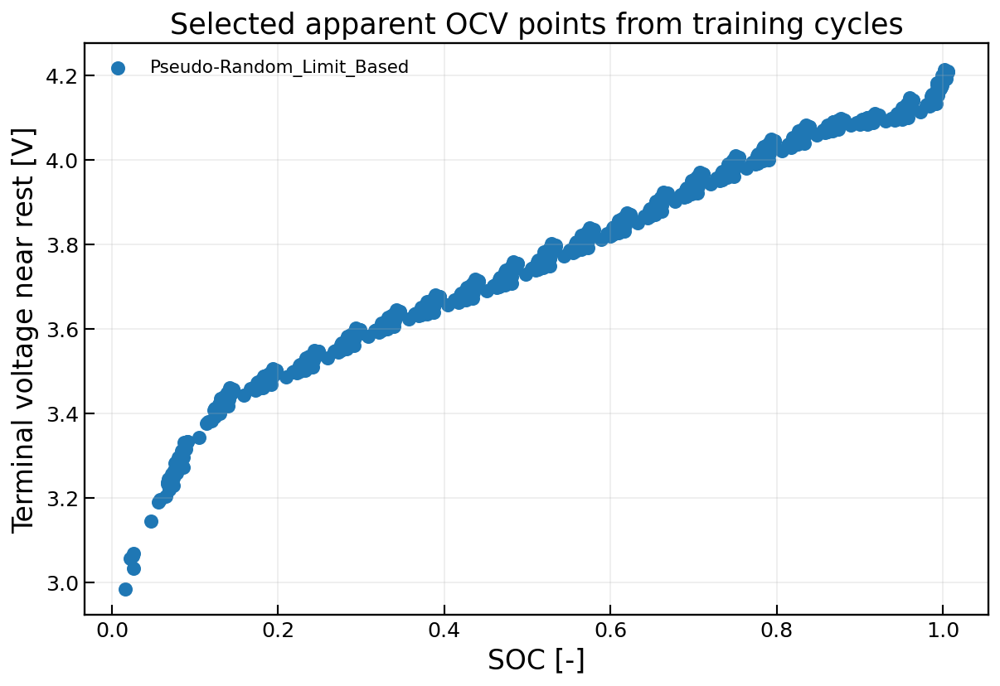

In [167]:
fig, ax = plt.subplots(figsize=(8.5, 5.8), constrained_layout=True)

for cycle_name, group in ocv_points.groupby("cycle"):
    ax.scatter(group[SOC_COL], group[VOLTAGE_COL], s=60, label=cycle_name)

ax.set_xlabel("SOC [-]")
ax.set_ylabel("Terminal voltage near rest [V]")
ax.set_title("Selected apparent OCV points from training cycles")
ax.grid(True, alpha=0.25)
ax.tick_params(direction="in", length=6, width=1.1)
ax.legend(frameon=False)
plt.show()

## Step 4: Fit a shape-preserving OCV curve

Bin the apparent OCV points by SOC and take medians. Then fit a shape-preserving PCHIP interpolator.

The fitted curve is:

$$\widehat{OCV}(SOC)$$

Later, the dynamic residual will be:

$$\eta_k = V_k - \widehat{OCV}(SOC_k)$$

In [168]:
N_OCV_BINS = 25

ocv_work = ocv_points[[SOC_COL, VOLTAGE_COL, "cycle"]].dropna().copy()
ocv_work = ocv_work.sort_values(SOC_COL).reset_index(drop=True)

soc_min = ocv_work[SOC_COL].min()
soc_max = ocv_work[SOC_COL].max()
soc_bins = np.linspace(soc_min, soc_max, N_OCV_BINS + 1)
ocv_work["soc_bin"] = pd.cut(ocv_work[SOC_COL], bins=soc_bins, include_lowest=True)

ocv_binned = (
    ocv_work.groupby("soc_bin", observed=True)
    .agg(
        soc=(SOC_COL, "median"),
        ocv=(VOLTAGE_COL, "median"),
        n_points=(VOLTAGE_COL, "size"),
    )
    .dropna()
    .sort_values("soc")
    .reset_index(drop=True)
)

ocv_binned = ocv_binned.drop_duplicates(subset="soc", keep="first")

if len(ocv_binned) < 2:
    raise ValueError("Need at least two unique SOC bins to fit an OCV curve.")

OCV_pchip = PchipInterpolator(
    ocv_binned["soc"].to_numpy(dtype=float),
    ocv_binned["ocv"].to_numpy(dtype=float),
    extrapolate=False,
)

ocv_soc = ocv_binned["soc"].to_numpy(dtype=float)
ocv_voltage = ocv_binned["ocv"].to_numpy(dtype=float)

lower_slope = (ocv_voltage[1] - ocv_voltage[0]) / (ocv_soc[1] - ocv_soc[0])
upper_slope = (ocv_voltage[-1] - ocv_voltage[-2]) / (ocv_soc[-1] - ocv_soc[-2])

def OCV_func(soc):
    was_scalar = np.isscalar(soc)
    soc_array = np.atleast_1d(np.asarray(soc, dtype=float))
    ocv = OCV_pchip(soc_array)

    below = soc_array < ocv_soc[0]
    above = soc_array > ocv_soc[-1]

    ocv = np.asarray(ocv, dtype=float)
    ocv[below] = ocv_voltage[0] + lower_slope * (soc_array[below] - ocv_soc[0])
    ocv[above] = ocv_voltage[-1] + upper_slope * (soc_array[above] - ocv_soc[-1])

    if was_scalar:
        return float(ocv[0])
    return ocv

soc_grid = np.linspace(ocv_binned["soc"].min(), ocv_binned["soc"].max(), 400)
ocv_grid = OCV_func(soc_grid)
docv = np.diff(ocv_grid) / np.diff(soc_grid)
is_monotone_increasing = np.all(docv >= -1e-8)

print(f"Binned OCV points used for fit: {len(ocv_binned)}")
print(f"OCV fit SOC range: {soc_grid.min():.4f} to {soc_grid.max():.4f}")
print(f"Monotone increasing check: {is_monotone_increasing}")
if not is_monotone_increasing:
    print("Warning: the apparent OCV fit is not monotone. Inspect the selected rest points before proceeding.")

display(ocv_binned)

Binned OCV points used for fit: 25
OCV fit SOC range: 0.0254 to 0.9939
Monotone increasing check: True


,soc,ocv,n_points
0,0.025373,3.060625,6
1,0.077934,3.278975,36
2,0.129846,3.417130,23
3,0.140809,3.448510,18
4,0.186742,3.484316,34
5,0.235632,3.525289,36
6,0.284004,3.574065,32
7,0.325364,3.609777,24
8,0.340274,3.631627,24
9,0.383829,3.659748,33


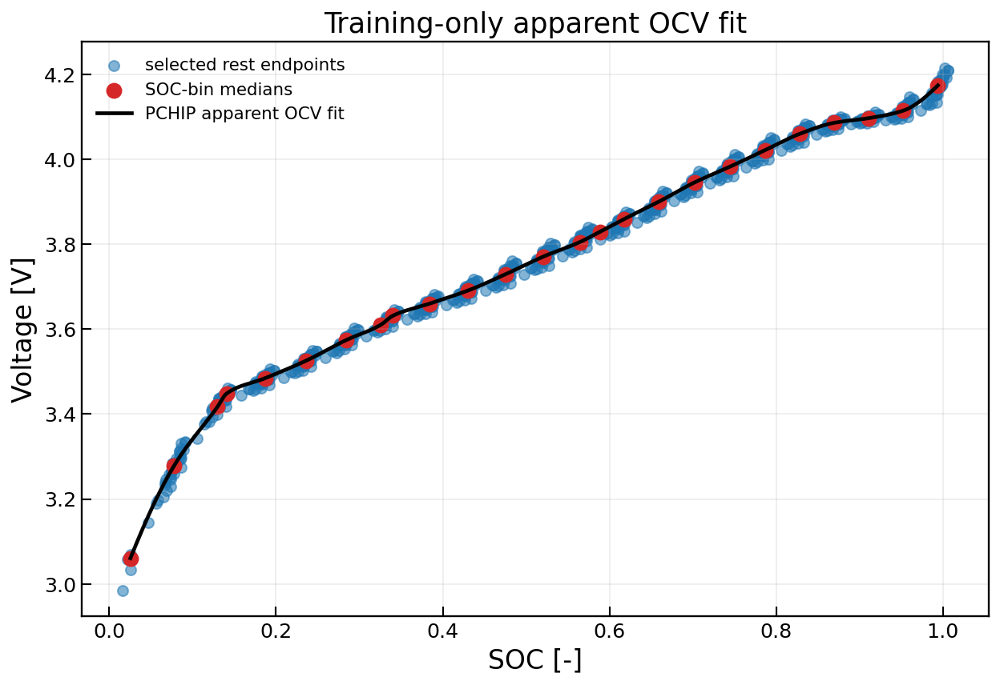

In [169]:
fig, ax = plt.subplots(figsize=(8.8, 6.0), constrained_layout=True)

ax.scatter(
    ocv_work[SOC_COL],
    ocv_work[VOLTAGE_COL],
    s=45,
    alpha=0.55,
    label="selected rest endpoints",
)
ax.scatter(
    ocv_binned["soc"],
    ocv_binned["ocv"],
    s=85,
    color="tab:red",
    label="SOC-bin medians",
)
ax.plot(
    soc_grid,
    ocv_grid,
    color="black",
    linewidth=2.4,
    label="PCHIP apparent OCV fit",
)

ax.set_xlabel("SOC [-]")
ax.set_ylabel("Voltage [V]")
ax.set_title("Training-only apparent OCV fit")
ax.grid(True, alpha=0.25)
ax.tick_params(direction="in", length=6, width=1.1)
ax.legend(frameon=False)
plt.show()

## Step 4a: Check OCV extrapolation

The OCV fit is data-supported only over the SOC range covered by the selected training rest points. Outside that range, we now use **linear extrapolation** from the nearest endpoint slope instead of allowing a cubic spline to wander.

This might be acceptable for small excursions. Before computing $\eta$, we count how many samples in each cycle fall below or above the fitted OCV range.

In [170]:
ocv_soc_min = float(ocv_binned["soc"].min())
ocv_soc_max = float(ocv_binned["soc"].max())

range_rows = []
for cycle_name, df in cycles.items():
    soc_values = df[SOC_COL].to_numpy(dtype=float)
    cycle_soc_min = float(np.min(soc_values))
    cycle_soc_max = float(np.max(soc_values))
    n_below = int(np.sum(soc_values < ocv_soc_min))
    n_above = int(np.sum(soc_values > ocv_soc_max))
    range_rows.append({
        "cycle": cycle_name,
        "cycle_soc_min": cycle_soc_min,
        "cycle_soc_max": cycle_soc_max,
        "n_samples": len(df),
        "n_below_ocv_range": n_below,
        "n_above_ocv_range": n_above,
        "pct_extrapolated": 100.0 * (n_below + n_above) / len(df),
    })

soc_range_check = pd.DataFrame(range_rows)
print(f"OCV fit range: SOC {ocv_soc_min:.4f} to {ocv_soc_max:.4f}")
display(soc_range_check)

if (soc_range_check[["n_below_ocv_range", "n_above_ocv_range"]].sum(axis=1) > 0).any():
    print("Warning: at least one cycle leaves the OCV fit range. Linear endpoint extrapolation will be used there.")

OCV fit range: SOC 0.0254 to 0.9939


,cycle,cycle_soc_min,cycle_soc_max,n_samples,n_below_ocv_range,n_above_ocv_range,pct_extrapolated
0,HWFET,3.222924e-06,1.00000,321709,6167,2219,2.606704
1,Pseudo-Random_Limit_Based,5.639281e-03,1.00577,643840,3203,15818,2.954305
2,UDDS,2.510047e-06,1.00000,317987,6854,1952,2.769296
3,US06,5.908306e-06,1.00000,236071,5023,1548,2.783485
4,WLTP,2.925443e-07,1.00000,518927,10180,7946,3.492977


## Step 5: Compute the overpotential residual

Now we compute the dynamic voltage residual:

$$\eta_k = V_k - \widehat{OCV}(SOC_k)$$

The intent is to separate the slow thermodynamic voltage baseline from the faster current-driven voltage dynamics. The later EDMDc model should learn $\eta_k$, not the entire terminal voltage directly.

In [171]:
OCV_COL = "Estimated OCV [V]"
ETA_COL = "Voltage residual eta [V]"

cycles_with_eta = {}

for cycle_name, df in cycles.items():
    work = df.copy()
    work[OCV_COL] = OCV_func(work[SOC_COL].to_numpy(dtype=float))
    work[ETA_COL] = work[VOLTAGE_COL] - work[OCV_COL]
    cycles_with_eta[cycle_name] = work

data_with_eta = pd.concat(cycles_with_eta.values(), ignore_index=True)
train_data_with_eta = pd.concat([cycles_with_eta[name] for name in TRAIN_CYCLES], ignore_index=True)
validation_data_with_eta = pd.concat([cycles_with_eta[name] for name in VALIDATION_CYCLES], ignore_index=True)

eta_summary = data_with_eta.groupby("cycle")[[OCV_COL, ETA_COL]].agg(
    ["count", "min", "max", "mean", "std"]
)
display(eta_summary)

Estimated OCV [V]                                \
                                      count       min       max      mean   
cycle                                                                       
HWFET                                321709  2.955233  4.182512  3.758457   
Pseudo-Random_Limit_Based            643840  2.978647  4.190733  3.791982   
UDDS                                 317987  2.955230  4.182512  3.758604   
US06                                 236071  2.955245  4.182512  3.759491   
WLTP                                 518927  2.955221  4.182512  3.759741   

                                    Voltage residual eta [V]            \
                                std                    count       min   
cycle                                                                    
HWFET                      0.281790                   321709 -0.253611   
Pseudo-Random_Limit_Based  0.256792                   643840 -0.483872   
UDDS                       0.280312                   317987 -0.650359   
US06                       0.280569                   236071 -0.387638   
WLTP                       0.285404                   518927 -0.320047   

                                                         
                                max      mean       std  
cycle                                                    
HWFET                      0.118289 -0.031013  0.024935  
Pseudo-Random_Limit_Based  0.239584 -0.011089  0.071932  
UDDS                       0.171305 -0.028854  0.050235  
US06                       0.132760 -0.039779  0.052638  
WLTP                       0.119090 -0.018465  0.033578

## Step 5a: Inspect $V$, $\widehat{OCV}$, $\eta$, and current

This plot is a sanity check. If $\eta$ contains a large monotonic SOC trend, then the OCV fit is probably poor. If $\eta$ mostly moves with current transients, then the decomposition is doing what we want.

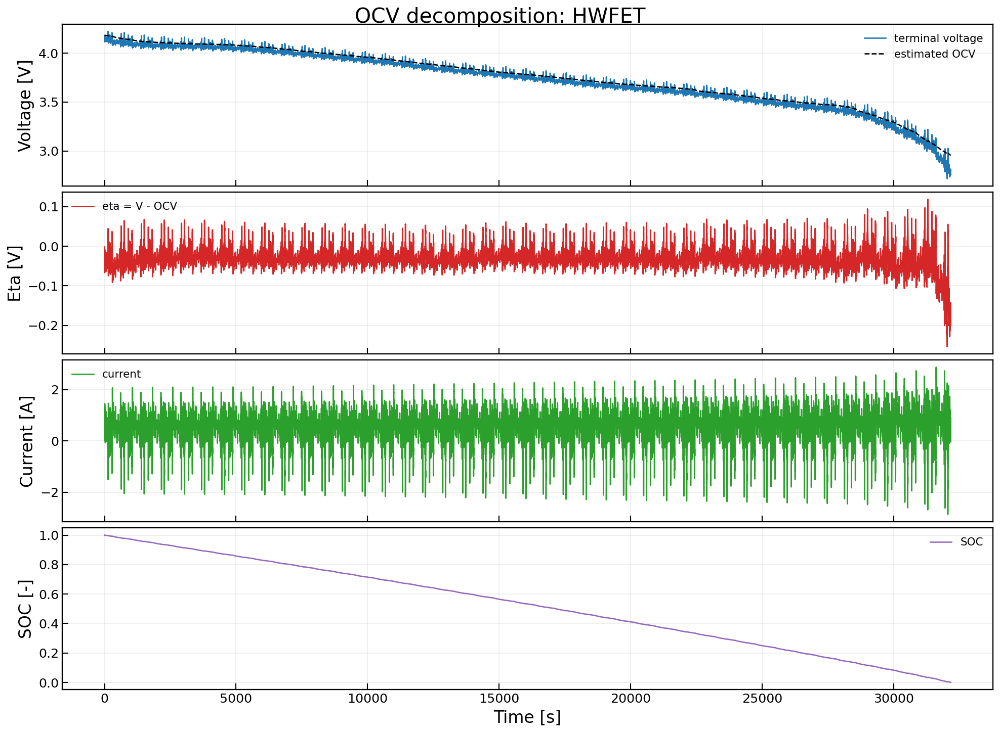

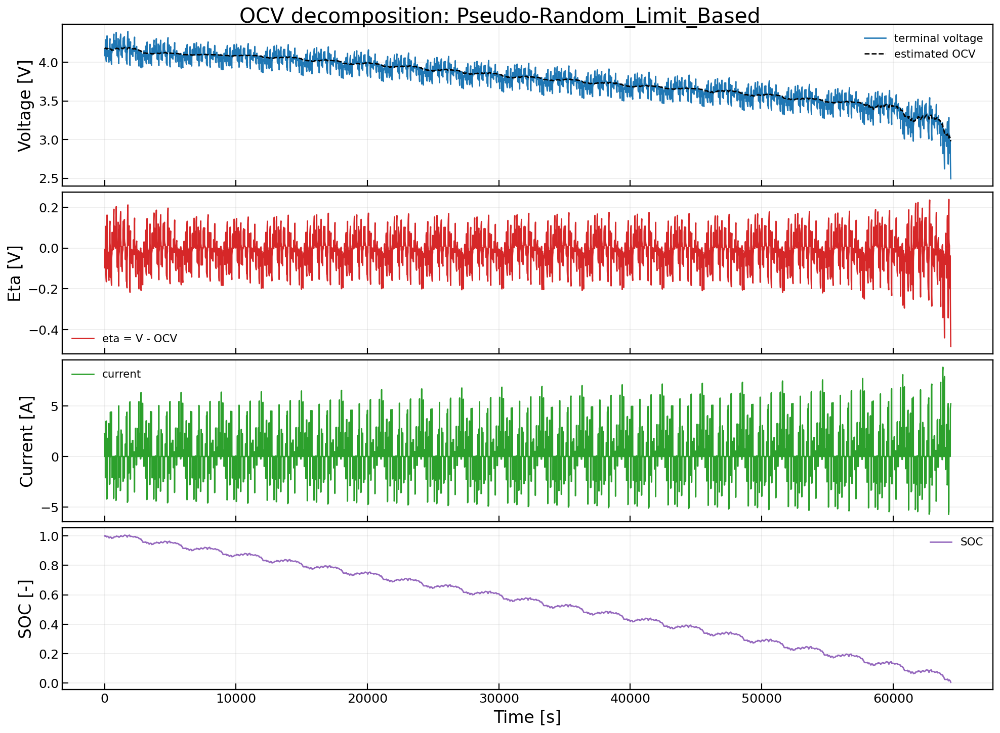

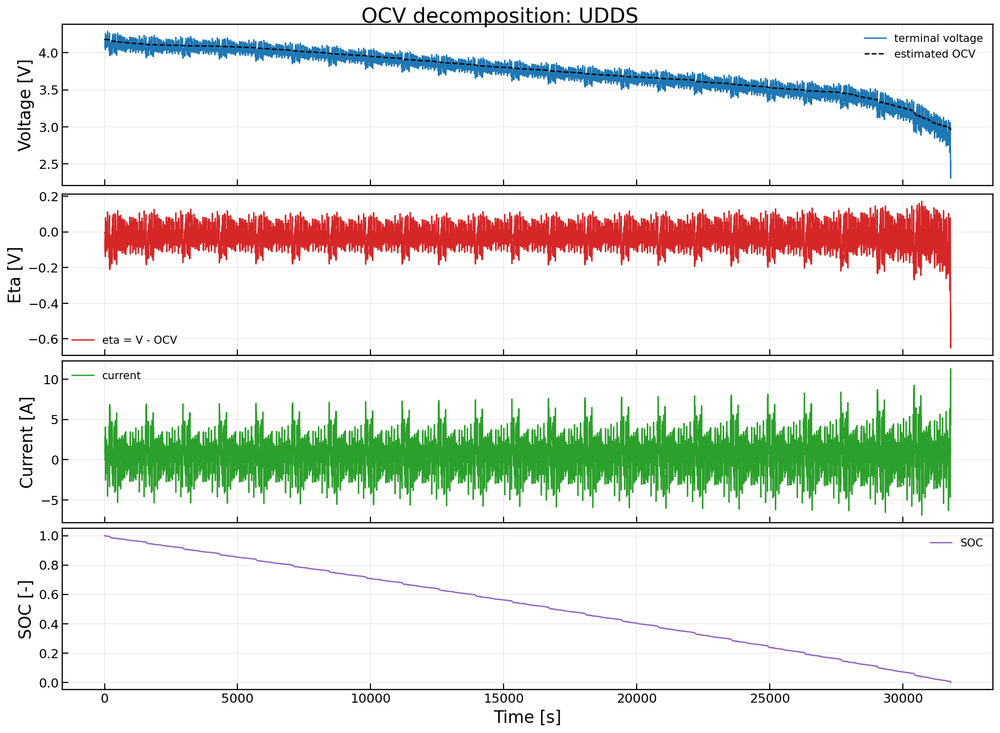

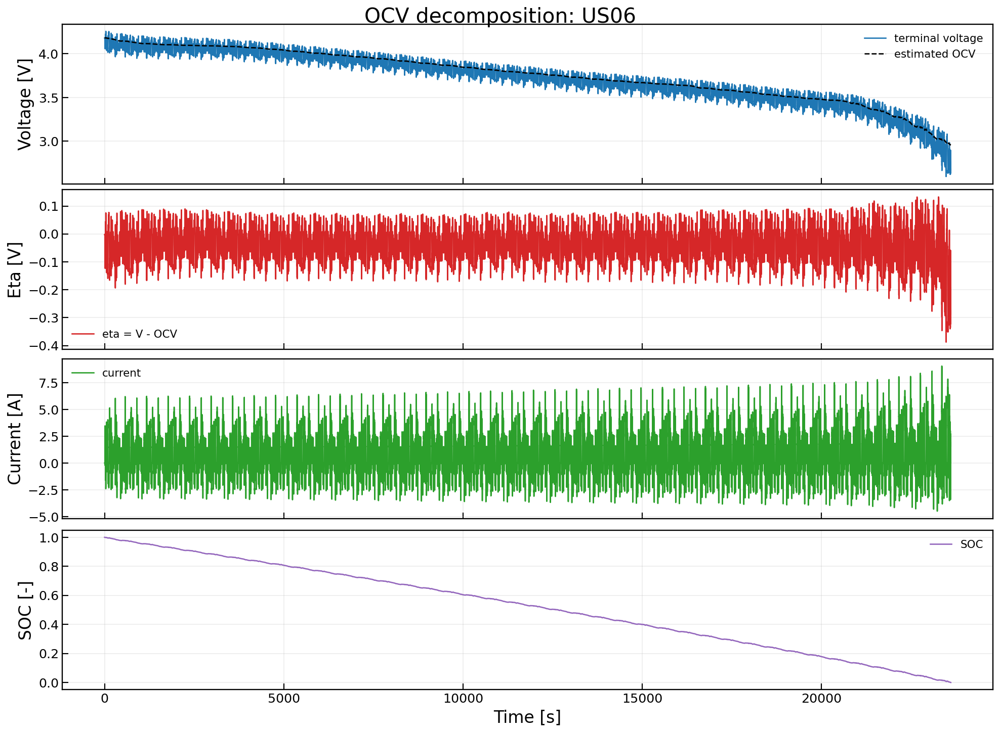

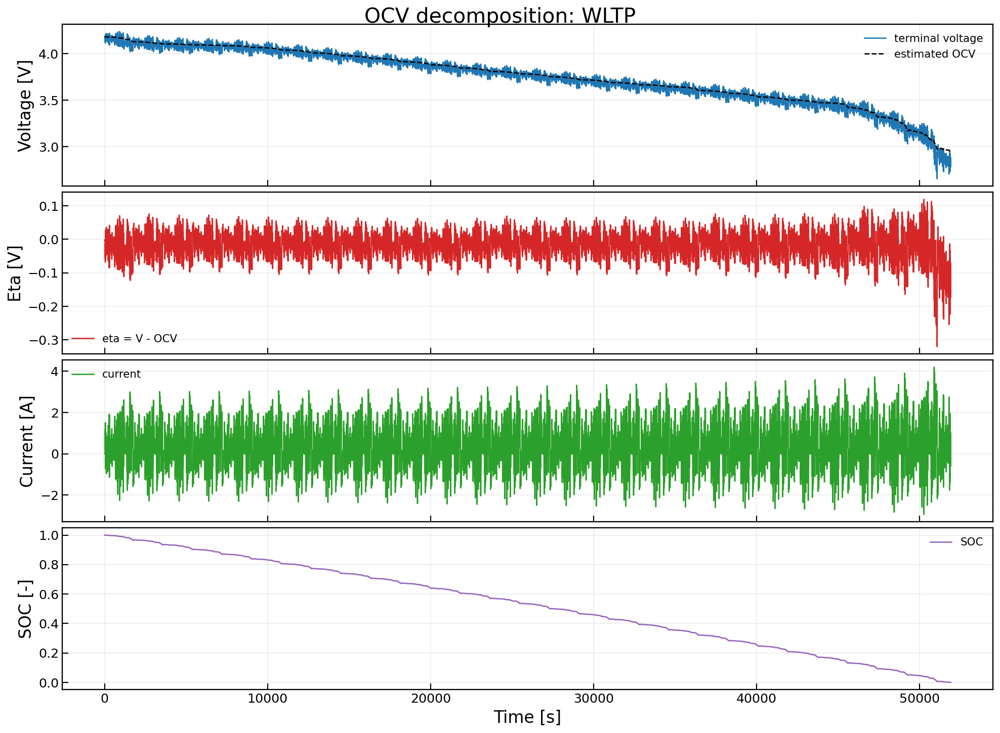

In [172]:
for cycle_name, df in cycles_with_eta.items():
    fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True, constrained_layout=True)

    axes[0].plot(df[TIME_COL], df[VOLTAGE_COL], color="tab:blue", label="terminal voltage")
    axes[0].plot(df[TIME_COL], df[OCV_COL], color="black", linestyle="--", label="estimated OCV")
    axes[1].plot(df[TIME_COL], df[ETA_COL], color="tab:red", label="eta = V - OCV")
    axes[2].plot(df[TIME_COL], df[CURRENT_COL], color="tab:green", label="current")
    axes[3].plot(df[TIME_COL], df[SOC_COL], color="tab:purple", label="SOC")

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Eta [V]")
    axes[2].set_ylabel("Current [A]")
    axes[3].set_ylabel("SOC [-]")
    axes[3].set_xlabel("Time [s]")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=6, width=1.1)
        ax.legend(frameon=False, loc="best")

    fig.suptitle(f"OCV decomposition: {cycle_name}", y=1.02)
    plt.show()

## Step 6: Fit training-only min-max scalers

Scaling is only for numerical conditioning.

For a signal $q$, the scaled value is:

$$q_{scaled} = 2\frac{q - q_{min,train}}{q_{max,train} - q_{min,train}} - 1$$

The inverse map is:

$$q = \frac{q_{scaled} + 1}{2}(q_{max,train} - q_{min,train}) + q_{min,train}$$

We fit scaling ranges using only the training cycles: `US06` and `Pseudo-Random_Limit_Based`.

In [173]:
SCALE_COLS = [ETA_COL, SOC_COL, CURRENT_COL]

scale_rows = []
scale_params = {}

for col in SCALE_COLS:
    q_min = float(train_data_with_eta[col].min())
    q_max = float(train_data_with_eta[col].max())
    q_range = q_max - q_min

    if q_range == 0:
        raise ValueError(f"Cannot scale {col}: training range is zero.")

    scale_params[col] = {"min": q_min, "max": q_max, "range": q_range}
    scale_rows.append({"signal": col, "train_min": q_min, "train_max": q_max, "train_range": q_range})

scale_table = pd.DataFrame(scale_rows)
display(scale_table)

,signal,train_min,train_max,train_range
0,Voltage residual eta [V],-0.483872,0.239584,0.723456
1,State of Charge,0.000006,1.005770,1.005764
2,Current [A],-5.746429,9.066848,14.813277


In [174]:
SCALED_ETA_COL = "eta_scaled"
SCALED_SOC_COL = "soc_scaled"
SCALED_CURRENT_COL = "current_scaled"

scaled_name = {
    ETA_COL: SCALED_ETA_COL,
    SOC_COL: SCALED_SOC_COL,
    CURRENT_COL: SCALED_CURRENT_COL,
}

cycles_scaled = {}

for cycle_name, df in cycles_with_eta.items():
    work = df.copy()

    for col in SCALE_COLS:
        q_min = scale_params[col]["min"]
        q_range = scale_params[col]["range"]
        work[scaled_name[col]] = 2.0 * (work[col] - q_min) / q_range - 1.0

    cycles_scaled[cycle_name] = work

data_scaled = pd.concat(cycles_scaled.values(), ignore_index=True)
train_data_scaled = pd.concat([cycles_scaled[name] for name in TRAIN_CYCLES], ignore_index=True)
validation_data_scaled = pd.concat([cycles_scaled[name] for name in VALIDATION_CYCLES], ignore_index=True)

scaled_summary = data_scaled.groupby("cycle")[[SCALED_ETA_COL, SCALED_SOC_COL, SCALED_CURRENT_COL]].agg(
    ["min", "max", "mean", "std"]
)
display(scaled_summary)

eta_scaled                               soc_scaled  \
                                 min       max      mean       std        min   
cycle                                                                           
HWFET                      -0.363443  0.664677  0.251931  0.068933  -1.000005   
Pseudo-Random_Limit_Based  -1.000000  1.000000  0.307012  0.198856  -0.988798   
UDDS                       -1.460254  0.811241  0.257899  0.138876  -1.000007   
US06                       -0.733961  0.704683  0.227698  0.145517  -1.000000   
WLTP                       -0.547104  0.666892  0.286620  0.092825  -1.000011   

                                                        current_scaled  \
                                max      mean       std            min   
cycle                                                                    
HWFET                      0.988527  0.038442  0.568458      -0.611794   
Pseudo-Random_Limit_Based  1.000000  0.093918  0.553181      -1.000000   
UDDS                       0.988527  0.038225  0.565978      -1.155048   
US06                       0.988527  0.040035  0.566918      -0.828308   
WLTP                       0.988527  0.043199  0.573027      -0.620425   

                                                         
                                max      mean       std  
cycle                                                    
HWFET                      0.163142 -0.148618  0.077685  
Pseudo-Random_Limit_Based  0.969554 -0.186614  0.292699  
UDDS                       1.306845 -0.147739  0.206197  
US06                       1.000000 -0.121240  0.212204  
WLTP                       0.340955 -0.177318  0.109502

## Step 6a: Check validation values outside the training scale range

A validation scaled value outside `[-1, 1]` means the validation cycle has parts beyond the training range for that signal

In [175]:
range_check_rows = []

for cycle_name in VALIDATION_CYCLES:
    df = cycles_scaled[cycle_name]

    for raw_col, scaled_col in scaled_name.items():
        values = df[scaled_col].to_numpy(dtype=float)
        n_below = int(np.sum(values < -1.0))
        n_above = int(np.sum(values > 1.0))
        range_check_rows.append({
            "cycle": cycle_name,
            "signal": raw_col,
            "scaled_min": float(np.min(values)),
            "scaled_max": float(np.max(values)),
            "n_below_minus_1": n_below,
            "n_above_plus_1": n_above,
            "pct_outside_train_range": 100.0 * (n_below + n_above) / len(df),
        })

validation_scale_check = pd.DataFrame(range_check_rows)
display(validation_scale_check)

if (validation_scale_check["pct_outside_train_range"] > 0).any():
    print("Warning: at least one validation signal leaves the training scaling range.")

,cycle,signal,scaled_min,scaled_max,n_below_minus_1,n_above_plus_1,pct_outside_train_range
0,HWFET,Voltage residual eta [V],-0.363443,0.664677,0,0,0.000000
1,HWFET,State of Charge,-1.000005,0.988527,1,0,0.000311
2,HWFET,Current [A],-0.611794,0.163142,0,0,0.000000
3,UDDS,Voltage residual eta [V],-1.460254,0.811241,85,0,0.026731
4,UDDS,State of Charge,-1.000007,0.988527,1,0,0.000314
5,UDDS,Current [A],-1.155048,1.306845,35,54,0.027989
6,WLTP,Voltage residual eta [V],-0.547104,0.666892,0,0,0.000000
7,WLTP,State of Charge,-1.000011,0.988527,16,0,0.003083
8,WLTP,Current [A],-0.620425,0.340955,0,0,0.000000


## Step 6b: Plot scaled training and validation ranges

This plot is a quick visual check that the training cycles are contained in `[-1, 1]` by construction and that any validation extrapolation is obvious.

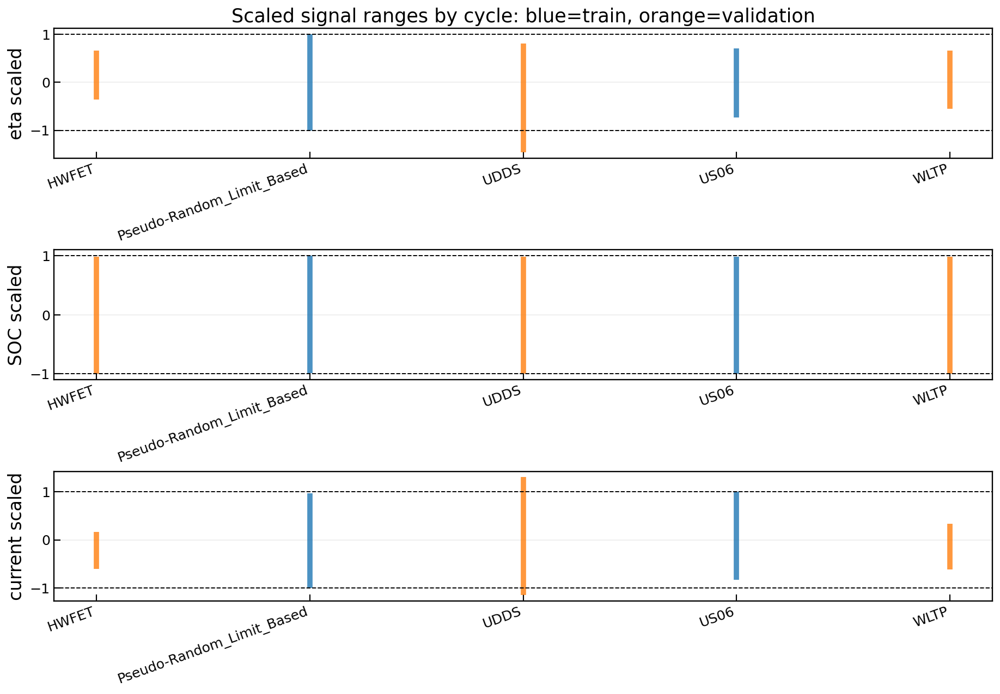

In [176]:
fig, axes = plt.subplots(3, 1, figsize=(13, 9), sharex=False, constrained_layout=True)

plot_cols = [SCALED_ETA_COL, SCALED_SOC_COL, SCALED_CURRENT_COL]
plot_labels = ["eta scaled", "SOC scaled", "current scaled"]

for ax, col, label in zip(axes, plot_cols, plot_labels):
    positions = np.arange(len(cycles_scaled))
    mins = [cycles_scaled[name][col].min() for name in cycles_scaled]
    maxs = [cycles_scaled[name][col].max() for name in cycles_scaled]
    colors = ["tab:blue" if name in TRAIN_CYCLES else "tab:orange" for name in cycles_scaled]

    ax.vlines(positions, mins, maxs, colors=colors, linewidth=5, alpha=0.8)
    ax.axhline(-1.0, color="black", linestyle="--", linewidth=1)
    ax.axhline(1.0, color="black", linestyle="--", linewidth=1)
    ax.set_xticks(positions)
    ax.set_xticklabels(list(cycles_scaled.keys()), rotation=20, ha="right")
    ax.set_ylabel(label)
    ax.grid(True, axis="y", alpha=0.25)
    ax.tick_params(direction="in", length=6, width=1.1)

axes[0].set_title("Scaled signal ranges by cycle: blue=train, orange=validation")
plt.show()

## Step 7: Training vs validation coverage diagnostics

Before building delay-embedded snapshots, we check whether validation cycles live inside the training domain. A model can fail for two different reasons:

1. the dynamics were learned poorly inside the training domain, or
2. the validation cycle asks the model to extrapolate beyond the training data.

The most important coverage spaces for the next model are:

- current vs SOC,
- residual voltage $\eta$ vs current,
- residual voltage $\eta$ vs SOC.

`HWFET` is the main validation cycle, and `UDDS` is used as a stress-test validation cycle. `WLTP` is kept for early diagnostics but is not used for the final rollout because it contains a large time-step gap.

c:\Users\piyus\anaconda3\envs\koopman_env\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


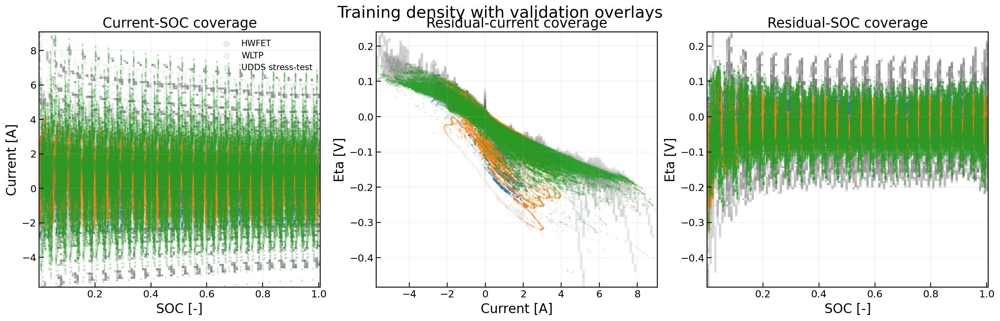

In [177]:
PRIMARY_VALIDATION_CYCLES = ["HWFET", "WLTP"]
STRESS_TEST_CYCLES = ["UDDS"]

coverage_pairs = [
    (SOC_COL, CURRENT_COL, "SOC [-]", "Current [A]", "Current-SOC coverage"),
    (CURRENT_COL, ETA_COL, "Current [A]", "Eta [V]", "Residual-current coverage"),
    (SOC_COL, ETA_COL, "SOC [-]", "Eta [V]", "Residual-SOC coverage"),
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5), constrained_layout=True)

for ax, (x_col, y_col, x_label, y_label, title) in zip(axes, coverage_pairs):
    train_x = train_data_with_eta[x_col].to_numpy(dtype=float)
    train_y = train_data_with_eta[y_col].to_numpy(dtype=float)
    good = np.isfinite(train_x) & np.isfinite(train_y)

    ax.hist2d(
        train_x[good],
        train_y[good],
        bins=120,
        cmap="Greys",
        norm=LogNorm(),
        cmin=1,
        alpha=0.85,
    )

    for cycle_name in PRIMARY_VALIDATION_CYCLES:
        df = cycles_with_eta[cycle_name]
        ax.scatter(df[x_col], df[y_col], s=2, alpha=0.12, label=cycle_name)

    for cycle_name in STRESS_TEST_CYCLES:
        df = cycles_with_eta[cycle_name]
        ax.scatter(df[x_col], df[y_col], s=2, alpha=0.12, label=f"{cycle_name} stress-test")

    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)
    ax.grid(True, alpha=0.2)
    ax.tick_params(direction="in", length=6, width=1.1)

axes[0].legend(frameon=False, markerscale=5)
fig.suptitle("Training density with validation overlays", y=1.03)
plt.show()

## Step 7a: Numeric range check by cycle

The plots show geometry, but a compact numeric table is useful too. Here we compare each validation cycle against the training min/max range for current, SOC, and $\eta$.

In [178]:
coverage_cols = [CURRENT_COL, SOC_COL, ETA_COL]

train_ranges = {}
for col in coverage_cols:
    train_ranges[col] = {
        "min": float(train_data_with_eta[col].min()),
        "max": float(train_data_with_eta[col].max()),
    }

coverage_rows = []

for cycle_name in VALIDATION_CYCLES:
    df = cycles_with_eta[cycle_name]

    for col in coverage_cols:
        values = df[col].to_numpy(dtype=float)
        train_min = train_ranges[col]["min"]
        train_max = train_ranges[col]["max"]
        n_below = int(np.sum(values < train_min))
        n_above = int(np.sum(values > train_max))

        coverage_rows.append({
            "cycle": cycle_name,
            "signal": col,
            "train_min": train_min,
            "train_max": train_max,
            "cycle_min": float(np.min(values)),
            "cycle_max": float(np.max(values)),
            "n_below_train_min": n_below,
            "n_above_train_max": n_above,
            "pct_outside_train_range": 100.0 * (n_below + n_above) / len(df),
        })

coverage_table = pd.DataFrame(coverage_rows)
display(coverage_table)

outside_summary = (
    coverage_table.groupby("cycle")["pct_outside_train_range"]
    .max()
    .sort_values(ascending=False)
)
display(outside_summary.rename("max_pct_outside_any_signal"))

,cycle,signal,train_min,train_max,cycle_min,cycle_max,n_below_train_min,n_above_train_max,pct_outside_train_range
0,HWFET,Current [A],-5.746429,9.066848,-2.871130e+00,2.868543,0,0,0.000000
1,HWFET,State of Charge,0.000006,1.005770,3.222924e-06,1.000000,1,0,0.000311
2,HWFET,Voltage residual eta [V],-0.483872,0.239584,-2.536114e-01,0.118289,0,0,0.000000
3,UDDS,Current [A],-5.746429,9.066848,-6.894815e+00,11.339539,35,54,0.027989
4,UDDS,State of Charge,0.000006,1.005770,2.510047e-06,1.000000,1,0,0.000314
5,UDDS,Voltage residual eta [V],-0.483872,0.239584,-6.503586e-01,0.171305,85,0,0.026731
6,WLTP,Current [A],-5.746429,9.066848,-2.935057e+00,4.185538,0,0,0.000000
7,WLTP,State of Charge,0.000006,1.005770,2.925443e-07,1.000000,16,0,0.003083
8,WLTP,Voltage residual eta [V],-0.483872,0.239584,-3.200466e-01,0.119090,0,0,0.000000


cycle
UDDS     0.027989
WLTP     0.003083
HWFET    0.000311
Name: max_pct_outside_any_signal, dtype: float64

## Step 8: Build delay-embedded snapshots

Now we build the state snapshots for the first EDMDc model. The minimal state is:

$$x_k = \begin{bmatrix}\eta_k \\ SOC_k\end{bmatrix}$$

Using a delay window $n_d$, the lifted delayed state is:

$$z_k = \begin{bmatrix}x_k \\ x_{k-1} \\ \cdots \\ x_{k-n_d}\end{bmatrix}$$

For the first model, the control feature is just scaled current:

$$g_k = I_k$$

The training snapshots are then:

$$z_{k+1} = A z_k + B g_k$$

Important indexing rule: each drive cycle is embedded separately. We never allow the delay history from one cycle to become the starting history for another cycle.

In [179]:
STATE_SCALED_COLS = [SCALED_ETA_COL, SCALED_SOC_COL]
CONTROL_SCALED_COLS = [SCALED_CURRENT_COL]

DELAY_CANDIDATES = [10, 25, 50]
N_DELAY = 50

print(f"State columns: {STATE_SCALED_COLS}")
print(f"Control columns: {CONTROL_SCALED_COLS}")
print(f"Default delay window: n_d = {N_DELAY} samples")

State columns: ['eta_scaled', 'soc_scaled']
Control columns: ['current_scaled']
Default delay window: n_d = 50 samples


## Step 8a: Check snapshot counts for candidate delays

For a cycle with $N$ samples and delay window $n_d$, valid delayed snapshots start at $k=n_d$ and end at $k=N-2$ because the target is $z_{k+1}$.

So the number of snapshots from one cycle is:

$$N_{snap} = N - n_d - 1$$

The delayed state dimension is:

$$n_z = 2(n_d + 1)$$

In [180]:
delay_rows = []

for n_delay in DELAY_CANDIDATES:
    z_dim = len(STATE_SCALED_COLS) * (n_delay + 1)

    for group_name, cycle_names in [
        ("train", TRAIN_CYCLES),
        ("primary_validation", PRIMARY_VALIDATION_CYCLES),
        ("stress_test", STRESS_TEST_CYCLES),
    ]:
        for cycle_name in cycle_names:
            n_samples = len(cycles_scaled[cycle_name])
            n_snapshots = max(0, n_samples - n_delay - 1)
            delay_rows.append({
                "n_delay": n_delay,
                "z_dim": z_dim,
                "group": group_name,
                "cycle": cycle_name,
                "n_samples": n_samples,
                "n_snapshots": n_snapshots,
            })

delay_count_table = pd.DataFrame(delay_rows)
display(delay_count_table)

display(
    delay_count_table.groupby(["n_delay", "group"])["n_snapshots"]
    .sum()
    .rename("total_snapshots")
    .reset_index()
)

,n_delay,z_dim,group,cycle,n_samples,n_snapshots
0,10,22,train,US06,236071,236060
1,10,22,train,Pseudo-Random_Limit_Based,643840,643829
2,10,22,primary_validation,HWFET,321709,321698
3,10,22,primary_validation,WLTP,518927,518916
4,10,22,stress_test,UDDS,317987,317976
5,25,52,train,US06,236071,236045
6,25,52,train,Pseudo-Random_Limit_Based,643840,643814
7,25,52,primary_validation,HWFET,321709,321683
8,25,52,primary_validation,WLTP,518927,518901
9,25,52,stress_test,UDDS,317987,317961


,n_delay,group,total_snapshots
0,10,primary_validation,840614
1,10,stress_test,317976
2,10,train,879889
3,25,primary_validation,840584
4,25,stress_test,317961
5,25,train,879859
6,50,primary_validation,840534
7,50,stress_test,317936
8,50,train,879809


## Step 8b: Construct delayed snapshots for the default delay

The matrices use the conventional column-snapshot form:

$$Z_{curr} = \begin{bmatrix} z_{k_1} & z_{k_2} & \cdots & z_{k_N} \end{bmatrix}$$

$$G_{curr} = \begin{bmatrix} g_{k_1} & g_{k_2} & \cdots & g_{k_N} \end{bmatrix}$$

$$Z_{next} = \begin{bmatrix} z_{k_1+1} & z_{k_2+1} & \cdots & z_{k_N+1} \end{bmatrix}$$

For this default setup with $n_d=50$, $z_k$ has $2(50+1)=102$ entries.

In [181]:
def make_delay_snapshots_for_cycle(df, n_delay, state_cols, control_cols):
    state = df[state_cols].to_numpy(dtype=float)
    control = df[control_cols].to_numpy(dtype=float)
    time = df[TIME_COL].to_numpy(dtype=float)

    z_curr_rows = []
    z_next_rows = []
    g_curr_rows = []
    t_rows = []

    for k in range(n_delay, len(df) - 1):
        history_curr = state[k - n_delay : k + 1][::-1].reshape(-1)
        history_next = state[k + 1 - n_delay : k + 2][::-1].reshape(-1)

        z_curr_rows.append(history_curr)
        z_next_rows.append(history_next)
        g_curr_rows.append(control[k])
        t_rows.append(time[k])

    return {
        "Z_curr": np.asarray(z_curr_rows).T,
        "G_curr": np.asarray(g_curr_rows).T,
        "Z_next": np.asarray(z_next_rows).T,
        "t_curr": np.asarray(t_rows),
    }

In [182]:
snapshots_by_cycle = {}

for cycle_name, df in cycles_scaled.items():
    snapshots_by_cycle[cycle_name] = make_delay_snapshots_for_cycle(
        df=df,
        n_delay=N_DELAY,
        state_cols=STATE_SCALED_COLS,
        control_cols=CONTROL_SCALED_COLS,
    )

Z_train = np.hstack([snapshots_by_cycle[name]["Z_curr"] for name in TRAIN_CYCLES])
G_train = np.hstack([snapshots_by_cycle[name]["G_curr"] for name in TRAIN_CYCLES])
Y_train = np.hstack([snapshots_by_cycle[name]["Z_next"] for name in TRAIN_CYCLES])

snapshot_shape_rows = []
for cycle_name, snap in snapshots_by_cycle.items():
    snapshot_shape_rows.append({
        "cycle": cycle_name,
        "Z_curr_shape": snap["Z_curr"].shape,
        "G_curr_shape": snap["G_curr"].shape,
        "Z_next_shape": snap["Z_next"].shape,
        "first_snapshot_time_s": snap["t_curr"][0],
        "last_snapshot_time_s": snap["t_curr"][-1],
    })

snapshot_shape_table = pd.DataFrame(snapshot_shape_rows)
display(snapshot_shape_table)

print(f"Training Z_curr shape: {Z_train.shape}")
print(f"Training G_curr shape: {G_train.shape}")
print(f"Training Z_next shape: {Y_train.shape}")

,cycle,Z_curr_shape,G_curr_shape,Z_next_shape,first_snapshot_time_s,last_snapshot_time_s
0,HWFET,"(102, 321658)","(1, 321658)","(102, 321658)",5.0,32170.7
1,Pseudo-Random_Limit_Based,"(102, 643789)","(1, 643789)","(102, 643789)",5.0,64383.8
2,UDDS,"(102, 317936)","(1, 317936)","(102, 317936)",5.0,31798.5
3,US06,"(102, 236020)","(1, 236020)","(102, 236020)",5.0,23606.9
4,WLTP,"(102, 518876)","(1, 518876)","(102, 518876)",5.0,51909.4


Training Z_curr shape: (102, 879809)
Training G_curr shape: (1, 879809)
Training Z_next shape: (102, 879809)


## Step 8c: Sanity-check the delay embedding indexing

The first two entries of each delayed state should be the current scaled state:

$$z_k[0:2] = [\eta_{scaled,k}, SOC_{scaled,k}]$$

The next two entries should be the previous sample:

$$z_k[2:4] = [\eta_{scaled,k-1}, SOC_{scaled,k-1}]$$

This check compares the constructed first snapshot against the original dataframe for one training cycle.

In [183]:
check_cycle = TRAIN_CYCLES[0]
check_df = cycles_scaled[check_cycle]
check_snap = snapshots_by_cycle[check_cycle]

k0 = N_DELAY
z0 = check_snap["Z_curr"][:, 0]

index_check = pd.DataFrame({
    "quantity": [
        "z0 eta current",
        "df eta at k0",
        "z0 SOC current",
        "df SOC at k0",
        "z0 eta previous",
        "df eta at k0-1",
        "z0 SOC previous",
        "df SOC at k0-1",
        "control snapshot",
        "df current at k0",
    ],
    "value": [
        z0[0],
        check_df[SCALED_ETA_COL].iloc[k0],
        z0[1],
        check_df[SCALED_SOC_COL].iloc[k0],
        z0[2],
        check_df[SCALED_ETA_COL].iloc[k0 - 1],
        z0[3],
        check_df[SCALED_SOC_COL].iloc[k0 - 1],
        check_snap["G_curr"][0, 0],
        check_df[SCALED_CURRENT_COL].iloc[k0],
    ],
})

print(f"Indexing check cycle: {check_cycle}")
display(index_check)

Indexing check cycle: US06


,quantity,value
0,z0 eta current,0.330965
1,df eta at k0,0.330965
2,z0 SOC current,0.988518
3,df SOC at k0,0.988518
4,z0 eta previous,0.330990
5,df eta at k0-1,0.330990
6,z0 SOC previous,0.988518
7,df SOC at k0-1,0.988518
8,control snapshot,-0.221884
9,df current at k0,-0.221884


## Step 9: SVD analysis of the augmented training matrix

For the first baseline, the control feature is just scaled current. The augmented matrix is:

$$\Omega = \begin{bmatrix} Z_{curr} \\ G_{curr} \end{bmatrix}$$

The operator fit is:

$$Z_{next} = K \Omega$$

where:

$$K = \begin{bmatrix} A & B \end{bmatrix}$$

Because $\Omega$ is short and very wide, we compute the SVD diagnostics from the small Gram matrix $\Omega\Omega^T$. This avoids storing a large `Vh` matrix while giving the same singular values.

Refer: 
1. https://databookuw.com/databookV2.pdf (Chapter 10, Section 10.1, pages 474-476) 
2. https://epubs.siam.org/doi/full/10.1137/15M1013857 (Proctor, Brunton, Kutz, 2016)

In [184]:
Omega_train = np.vstack([Z_train, G_train])

n_z = Z_train.shape[0]
n_g = G_train.shape[0]

print(f"Z_train shape: {Z_train.shape}")
print(f"G_train shape: {G_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"Omega_train shape: {Omega_train.shape}")
print(f"n_z = {n_z}, n_g = {n_g}")

Z_train shape: (102, 879809)
G_train shape: (1, 879809)
Y_train shape: (102, 879809)
Omega_train shape: (103, 879809)
n_z = 102, n_g = 1


In [185]:
gram = Omega_train @ Omega_train.T
eigvals_gram, U_omega = linalg.eigh(gram)

# eigh returns ascending eigenvalues. Reverse to descending singular values.
order = np.argsort(eigvals_gram)[::-1]
eigvals_gram = eigvals_gram[order]
U_omega = U_omega[:, order]

eigvals_gram = np.maximum(eigvals_gram, 0.0)
singular_values = np.sqrt(eigvals_gram)

positive = singular_values > 1e-12 * singular_values[0]
numerical_rank = int(np.sum(positive))
energy = singular_values**2
cumulative_energy = np.cumsum(energy) / np.sum(energy)

print(f"Numerical rank estimate: {numerical_rank} / {len(singular_values)}")
print(f"Largest singular value: {singular_values[0]:.6e}")
print(f"Smallest singular value: {singular_values[-1]:.6e}")

Numerical rank estimate: 103 / 103
Largest singular value: 3.795619e+03
Smallest singular value: 2.588953e-05


## Step 9a: Inspect singular values before choosing rank

We do not blindly use a cumulative-energy threshold. Fast voltage transients may have low variance but still matter physically. The plots below help us choose a manual rank.

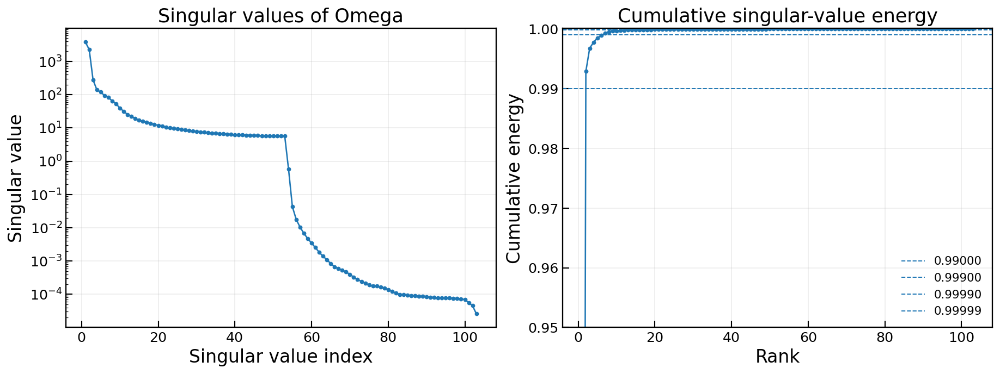

In [186]:
rank_axis = np.arange(1, len(singular_values) + 1)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.8), constrained_layout=True)

axes[0].semilogy(rank_axis, singular_values, marker="o", markersize=3)
axes[0].set_xlabel("Singular value index")
axes[0].set_ylabel("Singular value")
axes[0].set_title("Singular values of Omega")

axes[1].plot(rank_axis, cumulative_energy, marker="o", markersize=3)
for threshold in [0.99, 0.999, 0.9999, 0.99999]:
    axes[1].axhline(threshold, linestyle="--", linewidth=1, label=f"{threshold:.5f}")
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Cumulative energy")
axes[1].set_ylim(0.95, 1.0001)
axes[1].set_title("Cumulative singular-value energy")
axes[1].legend(frameon=False)

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=6, width=1.1)

plt.show()

In [187]:
rank_rows = []

for threshold in [0.99, 0.999, 0.9999, 0.99999]:
    rank_needed = int(np.searchsorted(cumulative_energy, threshold) + 1)
    rank_rows.append({
        "energy_threshold": threshold,
        "rank_needed": rank_needed,
        "energy_at_rank": cumulative_energy[rank_needed - 1],
    })

manual_rank_candidates = [20, 53, 100]
manual_rank_candidates = sorted(set([r for r in manual_rank_candidates if 1 <= r <= numerical_rank]))

for rank in manual_rank_candidates:
    rank_rows.append({
        "energy_threshold": f"manual r={rank}",
        "rank_needed": rank,
        "energy_at_rank": cumulative_energy[rank - 1],
    })

rank_table = pd.DataFrame(rank_rows)
display(rank_table)

,energy_threshold,rank_needed,energy_at_rank
0,0.99,2,0.992905
1,0.999,7,0.999284
2,0.9999,19,0.999902
3,0.99999,48,0.999992
4,manual r=20,20,0.999909
5,manual r=53,53,1.000000
6,manual r=100,100,1.000000


## Step 9b: Compare three rank-truncated EDMDc operators

To keep the first comparison simple, we will test three ranks:

- `r = 20`: conservative low-rank model,
- `r = 53`: knee-of-the-spectrum model,
- `r = 100`: nearly full-rank model, useful for checking whether extra low-energy modes help or destabilize the fit.

The selected rank below is editable after inspecting the rank comparison table.

The memory-efficient formula uses:

$$\Omega^+_r = \Omega^T U_r \Sigma_r^{-2} U_r^T$$

so:

$$K_r = Z_{next}\Omega^T U_r \Sigma_r^{-2} U_r^T$$

This avoids explicitly forming the huge right-singular-vector matrix.

In [188]:
RANKS_TO_COMPARE = [20, 53, 100]
SELECTED_MODEL_RANK = 53

if max(RANKS_TO_COMPARE) > numerical_rank:
    raise ValueError(f"Requested rank exceeds numerical_rank={numerical_rank}")

Y_Omega_T = Y_train @ Omega_train.T

def fit_ranked_operator(rank):
    U_r = U_omega[:, :rank]
    s_r = singular_values[:rank]
    K = (Y_Omega_T @ U_r) @ np.diag(1.0 / (s_r**2)) @ U_r.T
    A = K[:, :n_z]
    B = K[:, n_z:]
    return K, A, B

rank_diagnostic_rows = []
ranked_models = {}

for rank in RANKS_TO_COMPARE:
    K_tmp, A_tmp, B_tmp = fit_ranked_operator(rank)
    ranked_models[rank] = {"K": K_tmp, "A": A_tmp, "B": B_tmp}

    first_state_pred = K_tmp[:len(STATE_SCALED_COLS), :] @ Omega_train
    first_state_error = first_state_pred - Y_train[:len(STATE_SCALED_COLS), :]
    state_rmse = np.sqrt(np.mean(first_state_error**2, axis=1))

    eig_abs_tmp = np.abs(linalg.eigvals(A_tmp))
    rank_diagnostic_rows.append({
        "rank": rank,
        "energy_at_rank": cumulative_energy[rank - 1],
        "eta_one_step_rmse_scaled": state_rmse[0],
        "soc_one_step_rmse_scaled": state_rmse[1],
        "max_abs_eig_A": float(np.max(eig_abs_tmp)),
        "n_eigs_outside_unit_circle": int(np.sum(eig_abs_tmp > 1.0 + 1e-10)),
    })

rank_diagnostics = pd.DataFrame(rank_diagnostic_rows)
display(rank_diagnostics)

K_ranked = ranked_models[SELECTED_MODEL_RANK]["K"]
A_ranked = ranked_models[SELECTED_MODEL_RANK]["A"]
B_ranked = ranked_models[SELECTED_MODEL_RANK]["B"]
MODEL_RANK = SELECTED_MODEL_RANK

print(f"Selected MODEL_RANK = {MODEL_RANK}")
print(f"K_ranked shape: {K_ranked.shape}")
print(f"A_ranked shape: {A_ranked.shape}")
print(f"B_ranked shape: {B_ranked.shape}")

,rank,energy_at_rank,eta_one_step_rmse_scaled,soc_one_step_rmse_scaled,max_abs_eig_A,n_eigs_outside_unit_circle
0,20,0.999909,0.014776,0.000149,0.999992,0
1,53,1.000000,0.013302,0.000145,1.002689,2
2,100,1.000000,0.013037,0.000002,1.329127,9


Selected MODEL_RANK = 53
K_ranked shape: (102, 103)
A_ranked shape: (102, 102)
B_ranked shape: (102, 1)


## Step 9c: Training one-step residual and stability check

This is not validation yet. It only checks whether the fitted operator approximately maps training snapshots to their next delayed states and whether the learned autonomous block has unstable eigenvalues.

In [189]:
Y_train_pred = A_ranked @ Z_train + B_ranked @ G_train
train_snapshot_error = Y_train_pred - Y_train

state_rmse_scaled = np.sqrt(np.mean(train_snapshot_error[:len(STATE_SCALED_COLS), :] ** 2, axis=1))
all_z_rmse_scaled = np.sqrt(np.mean(train_snapshot_error**2))

train_fit_table = pd.DataFrame({
    "state_entry": STATE_SCALED_COLS,
    "one_step_rmse_scaled": state_rmse_scaled,
})

display(train_fit_table)
print(f"All delayed-state RMSE, scaled: {all_z_rmse_scaled:.6e}")

eig_A = linalg.eigvals(A_ranked)
eig_abs = np.abs(eig_A)
max_eig_abs = float(np.max(eig_abs))

print(f"Max |eig(A)|: {max_eig_abs:.8f}")
print(f"Number of eigenvalues with |lambda| > 1 + 1e-10: {int(np.sum(eig_abs > 1.0 + 1e-10))}")

if max_eig_abs > 1.0 + 1e-10:
    print("Warning: A has eigenvalues outside the unit circle. Inspect rollout behavior before trusting open-loop predictions.")

,state_entry,one_step_rmse_scaled
0,eta_scaled,0.013302
1,soc_scaled,0.000145


All delayed-state RMSE, scaled: 1.318440e-03
Max |eig(A)|: 1.00268886
Number of eigenvalues with |lambda| > 1 + 1e-10: 2


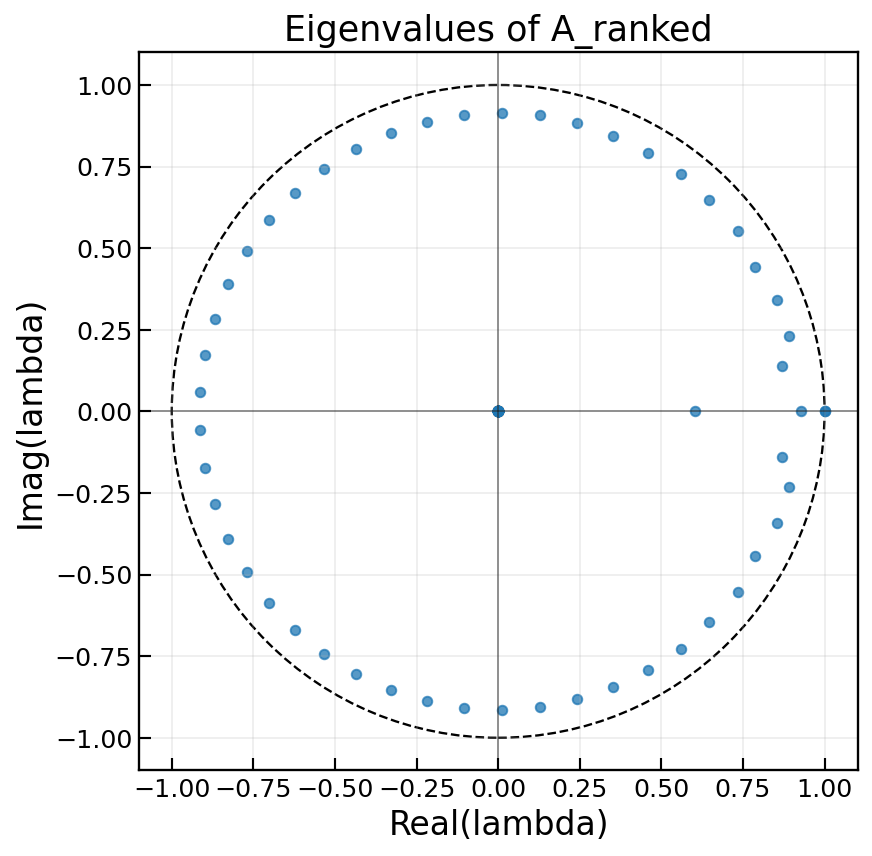

In [190]:
fig, ax = plt.subplots(figsize=(6.5, 6.0), constrained_layout=True)

unit_circle = plt.Circle((0, 0), 1.0, color="black", fill=False, linestyle="--", linewidth=1.2)
ax.add_patch(unit_circle)
ax.scatter(eig_A.real, eig_A.imag, s=24, alpha=0.75)

ax.axhline(0, color="black", linewidth=0.8, alpha=0.5)
ax.axvline(0, color="black", linewidth=0.8, alpha=0.5)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("Real(lambda)")
ax.set_ylabel("Imag(lambda)")
ax.set_title("Eigenvalues of A_ranked")
ax.grid(True, alpha=0.25)
ax.tick_params(direction="in", length=6, width=1.1)
plt.show()

## Step 10: One-step validation across candidate ranks

Now we test the fitted rank-truncated operators on held-out cycles in **one-step** mode.

One-step validation uses the measured delayed state $z_k$ and known control $g_k$ to predict only the next state:

$$\widehat{z}_{k+1} = A z_k + B g_k$$

This is not open-loop rollout yet. It answers a narrower question: given the correct current state/history, does the learned map predict the next sample accurately on unseen cycles?

We compare ranks `20`, `53`, and `100` before choosing one model for rollout.

## Step 10a: Helpers for inverse scaling and metrics

The EDMDc model predicts scaled `eta` and scaled `SOC`. For reportable voltage metrics, we unscale them and reconstruct:

$$\widehat{V}_{k+1} = \widehat{\eta}_{k+1} + \widehat{OCV}(\widehat{SOC}_{k+1})$$

For one-step validation, this uses predicted one-step SOC. Later, open-loop rollout will be a stricter test.

In [191]:
def inverse_minmax_scaled(values_scaled, raw_col):
    params = scale_params[raw_col]
    return 0.5 * (np.asarray(values_scaled, dtype=float) + 1.0) * params["range"] + params["min"]


def compute_error_metrics(y_true, y_pred):
    error = np.asarray(y_pred) - np.asarray(y_true)
    return {
        "rmse": float(np.sqrt(np.mean(error**2))),
        "mae": float(np.mean(np.abs(error))),
        "max_abs_error": float(np.max(np.abs(error))),
        "bias": float(np.mean(error)),
    }


def first_state_predictions(A, B, snapshots):
    y_pred = A @ snapshots["Z_curr"] + B @ snapshots["G_curr"]
    return y_pred[:len(STATE_SCALED_COLS), :], snapshots["Z_next"][:len(STATE_SCALED_COLS), :]

## Step 10b: Rank comparison table on validation cycles

This loop evaluates each rank on `HWFET`, `WLTP`, and `UDDS`. The `UDDS` result should be interpreted as a stress test because it slightly exceeds the training range in current and eta.

In [192]:
one_step_rows = []

for rank in RANKS_TO_COMPARE:
    A_tmp = ranked_models[rank]["A"]
    B_tmp = ranked_models[rank]["B"]

    for cycle_name in VALIDATION_CYCLES:
        snapshots = snapshots_by_cycle[cycle_name]
        pred_scaled, true_scaled = first_state_predictions(A_tmp, B_tmp, snapshots)

        eta_pred = inverse_minmax_scaled(pred_scaled[0], ETA_COL)
        eta_true = inverse_minmax_scaled(true_scaled[0], ETA_COL)
        soc_pred = inverse_minmax_scaled(pred_scaled[1], SOC_COL)
        soc_true = inverse_minmax_scaled(true_scaled[1], SOC_COL)

        voltage_pred = eta_pred + OCV_func(soc_pred)
        voltage_true = eta_true + OCV_func(soc_true)

        eta_metrics = compute_error_metrics(eta_true, eta_pred)
        soc_metrics = compute_error_metrics(soc_true, soc_pred)
        voltage_metrics = compute_error_metrics(voltage_true, voltage_pred)

        one_step_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "validation_type": "primary" if cycle_name in PRIMARY_VALIDATION_CYCLES else "stress_test",
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
            "eta_rmse_V": eta_metrics["rmse"],
            "soc_rmse": soc_metrics["rmse"],
            "voltage_bias_V": voltage_metrics["bias"],
        })

one_step_validation = pd.DataFrame(one_step_rows)
display(one_step_validation)

rank_summary = (
    one_step_validation.groupby(["rank", "validation_type"])[["voltage_rmse_V", "eta_rmse_V", "soc_rmse"]]
    .mean()
    .reset_index()
)
display(rank_summary)

,rank,cycle,validation_type,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,eta_rmse_V,soc_rmse,voltage_bias_V
0,20,HWFET,primary,0.001050,0.000613,0.018606,0.001026,6.804500e-05,-0.000014
1,20,UDDS,stress_test,0.002911,0.001561,0.095826,0.002902,7.207316e-05,-0.000031
2,20,WLTP,primary,0.001167,0.000628,0.107163,0.001140,6.351288e-05,-0.000057
3,53,HWFET,primary,0.000838,0.000489,0.014164,0.000805,6.784641e-05,0.000059
4,53,UDDS,stress_test,0.002303,0.001242,0.082286,0.002285,7.193464e-05,0.000048
5,53,WLTP,primary,0.000935,0.000495,0.107553,0.000903,6.353697e-05,0.000017
6,100,HWFET,primary,0.000608,0.000372,0.010625,0.000608,1.040005e-07,0.000104
7,100,UDDS,stress_test,0.002061,0.001122,0.066867,0.002060,4.292693e-07,0.000086
8,100,WLTP,primary,0.000735,0.000386,0.108714,0.000735,1.201475e-07,0.000029


,rank,validation_type,voltage_rmse_V,eta_rmse_V,soc_rmse
0,20,primary,0.001108,0.001083,6.577894e-05
1,20,stress_test,0.002911,0.002902,7.207316e-05
2,53,primary,0.000887,0.000854,6.569169e-05
3,53,stress_test,0.002303,0.002285,7.193464e-05
4,100,primary,0.000671,0.000671,1.120740e-07
5,100,stress_test,0.002061,0.002060,4.292693e-07


## Step 10c: Plot validation voltage RMSE by rank

This plot is a compact way to see whether the knee rank or near-full rank improves one-step validation.

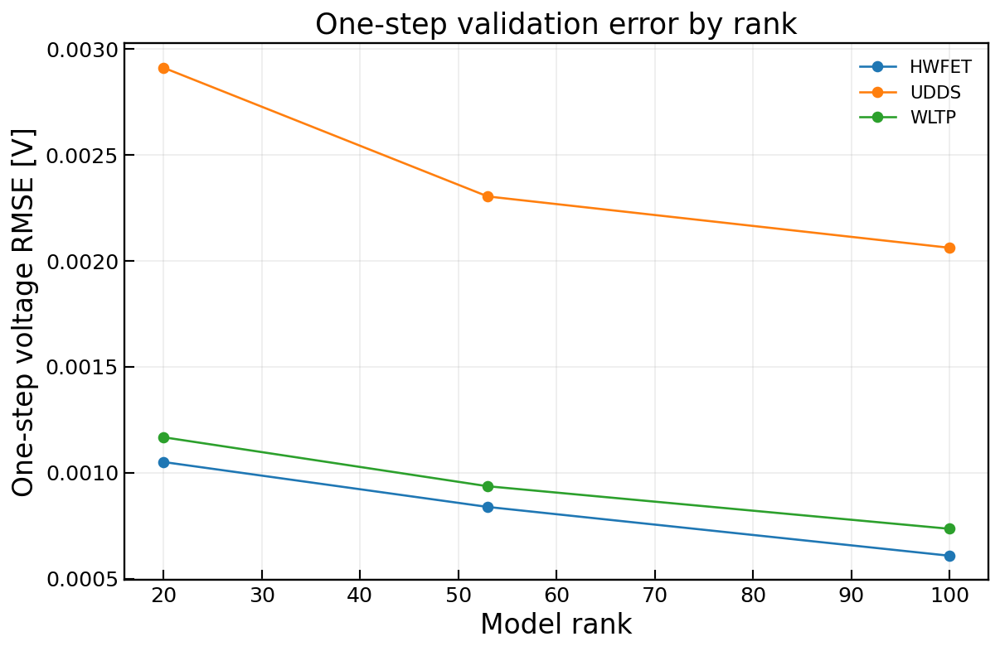

In [193]:
fig, ax = plt.subplots(figsize=(8.5, 5.5), constrained_layout=True)

for cycle_name, group in one_step_validation.groupby("cycle"):
    group = group.sort_values("rank")
    ax.plot(group["rank"], group["voltage_rmse_V"], marker="o", label=cycle_name)

ax.set_xlabel("Model rank")
ax.set_ylabel("One-step voltage RMSE [V]")
ax.set_title("One-step validation error by rank")
ax.grid(True, alpha=0.25)
ax.tick_params(direction="in", length=6, width=1.1)
ax.legend(frameon=False)
plt.show()

## Step 11: Open-loop rollout with candidate ranks

One-step validation showed that rank `53` improves over rank `20`, while avoiding the near-full-rank sensitivity risk of rank `100`. However, open-loop rollout is much stricter: the model feeds back its own predictions for many thousands of steps.

Open-loop rollout is stricter than one-step prediction. After initialization, the model feeds back its own predicted delayed state:

$$\widehat{z}_{k+1} = A\widehat{z}_k + B g_k$$

The current input $g_k$ is still taken from the validation drive cycle because current is a known external control input. The measured delayed state is used only for the initial burn-in history.

Metrics start after the burn-in window. The first $n_d + 1$ samples are initialization, not predictions.

Because open-loop linear models can diverge even when one-step prediction looks good, the rollout stops if the scaled state becomes non-finite or unphysically large.

In [194]:
ROLLOUT_RANKS_TO_COMPARE = [20, 53, 100]
ROLLOUT_STATE_ABS_LIMIT = 25.0
MAX_ROLLOUT_STEPS = 20_000

print(f"Rollout ranks to compare: {ROLLOUT_RANKS_TO_COMPARE}")
print(f"Divergence guard: abs(scaled delayed state) > {ROLLOUT_STATE_ABS_LIMIT}")
print(f"Short-rollout limit per segment: {MAX_ROLLOUT_STEPS} predicted steps")

Rollout ranks to compare: [20, 53, 100]
Divergence guard: abs(scaled delayed state) > 25.0
Short-rollout limit per segment: 20000 predicted steps


## Step 11a: Segment validation cycles at large time gaps

The model was trained on approximately uniform 0.1 s snapshots. `WLTP` contains one large time-step gap, so we should not roll a fixed-step model across that discontinuity.

We split each validation cycle into continuous segments whenever:

$$\Delta t_k > 0.15\ \mathrm{s}$$

Only segments longer than the delay window can be rolled out.

In [195]:
MAX_CONTINUOUS_DT_S = 0.15

def split_cycle_at_time_gaps(df, max_dt_s=MAX_CONTINUOUS_DT_S):
    time = df[TIME_COL].to_numpy(dtype=float)
    dt = np.diff(time)
    break_after = np.where(dt > max_dt_s)[0]

    starts = np.r_[0, break_after + 1]
    ends = np.r_[break_after + 1, len(df)]

    segments = []
    for start, end in zip(starts, ends):
        segment = df.iloc[start:end].reset_index(drop=True).copy()
        if len(segment) > N_DELAY + 1:
            segments.append({"start_index": int(start), "end_index": int(end), "df": segment})
    return segments


segment_rows = []
validation_segments = {}

for cycle_name in VALIDATION_CYCLES:
    segments = split_cycle_at_time_gaps(cycles_scaled[cycle_name])
    validation_segments[cycle_name] = segments

    for i, segment in enumerate(segments):
        seg_df = segment["df"]
        segment_rows.append({
            "cycle": cycle_name,
            "segment": i,
            "start_index": segment["start_index"],
            "end_index_exclusive": segment["end_index"],
            "n_samples": len(seg_df),
            "t_start_s": float(seg_df[TIME_COL].iloc[0]),
            "t_end_s": float(seg_df[TIME_COL].iloc[-1]),
        })

validation_segment_table = pd.DataFrame(segment_rows)
display(validation_segment_table)

,cycle,segment,start_index,end_index_exclusive,n_samples,t_start_s,t_end_s
0,HWFET,0,0,321709,321709,0.0,32170.8
1,UDDS,0,0,317987,317987,0.0,31798.6
2,WLTP,0,0,518363,518363,0.0,51836.2
3,WLTP,1,518363,518589,226,51843.6,51866.1
4,WLTP,2,518589,518733,144,51867.9,51882.2
5,WLTP,3,518733,518880,147,51887.2,51901.8


## Step 11b: Roll out one validation segment

The rollout stores predictions after the burn-in window. For the first pass, we limit the number of predicted steps per segment using `MAX_ROLLOUT_STEPS`. This keeps the experiment fast and helps identify divergence before running full-cycle rollouts.

In [196]:
def initial_delayed_state_from_segment(df, n_delay, state_cols):
    state = df[state_cols].to_numpy(dtype=float)
    return state[0 : n_delay + 1][::-1].reshape(-1)


def rollout_segment(
    df,
    A,
    B,
    n_delay,
    state_cols,
    control_cols,
    state_abs_limit=ROLLOUT_STATE_ABS_LIMIT,
    max_rollout_steps=MAX_ROLLOUT_STEPS,
):
    z = initial_delayed_state_from_segment(df, n_delay, state_cols)
    control = df[control_cols].to_numpy(dtype=float)

    pred_indices = []
    pred_scaled_rows = []

    stop_k = min(len(df) - 1, n_delay + max_rollout_steps)

    for k in range(n_delay, stop_k):
        g_k = control[k]
        z_next = A @ z + B @ g_k

        if (not np.all(np.isfinite(z_next))) or (np.max(np.abs(z_next)) > state_abs_limit):
            return {
                "result": None,
                "status": "diverged",
                "failure_k": int(k + 1),
                "failure_time_s": float(df[TIME_COL].iloc[k + 1]),
                "max_abs_state": float(np.nanmax(np.abs(z_next))),
            }

        pred_indices.append(k + 1)
        pred_scaled_rows.append(z_next[:len(state_cols)])

        z = z_next

    pred_scaled = np.asarray(pred_scaled_rows)
    pred_indices = np.asarray(pred_indices, dtype=int)

    result = df.iloc[pred_indices].copy()
    result["eta_pred_scaled"] = pred_scaled[:, 0]
    result["soc_pred_scaled"] = pred_scaled[:, 1]
    result["eta_pred"] = inverse_minmax_scaled(result["eta_pred_scaled"], ETA_COL)
    result["soc_pred"] = inverse_minmax_scaled(result["soc_pred_scaled"], SOC_COL)
    result["voltage_pred"] = result["eta_pred"] + OCV_func(result["soc_pred"].to_numpy(dtype=float))
    result["voltage_true_from_eta"] = result[ETA_COL] + OCV_func(result[SOC_COL].to_numpy(dtype=float))
    return {
        "result": result.reset_index(drop=True),
        "status": "ok_short" if stop_k < len(df) - 1 else "ok_full",
        "failure_k": None,
        "failure_time_s": None,
        "max_abs_state": float(np.max(np.abs(z))),
    }

## Step 11c: Roll out all validation cycles and compute metrics

In [197]:
rollout_rows = []
rollout_results_by_rank = {}

for rank in ROLLOUT_RANKS_TO_COMPARE:
    A_rollout = ranked_models[rank]["A"]
    B_rollout = ranked_models[rank]["B"]
    rollout_results_by_rank[rank] = {}

    for cycle_name, segments in validation_segments.items():
        cycle_results = []
        segment_statuses = []

        for segment_id, segment in enumerate(segments):
            rollout = rollout_segment(
                df=segment["df"],
                A=A_rollout,
                B=B_rollout,
                n_delay=N_DELAY,
                state_cols=STATE_SCALED_COLS,
                control_cols=CONTROL_SCALED_COLS,
            )

            segment_statuses.append({
                "segment": segment_id,
                "status": rollout["status"],
                "failure_k": rollout["failure_k"],
                "failure_time_s": rollout["failure_time_s"],
                "max_abs_state": rollout["max_abs_state"],
            })

            if rollout["result"] is not None:
                result = rollout["result"]
                result["rank"] = rank
                result["cycle"] = cycle_name
                result["segment"] = segment_id
                result["original_index"] = segment["start_index"] + result.index + N_DELAY + 1
                cycle_results.append(result)

        if len(cycle_results) > 0:
            cycle_rollout = pd.concat(cycle_results, ignore_index=True)
            rollout_results_by_rank[rank][cycle_name] = cycle_rollout

            voltage_metrics = compute_error_metrics(cycle_rollout[VOLTAGE_COL], cycle_rollout["voltage_pred"])
            eta_metrics = compute_error_metrics(cycle_rollout[ETA_COL], cycle_rollout["eta_pred"])
            soc_metrics = compute_error_metrics(cycle_rollout[SOC_COL], cycle_rollout["soc_pred"])
        else:
            cycle_rollout = pd.DataFrame()
            voltage_metrics = {"rmse": np.nan, "mae": np.nan, "max_abs_error": np.nan, "bias": np.nan}
            eta_metrics = {"rmse": np.nan}
            soc_metrics = {"rmse": np.nan}

        first_divergence = next((s for s in segment_statuses if s["status"] == "diverged"), None)
        completed_full = all(s["status"] == "ok_full" for s in segment_statuses)
        status = "diverged" if first_divergence else ("ok_full" if completed_full else "ok_short")
        rollout_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "validation_type": "primary" if cycle_name in PRIMARY_VALIDATION_CYCLES else "stress_test",
            "status": status,
            "failure_time_s": None if first_divergence is None else first_divergence["failure_time_s"],
            "n_predicted_samples": len(cycle_rollout),
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
            "eta_rmse_V": eta_metrics["rmse"],
            "soc_rmse": soc_metrics["rmse"],
            "voltage_bias_V": voltage_metrics["bias"],
        })

rollout_metrics = pd.DataFrame(rollout_rows)
display(rollout_metrics)

,rank,cycle,validation_type,status,failure_time_s,n_predicted_samples,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,eta_rmse_V,soc_rmse,voltage_bias_V
0,20,HWFET,primary,ok_short,NaN,20000,0.120043,0.099666,0.245622,0.054512,0.112218,0.091005
1,20,UDDS,stress_test,ok_short,NaN,20000,0.117629,0.096902,0.311703,0.073908,0.107003,0.080458
2,20,WLTP,primary,ok_short,NaN,20364,0.133763,0.107965,0.280406,0.067574,0.118737,0.090898
3,53,HWFET,primary,diverged,246.8,0,NaN,NaN,NaN,NaN,NaN,NaN
4,53,UDDS,stress_test,diverged,231.9,0,NaN,NaN,NaN,NaN,NaN,NaN
5,53,WLTP,primary,diverged,239.3,364,0.061396,0.049758,0.135253,0.058673,0.001255,0.031812
6,100,HWFET,primary,diverged,10.6,0,NaN,NaN,NaN,NaN,NaN,NaN
7,100,UDDS,stress_test,diverged,11.7,0,NaN,NaN,NaN,NaN,NaN,NaN
8,100,WLTP,primary,diverged,11.8,0,NaN,NaN,NaN,NaN,NaN,NaN


## Step 11d: Plot open-loop voltage predictions

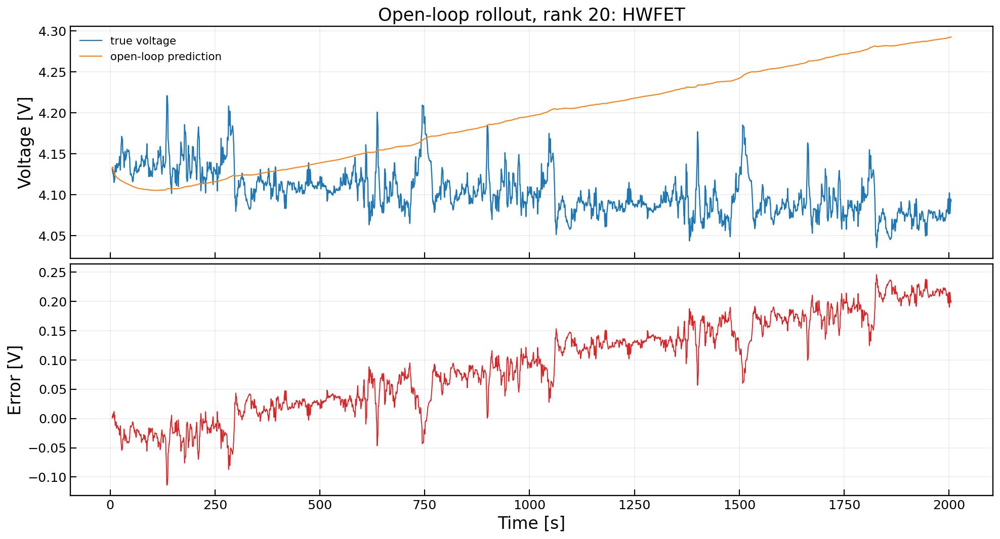

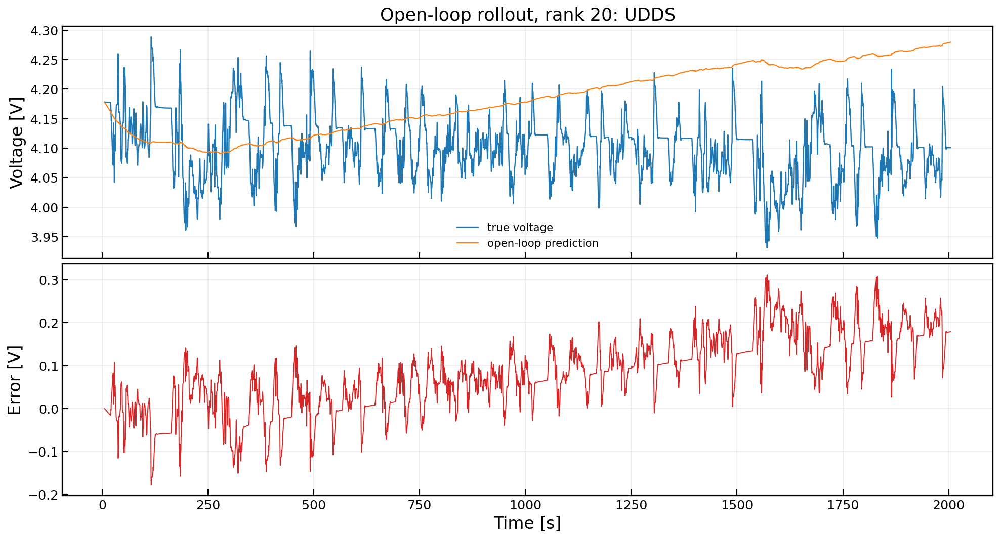

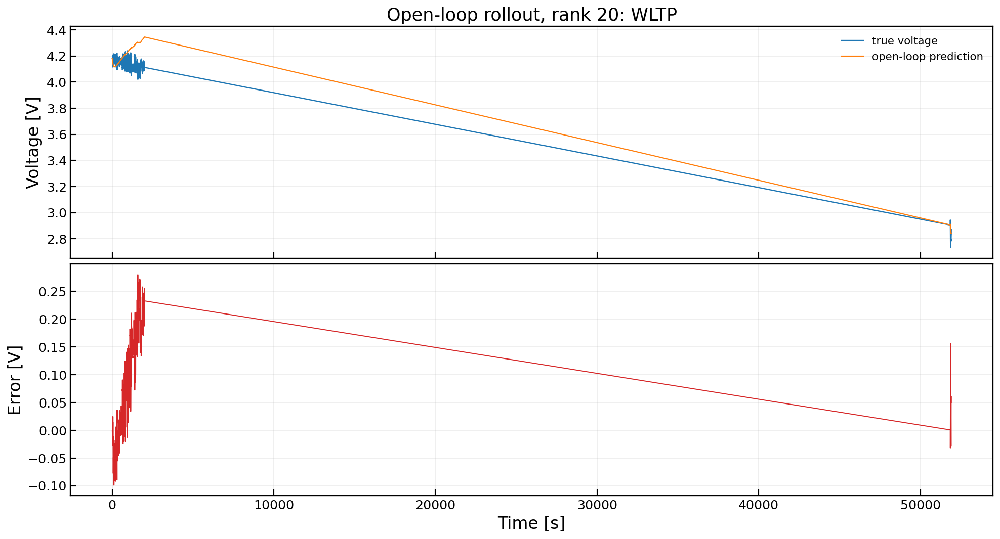

In [198]:
BEST_ROLLOUT_RANK_TO_PLOT = 20

for cycle_name, result in rollout_results_by_rank.get(BEST_ROLLOUT_RANK_TO_PLOT, {}).items():
    fig, axes = plt.subplots(2, 1, figsize=(14, 7.5), sharex=True, constrained_layout=True)

    axes[0].plot(result[TIME_COL], result[VOLTAGE_COL], label="true voltage", linewidth=1.2)
    axes[0].plot(result[TIME_COL], result["voltage_pred"], label="open-loop prediction", linewidth=1.1)
    axes[1].plot(result[TIME_COL], result["voltage_pred"] - result[VOLTAGE_COL], color="tab:red", linewidth=1.0)

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Error [V]")
    axes[1].set_xlabel("Time [s]")
    axes[0].set_title(f"Open-loop rollout, rank {BEST_ROLLOUT_RANK_TO_PLOT}: {cycle_name}")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=6, width=1.1)

    axes[0].legend(frameon=False)
    plt.show()

## Step 12: Physics-constrained SOC and eta-only EDMDc

The previous open-loop experiment showed that freely learning SOC inside the delayed EDMDc state causes large drift or divergence. SOC is not an arbitrary learned state here; with known current, it should follow charge balance.

We now constrain SOC using:

$$SOC_{k+1} = SOC_k + a\,\Delta t_k\,I_k$$

where $a$ is estimated from training data.

The EDMDc model now learns only the eta dynamics with delay embedding:

$$z_k = [\eta_k, \eta_{k-1}, \ldots, \eta_{k-n_d}]^T$$

and uses known exogenous inputs:

$$g_k = [I_k, SOC_k]^T$$

During rollout, $SOC_k$ in the control feature is the Coulomb-counted SOC, not the measured future SOC.

## Step 12a: Estimate the SOC-current gain from training data

We estimate $a$ from:

$$SOC_{k+1} - SOC_k \approx a\,\Delta t_k\,I_k$$

Because current is positive for discharge, we expect $a < 0$.

In [199]:
gain_rows = []
reg_all = []
dsoc_all = []

for cycle_name in TRAIN_CYCLES:
    df = cycles_with_eta[cycle_name]
    time = df[TIME_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    soc = df[SOC_COL].to_numpy(dtype=float)

    dt = np.diff(time)
    reg = dt * current[:-1]
    dsoc = np.diff(soc)

    gain = float(np.sum(reg * dsoc) / np.sum(reg**2))
    pred = gain * reg
    rmse = float(np.sqrt(np.mean((pred - dsoc) ** 2)))

    gain_rows.append({
        "cycle": cycle_name,
        "soc_current_gain": gain,
        "soc_step_rmse": rmse,
        "effective_capacity_Ah": -1.0 / (3600.0 * gain) if gain < 0 else np.nan,
    })

    reg_all.append(reg)
    dsoc_all.append(dsoc)

reg_all = np.concatenate(reg_all)
dsoc_all = np.concatenate(dsoc_all)
SOC_CURRENT_GAIN = float(np.sum(reg_all * dsoc_all) / np.sum(reg_all**2))
soc_gain_pred = SOC_CURRENT_GAIN * reg_all

gain_rows.append({
    "cycle": "combined_train",
    "soc_current_gain": SOC_CURRENT_GAIN,
    "soc_step_rmse": float(np.sqrt(np.mean((soc_gain_pred - dsoc_all) ** 2))),
    "effective_capacity_Ah": -1.0 / (3600.0 * SOC_CURRENT_GAIN) if SOC_CURRENT_GAIN < 0 else np.nan,
})

soc_gain_table = pd.DataFrame(gain_rows)
display(soc_gain_table)
print(f"Using SOC_CURRENT_GAIN = {SOC_CURRENT_GAIN:.12e}")

,cycle,soc_current_gain,soc_step_rmse,effective_capacity_Ah
0,US06,-0.000055,4.651076e-07,5.010387
1,Pseudo-Random_Limit_Based,-0.000055,1.088435e-06,5.020247
2,combined_train,-0.000055,9.617524e-07,5.018373


Using SOC_CURRENT_GAIN = -5.535215751430e-05


## Step 12b: Validate Coulomb-counted SOC

Before using this in voltage rollout, verify that Coulomb counting reproduces SOC on each cycle.

In [200]:
def coulomb_count_soc(df, soc_gain=SOC_CURRENT_GAIN, initial_soc=None):
    time = df[TIME_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    soc = np.empty(len(df), dtype=float)
    soc[0] = float(df[SOC_COL].iloc[0]) if initial_soc is None else float(initial_soc)

    dt = np.diff(time)
    for k in range(len(df) - 1):
        soc[k + 1] = soc[k] + soc_gain * dt[k] * current[k]
    return soc


cc_rows = []
for cycle_name, df in cycles_with_eta.items():
    soc_cc = coulomb_count_soc(df)
    metrics = compute_error_metrics(df[SOC_COL].to_numpy(dtype=float), soc_cc)
    cc_rows.append({
        "cycle": cycle_name,
        "soc_cc_rmse": metrics["rmse"],
        "soc_cc_mae": metrics["mae"],
        "soc_cc_max_abs_error": metrics["max_abs_error"],
        "soc_cc_bias": metrics["bias"],
    })

soc_coulomb_table = pd.DataFrame(cc_rows)
display(soc_coulomb_table)

,cycle,soc_cc_rmse,soc_cc_mae,soc_cc_max_abs_error,soc_cc_bias
0,HWFET,0.002100,0.001801,0.003778,0.001801
1,Pseudo-Random_Limit_Based,0.001884,0.001600,0.003561,0.001599
2,UDDS,0.002136,0.001833,0.003876,0.001833
3,US06,0.002195,0.001879,0.003999,0.001879
4,WLTP,0.002017,0.001724,0.003646,0.001724


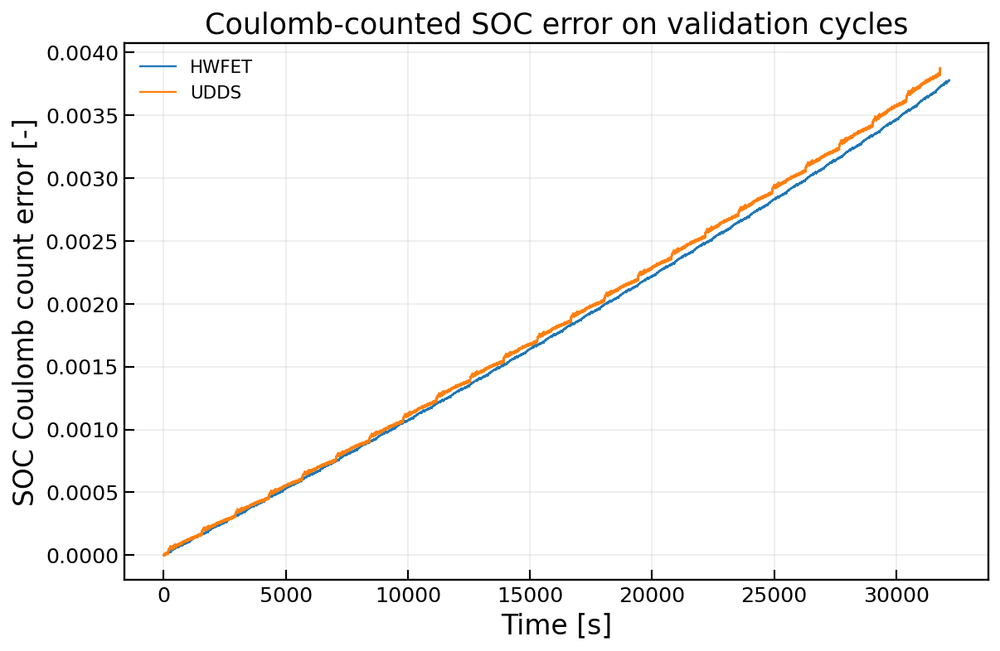

In [201]:
fig, ax = plt.subplots(figsize=(8.5, 5.5), constrained_layout=True)

for cycle_name in ["HWFET", "UDDS"]:
    df = cycles_with_eta[cycle_name]
    soc_cc = coulomb_count_soc(df)
    ax.plot(df[TIME_COL], soc_cc - df[SOC_COL].to_numpy(dtype=float), linewidth=1.2, label=cycle_name)

ax.set_xlabel("Time [s]")
ax.set_ylabel("SOC Coulomb count error [-]")
ax.set_title("Coulomb-counted SOC error on validation cycles")
ax.grid(True, alpha=0.25)
ax.tick_params(direction="in", length=6, width=1.1)
ax.legend(frameon=False)
plt.show()

## Step 12c: Build eta-only delayed snapshots

Now the delayed state contains eta only:

$$z_k = [\eta_k, \eta_{k-1}, \ldots, \eta_{k-n_d}]^T$$

The control block uses scaled current and scaled SOC:

$$g_k = [I_k, SOC_k]^T$$

During training and one-step prediction, SOC is the measured SOC. During open-loop rollout, SOC is Coulomb-counted.

In [202]:
ETA_STATE_COLS = [SCALED_ETA_COL]
ETA_CONTROL_COLS = [SCALED_CURRENT_COL, SCALED_SOC_COL]
ETA_DELAY = N_DELAY

def make_eta_delay_snapshots_for_cycle(df, n_delay, state_cols=ETA_STATE_COLS, control_cols=ETA_CONTROL_COLS):
    state = df[state_cols].to_numpy(dtype=float)
    control = df[control_cols].to_numpy(dtype=float)
    time = df[TIME_COL].to_numpy(dtype=float)

    z_curr_rows = []
    z_next_rows = []
    g_curr_rows = []
    t_rows = []

    for k in range(n_delay, len(df) - 1):
        z_curr_rows.append(state[k - n_delay : k + 1][::-1].reshape(-1))
        z_next_rows.append(state[k + 1 - n_delay : k + 2][::-1].reshape(-1))
        g_curr_rows.append(control[k])
        t_rows.append(time[k])

    return {
        "Z_curr": np.asarray(z_curr_rows).T,
        "G_curr": np.asarray(g_curr_rows).T,
        "Z_next": np.asarray(z_next_rows).T,
        "t_curr": np.asarray(t_rows),
    }


eta_snapshots_by_cycle = {}
for cycle_name, df in cycles_scaled.items():
    eta_snapshots_by_cycle[cycle_name] = make_eta_delay_snapshots_for_cycle(df, ETA_DELAY)

Z_eta_train = np.hstack([eta_snapshots_by_cycle[name]["Z_curr"] for name in TRAIN_CYCLES])
G_eta_train = np.hstack([eta_snapshots_by_cycle[name]["G_curr"] for name in TRAIN_CYCLES])
Y_eta_train = np.hstack([eta_snapshots_by_cycle[name]["Z_next"] for name in TRAIN_CYCLES])

print(f"Z_eta_train shape: {Z_eta_train.shape}")
print(f"G_eta_train shape: {G_eta_train.shape}")
print(f"Y_eta_train shape: {Y_eta_train.shape}")

Z_eta_train shape: (51, 879809)
G_eta_train shape: (2, 879809)
Y_eta_train shape: (51, 879809)


## Step 12d: Fit eta-only EDMDc operators by rank

In [203]:
Omega_eta_train = np.vstack([Z_eta_train, G_eta_train])
n_eta_z = Z_eta_train.shape[0]
n_eta_g = G_eta_train.shape[0]

gram_eta = Omega_eta_train @ Omega_eta_train.T
eigvals_eta, U_eta = linalg.eigh(gram_eta)
order = np.argsort(eigvals_eta)[::-1]
eigvals_eta = np.maximum(eigvals_eta[order], 0.0)
U_eta = U_eta[:, order]
s_eta = np.sqrt(eigvals_eta)

positive_eta = s_eta > 1e-12 * s_eta[0]
eta_numerical_rank = int(np.sum(positive_eta))
eta_cumulative_energy = np.cumsum(s_eta**2) / np.sum(s_eta**2)

ETA_RANKS_TO_COMPARE = sorted(set([10, 20, 40, min(53, eta_numerical_rank)]))
ETA_RANKS_TO_COMPARE = [r for r in ETA_RANKS_TO_COMPARE if 1 <= r <= eta_numerical_rank]

print(f"Omega_eta_train shape: {Omega_eta_train.shape}")
print(f"eta-only numerical rank: {eta_numerical_rank} / {len(s_eta)}")
print(f"eta ranks to compare: {ETA_RANKS_TO_COMPARE}")

Omega_eta_train shape: (53, 879809)
eta-only numerical rank: 53 / 53
eta ranks to compare: [10, 20, 40, 53]


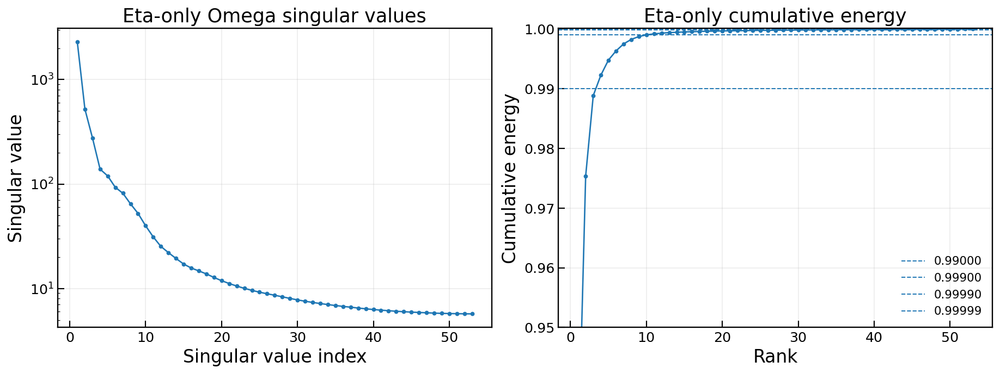

In [204]:
rank_axis = np.arange(1, len(s_eta) + 1)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.8), constrained_layout=True)
axes[0].semilogy(rank_axis, s_eta, marker="o", markersize=3)
axes[0].set_xlabel("Singular value index")
axes[0].set_ylabel("Singular value")
axes[0].set_title("Eta-only Omega singular values")

axes[1].plot(rank_axis, eta_cumulative_energy, marker="o", markersize=3)
for threshold in [0.99, 0.999, 0.9999, 0.99999]:
    axes[1].axhline(threshold, linestyle="--", linewidth=1, label=f"{threshold:.5f}")
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Cumulative energy")
axes[1].set_ylim(0.95, 1.0001)
axes[1].set_title("Eta-only cumulative energy")
axes[1].legend(frameon=False)

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=6, width=1.1)

plt.show()

In [205]:
Y_eta_Omega_T = Y_eta_train @ Omega_eta_train.T

def fit_eta_ranked_operator(rank):
    U_r = U_eta[:, :rank]
    s_r = s_eta[:rank]
    K = (Y_eta_Omega_T @ U_r) @ np.diag(1.0 / (s_r**2)) @ U_r.T
    A = K[:, :n_eta_z]
    B = K[:, n_eta_z:]
    return K, A, B


eta_ranked_models = {}
eta_rank_rows = []

for rank in ETA_RANKS_TO_COMPARE:
    K_tmp, A_tmp, B_tmp = fit_eta_ranked_operator(rank)
    eta_ranked_models[rank] = {"K": K_tmp, "A": A_tmp, "B": B_tmp}

    eta_pred_scaled = K_tmp[0:1, :] @ Omega_eta_train
    eta_true_scaled = Y_eta_train[0:1, :]
    eta_rmse_scaled = float(np.sqrt(np.mean((eta_pred_scaled - eta_true_scaled) ** 2)))
    eig_abs_tmp = np.abs(linalg.eigvals(A_tmp))

    eta_rank_rows.append({
        "rank": rank,
        "energy_at_rank": eta_cumulative_energy[rank - 1],
        "eta_train_one_step_rmse_scaled": eta_rmse_scaled,
        "max_abs_eig_A": float(np.max(eig_abs_tmp)),
        "n_eigs_outside_unit_circle": int(np.sum(eig_abs_tmp > 1.0 + 1e-10)),
    })

eta_rank_diagnostics = pd.DataFrame(eta_rank_rows)
display(eta_rank_diagnostics)

,rank,energy_at_rank,eta_train_one_step_rmse_scaled,max_abs_eig_A,n_eigs_outside_unit_circle
0,10,0.999023,0.022169,0.993135,0
1,20,0.999684,0.014778,0.998403,0
2,40,0.999920,0.013359,1.002419,1
3,53,1.000000,0.013302,1.002693,1


## Step 12e: Open-loop rollout with Coulomb-counted SOC

For this first constrained rollout, skip `WLTP` and use:

- `HWFET` as primary validation,
- `UDDS` as stress-test validation.

SOC is propagated physically. Eta is predicted by the eta-only delayed EDMDc model.

In [206]:
CONSTRAINED_VALIDATION_CYCLES = ["HWFET", "UDDS"]
CONSTRAINED_MAX_ROLLOUT_STEPS = 20_000
CONSTRAINED_STATE_ABS_LIMIT = 25.0

def rollout_eta_constrained_segment(
    df,
    A,
    B,
    n_delay=ETA_DELAY,
    max_rollout_steps=CONSTRAINED_MAX_ROLLOUT_STEPS,
    state_abs_limit=CONSTRAINED_STATE_ABS_LIMIT,
):
    eta_scaled = df[SCALED_ETA_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    time = df[TIME_COL].to_numpy(dtype=float)

    z = eta_scaled[0 : n_delay + 1][::-1].copy()
    soc_cc = np.empty(len(df), dtype=float)
    soc_cc[: n_delay + 1] = df[SOC_COL].to_numpy(dtype=float)[: n_delay + 1]

    pred_indices = []
    eta_pred_scaled_rows = []
    soc_pred_rows = []

    stop_k = min(len(df) - 1, n_delay + max_rollout_steps)

    for k in range(n_delay, stop_k):
        dt = time[k + 1] - time[k]
        soc_next = soc_cc[k] + SOC_CURRENT_GAIN * dt * current[k]

        current_scaled = 2.0 * (current[k] - scale_params[CURRENT_COL]["min"]) / scale_params[CURRENT_COL]["range"] - 1.0
        soc_control_scaled = 2.0 * (soc_cc[k] - scale_params[SOC_COL]["min"]) / scale_params[SOC_COL]["range"] - 1.0
        g_k = np.array([current_scaled, soc_control_scaled], dtype=float)

        z_next = A @ z + B @ g_k

        if (not np.all(np.isfinite(z_next))) or (np.max(np.abs(z_next)) > state_abs_limit):
            return {
                "result": None,
                "status": "diverged",
                "failure_k": int(k + 1),
                "failure_time_s": float(time[k + 1]),
                "max_abs_state": float(np.nanmax(np.abs(z_next))),
            }

        soc_cc[k + 1] = soc_next
        pred_indices.append(k + 1)
        eta_pred_scaled_rows.append(z_next[0])
        soc_pred_rows.append(soc_next)
        z = z_next

    pred_indices = np.asarray(pred_indices, dtype=int)
    result = df.iloc[pred_indices].copy()
    result["eta_pred_scaled"] = np.asarray(eta_pred_scaled_rows, dtype=float)
    result["eta_pred"] = inverse_minmax_scaled(result["eta_pred_scaled"], ETA_COL)
    result["soc_coulomb"] = np.asarray(soc_pred_rows, dtype=float)
    result["voltage_pred"] = result["eta_pred"] + OCV_func(result["soc_coulomb"].to_numpy(dtype=float))
    return {
        "result": result.reset_index(drop=True),
        "status": "ok_short" if stop_k < len(df) - 1 else "ok_full",
        "failure_k": None,
        "failure_time_s": None,
        "max_abs_state": float(np.max(np.abs(z))),
    }

In [207]:
constrained_rollout_rows = []
constrained_rollout_results = {}

for rank in ETA_RANKS_TO_COMPARE:
    A_tmp = eta_ranked_models[rank]["A"]
    B_tmp = eta_ranked_models[rank]["B"]
    constrained_rollout_results[rank] = {}

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        df = cycles_scaled[cycle_name]
        rollout = rollout_eta_constrained_segment(df, A_tmp, B_tmp)

        if rollout["result"] is not None:
            result = rollout["result"]
            constrained_rollout_results[rank][cycle_name] = result

            voltage_metrics = compute_error_metrics(result[VOLTAGE_COL], result["voltage_pred"])
            eta_metrics = compute_error_metrics(result[ETA_COL], result["eta_pred"])
            soc_metrics = compute_error_metrics(result[SOC_COL], result["soc_coulomb"])
        else:
            voltage_metrics = {"rmse": np.nan, "mae": np.nan, "max_abs_error": np.nan, "bias": np.nan}
            eta_metrics = {"rmse": np.nan}
            soc_metrics = {"rmse": np.nan}

        constrained_rollout_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "status": rollout["status"],
            "failure_time_s": rollout["failure_time_s"],
            "n_predicted_samples": 0 if rollout["result"] is None else len(rollout["result"]),
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
            "eta_rmse_V": eta_metrics["rmse"],
            "soc_rmse": soc_metrics["rmse"],
            "voltage_bias_V": voltage_metrics["bias"],
        })

constrained_rollout_metrics = pd.DataFrame(constrained_rollout_rows)
display(constrained_rollout_metrics)

,rank,cycle,status,failure_time_s,n_predicted_samples,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,eta_rmse_V,soc_rmse,voltage_bias_V
0,10,HWFET,ok_short,NaN,20000,0.026819,0.022709,0.114054,0.026907,0.000121,-0.020429
1,10,UDDS,ok_short,NaN,20000,0.050040,0.037786,0.199656,0.050099,0.000139,-0.024072
2,20,HWFET,ok_short,NaN,20000,0.060242,0.055804,0.160700,0.060349,0.000121,-0.055773
3,20,UDDS,ok_short,NaN,20000,0.078254,0.065715,0.220748,0.078349,0.000139,-0.056697
4,40,HWFET,diverged,264.7,0,NaN,NaN,NaN,NaN,NaN,NaN
5,40,UDDS,diverged,260.2,0,NaN,NaN,NaN,NaN,NaN,NaN
6,53,HWFET,diverged,246.3,0,NaN,NaN,NaN,NaN,NaN,NaN
7,53,UDDS,diverged,231.6,0,NaN,NaN,NaN,NaN,NaN,NaN


## Step 12f: Constrained rollout RMSE summary

This chart summarizes the current physics-constrained model. Stable rollouts are shown as bars; diverged rollouts are annotated separately.

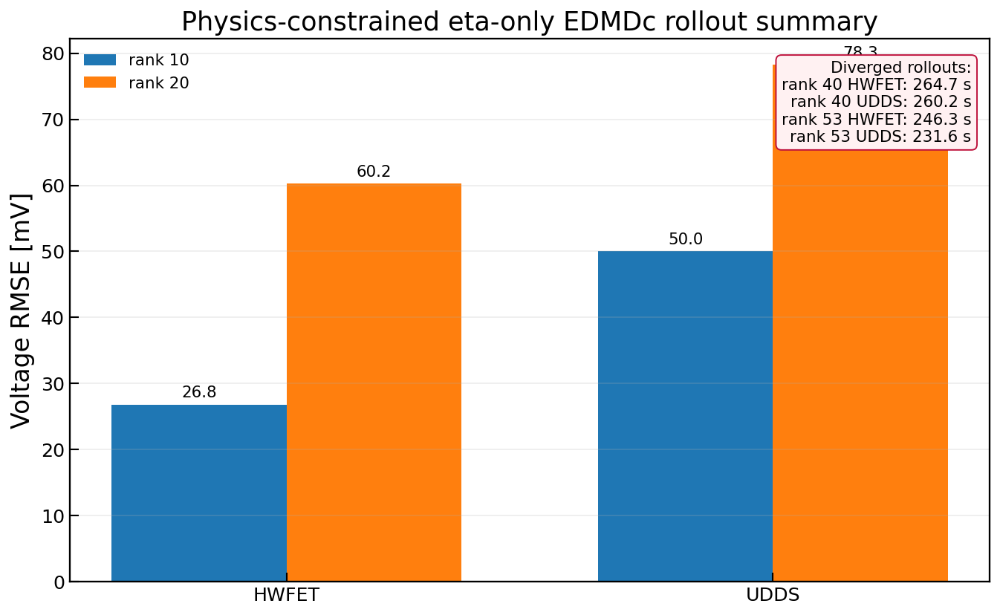

In [208]:
rmse_plot = constrained_rollout_metrics.copy()
rmse_plot["voltage_rmse_mV"] = 1000.0 * rmse_plot["voltage_rmse_V"]

stable = rmse_plot.loc[rmse_plot["status"].str.startswith("ok")].copy()
diverged = rmse_plot.loc[rmse_plot["status"] == "diverged"].copy()

fig, ax = plt.subplots(figsize=(9.5, 5.8), constrained_layout=True)

bar_width = 0.36
cycles_for_plot = CONSTRAINED_VALIDATION_CYCLES
x = np.arange(len(cycles_for_plot))
stable_ranks = sorted(stable["rank"].unique())
colors = {10: "tab:blue", 20: "tab:orange", 40: "tab:red", 53: "tab:purple"}

for i, rank in enumerate(stable_ranks):
    values = []
    for cycle_name in cycles_for_plot:
        match = stable.loc[(stable["rank"] == rank) & (stable["cycle"] == cycle_name), "voltage_rmse_mV"]
        values.append(float(match.iloc[0]) if len(match) else np.nan)

    offset = (i - (len(stable_ranks) - 1) / 2.0) * bar_width
    bars = ax.bar(x + offset, values, width=bar_width, label=f"rank {rank}", color=colors.get(rank, None))
    ax.bar_label(bars, fmt="%.1f", padding=3, fontsize=11)

if len(diverged) > 0:
    diverged_text = []
    for _, row in diverged.iterrows():
        diverged_text.append(f"rank {int(row['rank'])} {row['cycle']}: {row['failure_time_s']:.1f} s")
    ax.text(
        0.98,
        0.96,
        "Diverged rollouts:\n" + "\n".join(diverged_text),
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=11,
        bbox={"boxstyle": "round,pad=0.35", "facecolor": "#fff1f2", "edgecolor": "#be123c"},
    )

ax.set_xticks(x)
ax.set_xticklabels(cycles_for_plot)
ax.set_ylabel("Voltage RMSE [mV]")
ax.set_title("Physics-constrained eta-only EDMDc rollout summary")
ax.grid(True, axis="y", alpha=0.25)
ax.tick_params(direction="in", length=6, width=1.1)
ax.legend(frameon=False, loc="upper left")

fig.savefig("interim_constrained_rollout_rmse_summary_from_notebook.svg", bbox_inches="tight")
plt.show()

## Step 12g: Plot constrained rollout voltage predictions

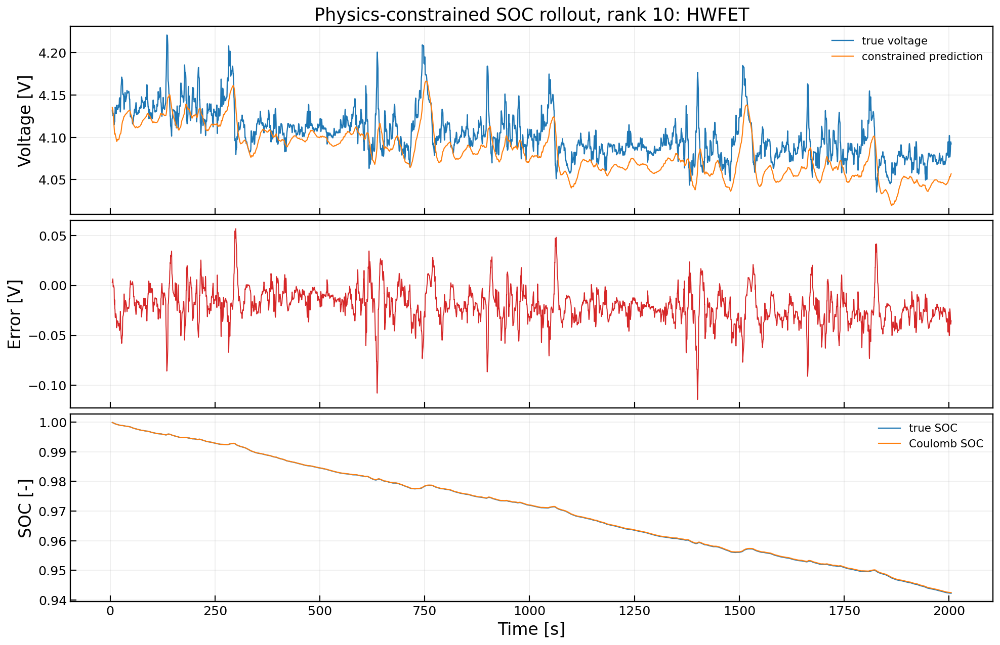

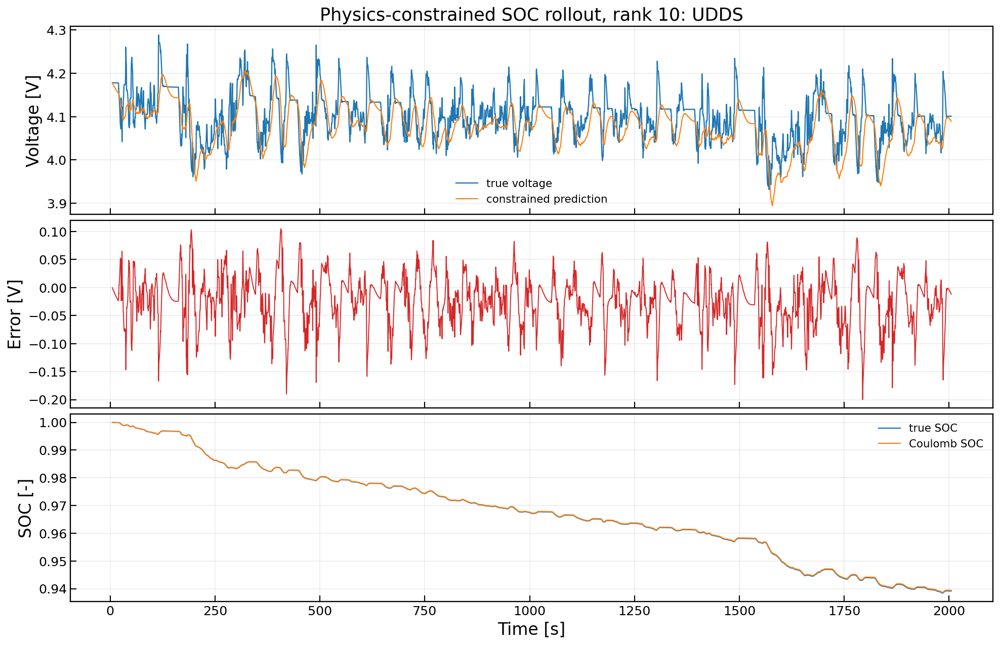

In [209]:
BEST_CONSTRAINED_RANK_TO_PLOT = ETA_RANKS_TO_COMPARE[0]

for cycle_name, result in constrained_rollout_results.get(BEST_CONSTRAINED_RANK_TO_PLOT, {}).items():
    fig, axes = plt.subplots(3, 1, figsize=(14, 9), sharex=True, constrained_layout=True)

    axes[0].plot(result[TIME_COL], result[VOLTAGE_COL], label="true voltage", linewidth=1.2)
    axes[0].plot(result[TIME_COL], result["voltage_pred"], label="constrained prediction", linewidth=1.1)
    axes[1].plot(result[TIME_COL], result["voltage_pred"] - result[VOLTAGE_COL], color="tab:red", linewidth=1.0)
    axes[2].plot(result[TIME_COL], result[SOC_COL], label="true SOC", linewidth=1.2)
    axes[2].plot(result[TIME_COL], result["soc_coulomb"], label="Coulomb SOC", linewidth=1.1)

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Error [V]")
    axes[2].set_ylabel("SOC [-]")
    axes[2].set_xlabel("Time [s]")
    axes[0].set_title(f"Physics-constrained SOC rollout, rank {BEST_CONSTRAINED_RANK_TO_PLOT}: {cycle_name}")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=6, width=1.1)

    axes[0].legend(frameon=False)
    axes[2].legend(frameon=False)
    plt.show()

At this point we inspect:

- whether Coulomb-counted SOC matches true SOC,
- whether eta-only EDMDc remains finite in open loop,
- which eta-only rank is best for HWFET and UDDS,
- whether voltage error is now mainly eta-model error rather than SOC drift.

Only after this should we add asymmetric/nonlinear current features.

## Step 13a: OCV-only and OCV-plus-ohmic baselines

Before adding a richer EDMDc input dictionary, we need simple reference models. These baselines tell us how much error remains after the OCV curve alone, and after adding the simplest current-dependent voltage drop.

The OCV-only model is:

$$\widehat{V}_k = \widehat{OCV}(SOC_k)$$

The ohmic baseline fits one training-only scalar gain from the residual:

$$\eta_k = V_k - \widehat{OCV}(SOC_k) \approx R_I I_k$$

and reconstructs voltage as:

$$\widehat{V}_k = \widehat{OCV}(SOC_k) + R_I I_k$$

Here $R_I$ is an empirical current-to-voltage gain. Its sign depends on the current convention, so it should not be interpreted as a physical positive resistance without checking the sign convention.

In [210]:
BASELINE_VALIDATION_CYCLES = CONSTRAINED_VALIDATION_CYCLES.copy()

required_columns = [TIME_COL, CURRENT_COL, VOLTAGE_COL, SOC_COL, OCV_COL, ETA_COL]
missing_columns = [col for col in required_columns if col not in train_data_with_eta.columns]
if missing_columns:
    raise ValueError(f"Missing columns needed for baselines: {missing_columns}")

I_train = train_data_with_eta[CURRENT_COL].to_numpy(dtype=float)
eta_train = train_data_with_eta[ETA_COL].to_numpy(dtype=float)
finite_train = np.isfinite(I_train) & np.isfinite(eta_train)
I_train = I_train[finite_train]
eta_train = eta_train[finite_train]

if np.sum(I_train**2) == 0:
    raise ValueError("Training current is zero everywhere; cannot fit ohmic gain.")

OHMIC_GAIN_V_PER_A = float(np.sum(I_train * eta_train) / np.sum(I_train**2))
print(f"Training-only ohmic gain R_I = {OHMIC_GAIN_V_PER_A:.6f} V/A")
print("Sign follows the dataset current convention; this is an empirical gain, not yet a physical resistance.")

baseline_rows = []
baseline_predictions = {}

for cycle_name in BASELINE_VALIDATION_CYCLES:
    df = cycles_with_eta[cycle_name]
    time = df[TIME_COL].to_numpy(dtype=float)
    voltage_true = df[VOLTAGE_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    ocv = df[OCV_COL].to_numpy(dtype=float)

    predictions = {
        "OCV only": ocv,
        "OCV + R_I I": ocv + OHMIC_GAIN_V_PER_A * current,
    }

    baseline_predictions[cycle_name] = {
        "time": time,
        "voltage_true": voltage_true,
        **predictions,
    }

    for model_name, voltage_pred in predictions.items():
        metrics = compute_error_metrics(voltage_true, voltage_pred)
        baseline_rows.append({
            "cycle": cycle_name,
            "model": model_name,
            "voltage_rmse_V": metrics["rmse"],
            "voltage_mae_V": metrics["mae"],
            "voltage_max_abs_error_V": metrics["max_abs_error"],
            "voltage_bias_V": metrics["bias"],
        })

baseline_metrics = pd.DataFrame(baseline_rows)
baseline_metrics["voltage_rmse_mV"] = 1000.0 * baseline_metrics["voltage_rmse_V"]
baseline_metrics["voltage_mae_mV"] = 1000.0 * baseline_metrics["voltage_mae_V"]

display(baseline_metrics)


Training-only ohmic gain R_I = -0.032669 V/A
Sign follows the dataset current convention; this is an empirical gain, not yet a physical resistance.


,cycle,model,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,voltage_bias_V,voltage_rmse_mV,voltage_mae_mV
0,HWFET,OCV only,0.039794,0.034398,0.253611,0.031013,39.794070,34.398168
1,HWFET,OCV + R_I I,0.018510,0.013012,0.182914,0.012737,18.509993,13.012055
2,UDDS,OCV only,0.057933,0.043144,0.650359,0.028854,57.932518,43.143533
3,UDDS,OCV + R_I I,0.018155,0.012438,0.405847,0.010365,18.154833,12.438429


## Step 13b: Compare baselines with the current constrained EDMDc model

This plot keeps the comparison simple. The bars show voltage RMSE for OCV-only, OCV plus fitted current gain, and the current physics-constrained eta-only EDMDc model. The right panel shows the UDDS voltage trace because UDDS is the harder validation case in the current results.

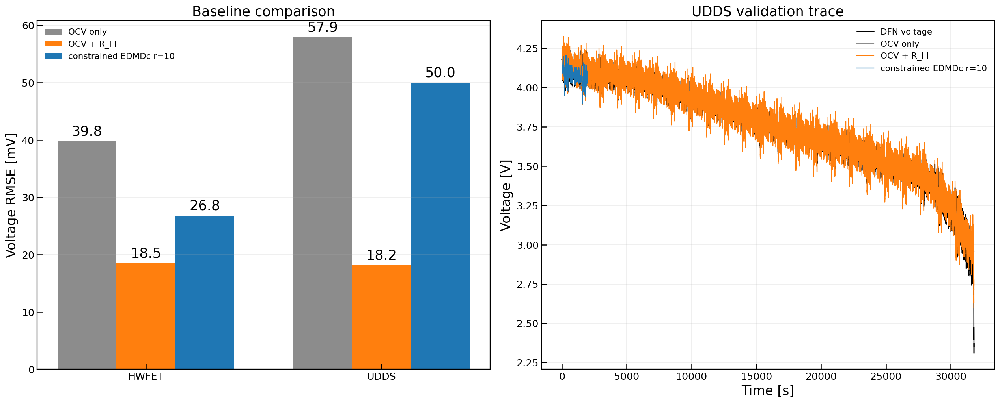

,cycle,model,voltage_rmse_V,voltage_rmse_mV
1,HWFET,OCV + R_I I,0.018510,18.509993
0,HWFET,OCV only,0.039794,39.794070
4,HWFET,constrained EDMDc r=10,0.026819,26.819243
3,UDDS,OCV + R_I I,0.018155,18.154833
2,UDDS,OCV only,0.057933,57.932518
5,UDDS,constrained EDMDc r=10,0.050040,50.039624


In [211]:
COMPARISON_RANK = BEST_CONSTRAINED_RANK_TO_PLOT
TRACE_CYCLE = "UDDS"

comparison_rows = baseline_metrics[["cycle", "model", "voltage_rmse_V"]].copy()

edmdc_rows = constrained_rollout_metrics.loc[
    (constrained_rollout_metrics["rank"] == COMPARISON_RANK)
    & (constrained_rollout_metrics["cycle"].isin(BASELINE_VALIDATION_CYCLES))
    & (constrained_rollout_metrics["status"].str.startswith("ok")),
    ["cycle", "voltage_rmse_V"],
].copy()
edmdc_rows["model"] = f"constrained EDMDc r={COMPARISON_RANK}"
comparison_rows = pd.concat([comparison_rows, edmdc_rows[["cycle", "model", "voltage_rmse_V"]]], ignore_index=True)
comparison_rows["voltage_rmse_mV"] = 1000.0 * comparison_rows["voltage_rmse_V"]

plot_order = ["OCV only", "OCV + R_I I", f"constrained EDMDc r={COMPARISON_RANK}"]
plot_colors = {
    "OCV only": "0.55",
    "OCV + R_I I": "tab:orange",
    f"constrained EDMDc r={COMPARISON_RANK}": "tab:blue",
}

fig, axes = plt.subplots(1, 2, figsize=(18, 7.2), constrained_layout=True)

x = np.arange(len(BASELINE_VALIDATION_CYCLES))
bar_width = 0.25

for j, model_name in enumerate(plot_order):
    values = []
    for cycle_name in BASELINE_VALIDATION_CYCLES:
        match = comparison_rows.loc[
            (comparison_rows["cycle"] == cycle_name) & (comparison_rows["model"] == model_name),
            "voltage_rmse_mV",
        ]
        values.append(float(match.iloc[0]) if len(match) else np.nan)

    offset = (j - (len(plot_order) - 1) / 2.0) * bar_width
    bars = axes[0].bar(
        x + offset,
        values,
        width=bar_width,
        label=model_name,
        color=plot_colors[model_name],
    )
    axes[0].bar_label(bars, fmt="%.1f", padding=4, fontsize=18)

axes[0].set_xticks(x)
axes[0].set_xticklabels(BASELINE_VALIDATION_CYCLES)
axes[0].set_ylabel("Voltage RMSE [mV]")
axes[0].set_title("Baseline comparison")
axes[0].grid(True, axis="y", alpha=0.25)
axes[0].legend(frameon=False, loc="best")

trace_time = baseline_predictions[TRACE_CYCLE]["time"]
trace_voltage = baseline_predictions[TRACE_CYCLE]["voltage_true"]
axes[1].plot(trace_time, trace_voltage, color="black", linewidth=1.3, label="DFN voltage")
axes[1].plot(trace_time, baseline_predictions[TRACE_CYCLE]["OCV only"], color="0.55", linewidth=1.1, label="OCV only")
axes[1].plot(trace_time, baseline_predictions[TRACE_CYCLE]["OCV + R_I I"], color="tab:orange", linewidth=1.1, label="OCV + R_I I")

edmdc_trace = constrained_rollout_results.get(COMPARISON_RANK, {}).get(TRACE_CYCLE)
if edmdc_trace is not None:
    axes[1].plot(
        edmdc_trace[TIME_COL],
        edmdc_trace["voltage_pred"],
        color="tab:blue",
        linewidth=1.2,
        label=f"constrained EDMDc r={COMPARISON_RANK}",
    )

axes[1].set_xlabel("Time [s]")
axes[1].set_ylabel("Voltage [V]")
axes[1].set_title(f"{TRACE_CYCLE} validation trace")
axes[1].grid(True, alpha=0.25)
axes[1].legend(frameon=False, loc="best")

for ax in axes:
    ax.tick_params(direction="in", length=7, width=1.3)

fig.savefig("interim_baseline_vs_constrained_edmdc.svg", bbox_inches="tight")
fig.savefig("interim_baseline_vs_constrained_edmdc.png", dpi=300, bbox_inches="tight")
plt.show()

display(comparison_rows.sort_values(["cycle", "model"]))


## Step 14a: Rollout initialized near 50 percent SOC

The constrained rollout from the beginning of each validation cycle shows a negative voltage bias. This diagnostic checks whether that bias is mainly associated with the high-SOC portion of the cycle.

For each validation cycle, the same rank-10 constrained EDMDc model is initialized at the first available point near:

$$SOC \approx 0.50$$

The delay history is still built from measured data over the local initialization window, and after that the rollout uses only the known current input and Coulomb-counted SOC.

In [212]:
SOC_START_TARGET = 0.50
SOC_START_RANK = BEST_CONSTRAINED_RANK_TO_PLOT
SOC_START_MIN_PREDICTED_STEPS = 2_000


def slice_cycle_near_soc(df, target_soc, n_delay=ETA_DELAY, min_predicted_steps=SOC_START_MIN_PREDICTED_STEPS):
    soc = df[SOC_COL].to_numpy(dtype=float)
    max_start_index = len(df) - (n_delay + min_predicted_steps + 1)

    if max_start_index < 0:
        raise ValueError("Cycle is too short for the requested delay window and minimum rollout length.")

    eligible_indices = np.arange(max_start_index + 1)
    below_target = eligible_indices[soc[eligible_indices] <= target_soc]

    if len(below_target) > 0:
        start_index = int(below_target[0])
    else:
        start_index = int(eligible_indices[np.argmin(np.abs(soc[eligible_indices] - target_soc))])

    sliced = df.iloc[start_index:].reset_index(drop=True).copy()
    metadata = {
        "start_index": start_index,
        "start_time_s": float(df[TIME_COL].iloc[start_index]),
        "start_soc": float(df[SOC_COL].iloc[start_index]),
        "remaining_samples": int(len(sliced)),
    }
    return sliced, metadata


soc_start_rows = []
soc_start_rollout_results = {}

A_soc_start = eta_ranked_models[SOC_START_RANK]["A"]
B_soc_start = eta_ranked_models[SOC_START_RANK]["B"]

for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
    df_start, start_meta = slice_cycle_near_soc(cycles_scaled[cycle_name], SOC_START_TARGET)
    rollout = rollout_eta_constrained_segment(df_start, A_soc_start, B_soc_start)

    if rollout["result"] is not None:
        result = rollout["result"]
        soc_start_rollout_results[cycle_name] = result
        voltage_metrics = compute_error_metrics(result[VOLTAGE_COL], result["voltage_pred"])
        eta_metrics = compute_error_metrics(result[ETA_COL], result["eta_pred"])
        soc_metrics = compute_error_metrics(result[SOC_COL], result["soc_coulomb"])
    else:
        voltage_metrics = {"rmse": np.nan, "mae": np.nan, "max_abs_error": np.nan, "bias": np.nan}
        eta_metrics = {"rmse": np.nan}
        soc_metrics = {"rmse": np.nan}

    soc_start_rows.append({
        "cycle": cycle_name,
        "rank": SOC_START_RANK,
        "target_start_soc": SOC_START_TARGET,
        "actual_start_soc": start_meta["start_soc"],
        "start_time_s": start_meta["start_time_s"],
        "start_index": start_meta["start_index"],
        "remaining_samples": start_meta["remaining_samples"],
        "status": rollout["status"],
        "failure_time_s": rollout["failure_time_s"],
        "n_predicted_samples": 0 if rollout["result"] is None else len(rollout["result"]),
        "voltage_rmse_V": voltage_metrics["rmse"],
        "voltage_mae_V": voltage_metrics["mae"],
        "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
        "voltage_bias_V": voltage_metrics["bias"],
        "eta_rmse_V": eta_metrics["rmse"],
        "soc_rmse": soc_metrics["rmse"],
    })

soc_start_rollout_metrics = pd.DataFrame(soc_start_rows)
soc_start_rollout_metrics["voltage_rmse_mV"] = 1000.0 * soc_start_rollout_metrics["voltage_rmse_V"]
soc_start_rollout_metrics["voltage_bias_mV"] = 1000.0 * soc_start_rollout_metrics["voltage_bias_V"]

display(soc_start_rollout_metrics)


,cycle,rank,target_start_soc,actual_start_soc,start_time_s,start_index,remaining_samples,status,failure_time_s,n_predicted_samples,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,voltage_bias_V,eta_rmse_V,soc_rmse,voltage_rmse_mV,voltage_bias_mV
0,HWFET,10,0.5,0.499999,17144.9,171449,150260,ok_short,None,20000,0.044364,0.041792,0.122060,-0.041637,0.044462,0.000136,44.363990,-41.636978
1,UDDS,10,0.5,0.499998,16782.5,167825,150162,ok_short,None,20000,0.058944,0.047204,0.206739,-0.041894,0.059014,0.000129,58.943916,-41.894193


## Step 14b: Compare cycle-start and 50 percent SOC initialization

This comparison separates a possible high-SOC initialization effect from the eta model's general open-loop behavior. If the 50 percent SOC rollout has much lower bias, the high-SOC region is a likely contributor. If the bias remains, the issue is probably in the eta dynamics or control feature dictionary.

,cycle,rank,status,n_predicted_samples,voltage_rmse_V,voltage_bias_V,initialization,actual_start_soc,start_time_s,voltage_rmse_mV,voltage_bias_mV
0,HWFET,10,ok_short,20000,0.026819,-0.020429,cycle start,NaN,NaN,26.819243,-20.428763
2,HWFET,10,ok_short,20000,0.044364,-0.041637,near 50% SOC,0.499999,17144.9,44.363990,-41.636978
1,UDDS,10,ok_short,20000,0.050040,-0.024072,cycle start,NaN,NaN,50.039624,-24.071649
3,UDDS,10,ok_short,20000,0.058944,-0.041894,near 50% SOC,0.499998,16782.5,58.943916,-41.894193


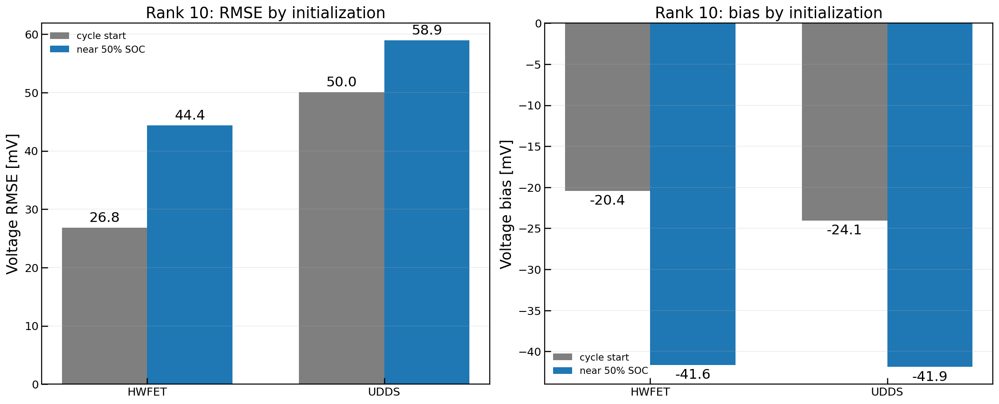

In [213]:
cycle_start_compare = constrained_rollout_metrics.loc[
    (constrained_rollout_metrics["rank"] == SOC_START_RANK)
    & (constrained_rollout_metrics["cycle"].isin(CONSTRAINED_VALIDATION_CYCLES))
    & (constrained_rollout_metrics["status"].str.startswith("ok")),
    ["cycle", "rank", "status", "n_predicted_samples", "voltage_rmse_V", "voltage_bias_V"],
].copy()
cycle_start_compare["initialization"] = "cycle start"
cycle_start_compare["actual_start_soc"] = np.nan
cycle_start_compare["start_time_s"] = np.nan

soc50_compare = soc_start_rollout_metrics[[
    "cycle", "rank", "status", "n_predicted_samples", "voltage_rmse_V", "voltage_bias_V", "actual_start_soc", "start_time_s"
]].copy()
soc50_compare["initialization"] = "near 50% SOC"

initialization_compare = pd.concat([cycle_start_compare, soc50_compare], ignore_index=True)
initialization_compare["voltage_rmse_mV"] = 1000.0 * initialization_compare["voltage_rmse_V"]
initialization_compare["voltage_bias_mV"] = 1000.0 * initialization_compare["voltage_bias_V"]

display(initialization_compare.sort_values(["cycle", "initialization"]))

fig, axes = plt.subplots(1, 2, figsize=(16, 6.4), constrained_layout=True)

init_order = ["cycle start", "near 50% SOC"]
colors = {"cycle start": "tab:gray", "near 50% SOC": "tab:blue"}
bar_width = 0.36
x = np.arange(len(CONSTRAINED_VALIDATION_CYCLES))

for j, init_name in enumerate(init_order):
    values_rmse = []
    values_bias = []
    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        row = initialization_compare.loc[
            (initialization_compare["cycle"] == cycle_name)
            & (initialization_compare["initialization"] == init_name)
        ]
        values_rmse.append(float(row["voltage_rmse_mV"].iloc[0]) if len(row) else np.nan)
        values_bias.append(float(row["voltage_bias_mV"].iloc[0]) if len(row) else np.nan)

    offset = (j - 0.5) * bar_width
    bars0 = axes[0].bar(x + offset, values_rmse, width=bar_width, color=colors[init_name], label=init_name)
    bars1 = axes[1].bar(x + offset, values_bias, width=bar_width, color=colors[init_name], label=init_name)
    axes[0].bar_label(bars0, fmt="%.1f", padding=4, fontsize=16)
    axes[1].bar_label(bars1, fmt="%.1f", padding=4, fontsize=16)

axes[0].set_ylabel("Voltage RMSE [mV]")
axes[1].set_ylabel("Voltage bias [mV]")

for ax in axes:
    ax.set_xticks(x)
    ax.set_xticklabels(CONSTRAINED_VALIDATION_CYCLES)
    ax.grid(True, axis="y", alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)
    ax.legend(frameon=False, loc="best")

axes[0].set_title(f"Rank {SOC_START_RANK}: RMSE by initialization")
axes[1].set_title(f"Rank {SOC_START_RANK}: bias by initialization")

fig.savefig("interim_soc50_initialization_diagnostic.svg", bbox_inches="tight")
fig.savefig("interim_soc50_initialization_diagnostic.png", dpi=300, bbox_inches="tight")
plt.show()


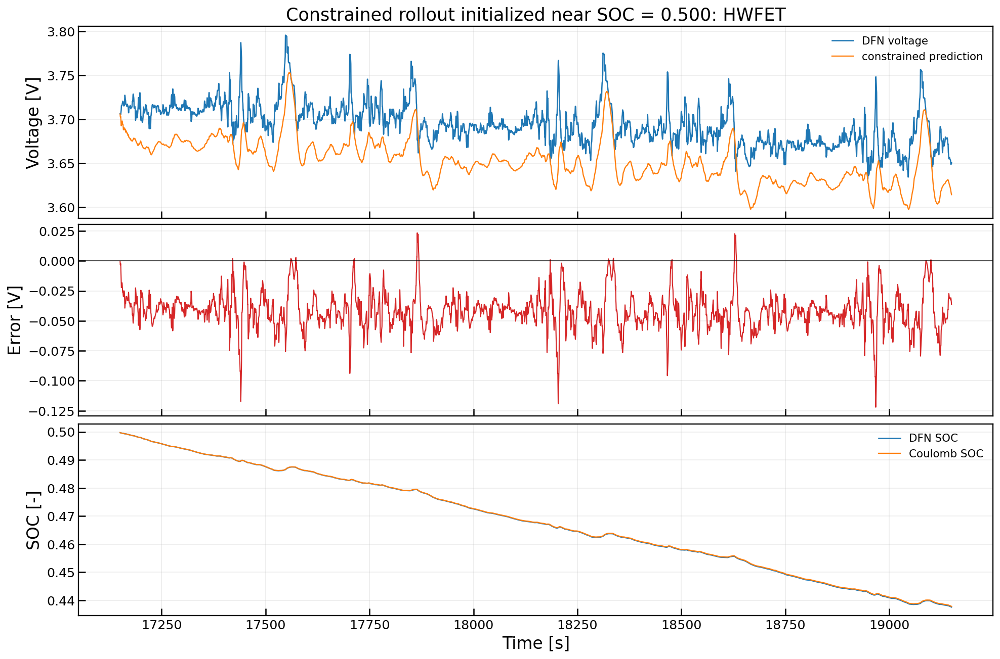

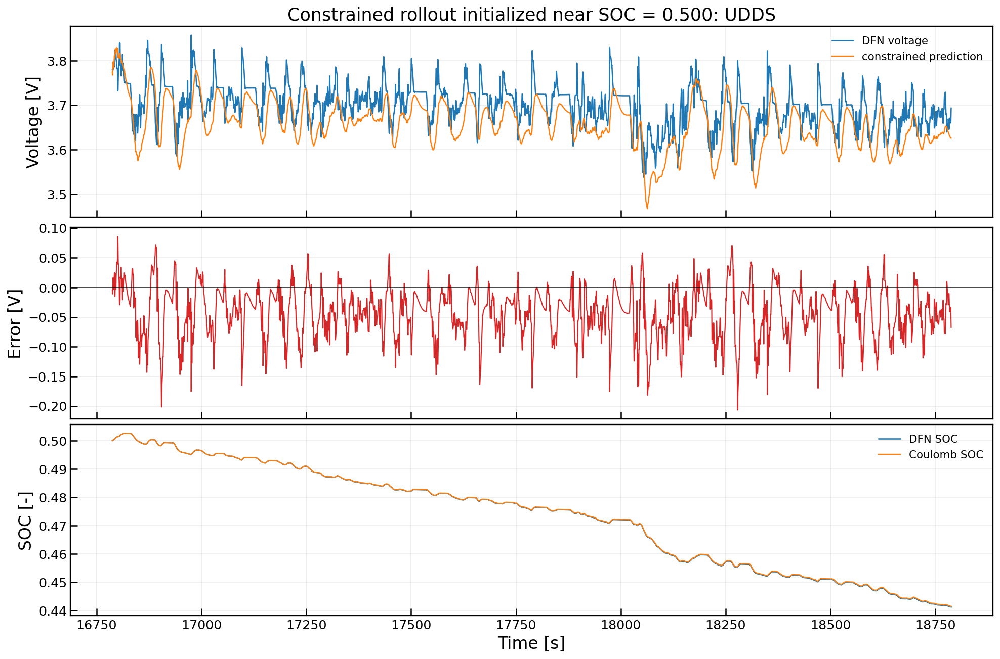

In [214]:
for cycle_name, result in soc_start_rollout_results.items():
    fig, axes = plt.subplots(3, 1, figsize=(14, 9.2), sharex=True, constrained_layout=True)

    axes[0].plot(result[TIME_COL], result[VOLTAGE_COL], label="DFN voltage", linewidth=1.3)
    axes[0].plot(result[TIME_COL], result["voltage_pred"], label="constrained prediction", linewidth=1.2)
    axes[1].plot(result[TIME_COL], result["voltage_pred"] - result[VOLTAGE_COL], color="tab:red", linewidth=1.1)
    axes[1].axhline(0.0, color="black", linewidth=1.0, alpha=0.7)
    axes[2].plot(result[TIME_COL], result[SOC_COL], label="DFN SOC", linewidth=1.3)
    axes[2].plot(result[TIME_COL], result["soc_coulomb"], label="Coulomb SOC", linewidth=1.2)

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Error [V]")
    axes[2].set_ylabel("SOC [-]")
    axes[2].set_xlabel("Time [s]")

    start_soc = soc_start_rollout_metrics.loc[soc_start_rollout_metrics["cycle"] == cycle_name, "actual_start_soc"].iloc[0]
    axes[0].set_title(f"Constrained rollout initialized near SOC = {start_soc:.3f}: {cycle_name}")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=7, width=1.3)

    axes[0].legend(frameon=False, loc="best")
    axes[2].legend(frameon=False, loc="best")
    plt.show()


## Step 15a: Affine and asymmetric control library

The previous diagnostics show that a one-parameter current correction is a strong baseline, while the constrained EDMDc rollout develops a negative eta bias. This model keeps the same eta-only delayed state and expands only the control library.

The current is split into discharge and charge-side components:

$$I^+_k = \max(I_k, 0), \qquad I^-_k = \min(I_k, 0)$$

The nonredundant control library is:

$$g_k = [1, I^+_k, I^-_k, SOC_k, I^+_kSOC_k, I^-_kSOC_k]^T$$

The constant feature allows an affine eta update. The positive and negative current features allow charge and discharge behavior to have different fitted gains. The raw current $I_k$ is not included separately because $I_k = I^+_k + I^-_k$, so including all three would introduce an exact linear dependence. All non-constant features are scaled using training data only.

In [215]:
ASYM_CONST_COL = "g_const"
ASYM_RAW_FEATURE_COLS = [
    "g_I_pos",
    "g_I_neg",
    "g_SOC",
    "g_I_pos_SOC",
    "g_I_neg_SOC",
]
ASYM_SCALED_FEATURE_COLS = [f"{col}_scaled" for col in ASYM_RAW_FEATURE_COLS]
ASYM_CONTROL_COLS = [ASYM_CONST_COL] + ASYM_SCALED_FEATURE_COLS


def asymmetric_feature_values(current, soc):
    current = np.asarray(current, dtype=float)
    soc = np.asarray(soc, dtype=float)
    current_pos = np.maximum(current, 0.0)
    current_neg = np.minimum(current, 0.0)
    return {
        "g_I_pos": current_pos,
        "g_I_neg": current_neg,
        "g_SOC": soc,
        "g_I_pos_SOC": current_pos * soc,
        "g_I_neg_SOC": current_neg * soc,
    }


cycles_asym = {}

for cycle_name, df in cycles_scaled.items():
    work = df.copy()
    work[ASYM_CONST_COL] = 1.0

    feature_dict = asymmetric_feature_values(
        work[CURRENT_COL].to_numpy(dtype=float),
        work[SOC_COL].to_numpy(dtype=float),
    )
    for col, values in feature_dict.items():
        work[col] = values

    cycles_asym[cycle_name] = work

asym_feature_scale_params = {}
asym_scale_rows = []

for raw_col, scaled_col in zip(ASYM_RAW_FEATURE_COLS, ASYM_SCALED_FEATURE_COLS):
    train_values = np.concatenate([
        cycles_asym[name][raw_col].to_numpy(dtype=float)
        for name in TRAIN_CYCLES
    ])
    q_min = float(np.min(train_values))
    q_max = float(np.max(train_values))
    q_range = q_max - q_min

    if q_range == 0.0:
        raise ValueError(f"Cannot scale {raw_col}: training range is zero.")

    asym_feature_scale_params[raw_col] = {"min": q_min, "max": q_max, "range": q_range, "scaled_col": scaled_col}
    asym_scale_rows.append({"feature": raw_col, "scaled_feature": scaled_col, "train_min": q_min, "train_max": q_max})

    for cycle_name in cycles_asym:
        values = cycles_asym[cycle_name][raw_col].to_numpy(dtype=float)
        cycles_asym[cycle_name][scaled_col] = 2.0 * (values - q_min) / q_range - 1.0

asym_feature_scale_table = pd.DataFrame(asym_scale_rows)
display(asym_feature_scale_table)

asym_range_rows = []
for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
    df = cycles_asym[cycle_name]
    for scaled_col in ASYM_SCALED_FEATURE_COLS:
        values = df[scaled_col].to_numpy(dtype=float)
        asym_range_rows.append({
            "cycle": cycle_name,
            "feature": scaled_col,
            "scaled_min": float(np.min(values)),
            "scaled_max": float(np.max(values)),
            "n_below_minus_1": int(np.sum(values < -1.0)),
            "n_above_plus_1": int(np.sum(values > 1.0)),
        })

asym_validation_range_check = pd.DataFrame(asym_range_rows)
display(asym_validation_range_check)


,feature,scaled_feature,train_min,train_max
0,g_I_pos,g_I_pos_scaled,0.000000,9.066848
1,g_I_neg,g_I_neg_scaled,-5.746429,0.000000
2,g_SOC,g_SOC_scaled,0.000006,1.005770
3,g_I_pos_SOC,g_I_pos_SOC_scaled,0.000000,6.172405
4,g_I_neg_SOC,g_I_neg_SOC_scaled,-4.508295,0.000000


,cycle,feature,scaled_min,scaled_max,n_below_minus_1,n_above_plus_1
0,HWFET,g_I_pos_scaled,-1.000000,-0.367246,0,0
1,HWFET,g_I_neg_scaled,0.000725,1.000000,0,0
2,HWFET,g_SOC_scaled,-1.000005,0.988527,1,0
3,HWFET,g_I_pos_SOC_scaled,-1.000000,-0.335955,0,0
4,HWFET,g_I_neg_SOC_scaled,0.108794,1.000000,0,0
5,UDDS,g_I_pos_scaled,-1.000000,1.501319,0,54
6,UDDS,g_I_neg_scaled,-1.399687,1.000000,35,0
7,UDDS,g_SOC_scaled,-1.000007,0.988527,1,0
8,UDDS,g_I_pos_SOC_scaled,-1.000000,1.211995,0,46
9,UDDS,g_I_neg_SOC_scaled,-1.309983,1.000000,11,0


## Step 15b: SVD check for the expanded control library

The eta delay state is unchanged. Only the control block in Omega is expanded:

$$\Omega = \begin{bmatrix} Z \\ G \end{bmatrix}$$

A new SVD check is needed because the feature library changes the conditioning and the effective rank of the least-squares fit.

Z_asym_eta_train shape: (51, 879809)
G_asym_eta_train shape: (6, 879809)
Omega_asym_eta_train shape: (57, 879809)
asymmetric eta numerical rank: 57 / 57
asymmetric ranks to compare: [5, 10, 15, 20, 30]


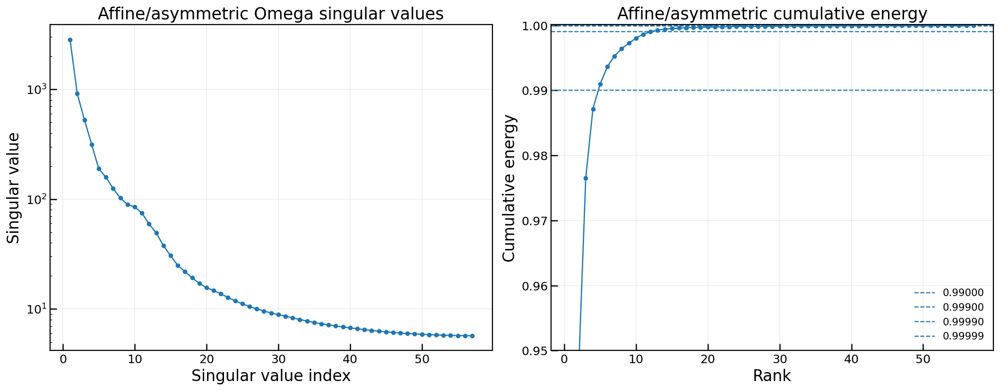

In [216]:
asym_eta_snapshots_by_cycle = {}
for cycle_name, df in cycles_asym.items():
    asym_eta_snapshots_by_cycle[cycle_name] = make_eta_delay_snapshots_for_cycle(
        df,
        ETA_DELAY,
        state_cols=ETA_STATE_COLS,
        control_cols=ASYM_CONTROL_COLS,
    )

Z_asym_eta_train = np.hstack([asym_eta_snapshots_by_cycle[name]["Z_curr"] for name in TRAIN_CYCLES])
G_asym_eta_train = np.hstack([asym_eta_snapshots_by_cycle[name]["G_curr"] for name in TRAIN_CYCLES])
Y_asym_eta_train = np.hstack([asym_eta_snapshots_by_cycle[name]["Z_next"] for name in TRAIN_CYCLES])
Omega_asym_eta_train = np.vstack([Z_asym_eta_train, G_asym_eta_train])

n_asym_z = Z_asym_eta_train.shape[0]
n_asym_g = G_asym_eta_train.shape[0]

gram_asym_eta = Omega_asym_eta_train @ Omega_asym_eta_train.T
eigvals_asym_eta, U_asym_eta = linalg.eigh(gram_asym_eta)
order = np.argsort(eigvals_asym_eta)[::-1]
eigvals_asym_eta = np.maximum(eigvals_asym_eta[order], 0.0)
U_asym_eta = U_asym_eta[:, order]
s_asym_eta = np.sqrt(eigvals_asym_eta)

positive_asym_eta = s_asym_eta > 1e-12 * s_asym_eta[0]
asym_eta_numerical_rank = int(np.sum(positive_asym_eta))
asym_eta_cumulative_energy = np.cumsum(s_asym_eta**2) / np.sum(s_asym_eta**2)

ASYM_RANKS_TO_COMPARE = [r for r in [5, 10, 15, 20, 30] if r <= asym_eta_numerical_rank]

print(f"Z_asym_eta_train shape: {Z_asym_eta_train.shape}")
print(f"G_asym_eta_train shape: {G_asym_eta_train.shape}")
print(f"Omega_asym_eta_train shape: {Omega_asym_eta_train.shape}")
print(f"asymmetric eta numerical rank: {asym_eta_numerical_rank} / {len(s_asym_eta)}")
print(f"asymmetric ranks to compare: {ASYM_RANKS_TO_COMPARE}")

rank_axis = np.arange(1, len(s_asym_eta) + 1)

fig, axes = plt.subplots(1, 2, figsize=(15, 5.8), constrained_layout=True)
axes[0].semilogy(rank_axis, s_asym_eta, marker="o", markersize=4)
axes[0].set_xlabel("Singular value index")
axes[0].set_ylabel("Singular value")
axes[0].set_title("Affine/asymmetric Omega singular values")

axes[1].plot(rank_axis, asym_eta_cumulative_energy, marker="o", markersize=4)
for threshold in [0.99, 0.999, 0.9999, 0.99999]:
    axes[1].axhline(threshold, linestyle="--", linewidth=1.2, label=f"{threshold:.5f}")
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Cumulative energy")
axes[1].set_ylim(0.95, 1.0001)
axes[1].set_title("Affine/asymmetric cumulative energy")
axes[1].legend(frameon=False, loc="best")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)

plt.show()


## Step 15c: Fit candidate ranks and inspect eigenvalues

The candidate ranks are intentionally conservative. The earlier eta-only model showed that higher rank can improve one-step fit while making open-loop rollout unstable. For each candidate rank, the one-step eta fit and eigenvalues of the delayed-state matrix are inspected before rollout.

,rank,energy_at_rank,eta_train_one_step_rmse_scaled,max_abs_eig_A,n_eigs_outside_unit_circle
0,5,0.990961,0.037207,0.981592,0
1,10,0.998033,0.027847,0.987147,0
2,15,0.999520,0.020328,0.992544,0
3,20,0.999734,0.016138,0.982427,0
4,30,0.999873,0.013999,0.983844,0


,rank,cycle,voltage_rmse_V,voltage_mae_V,voltage_bias_V,eta_rmse_V
0,5,HWFET,0.006830,0.004427,0.001844,0.006830
1,5,UDDS,0.013292,0.009103,0.001139,0.013292
2,10,HWFET,0.005723,0.003348,0.002062,0.005723
3,10,UDDS,0.009095,0.005994,0.001450,0.009095
4,15,HWFET,0.002545,0.001565,0.000647,0.002545
5,15,UDDS,0.005992,0.003622,0.000466,0.005992
6,20,HWFET,0.001365,0.000823,0.000222,0.001365
7,20,UDDS,0.003597,0.001988,0.000169,0.003597
8,30,HWFET,0.000916,0.000536,0.000062,0.000916
9,30,UDDS,0.002567,0.001383,0.000056,0.002567


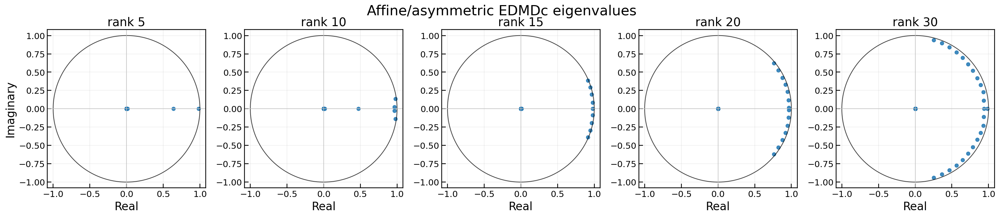

In [217]:
Y_asym_eta_Omega_T = Y_asym_eta_train @ Omega_asym_eta_train.T


def fit_asym_eta_ranked_operator(rank):
    U_r = U_asym_eta[:, :rank]
    s_r = s_asym_eta[:rank]
    K = (Y_asym_eta_Omega_T @ U_r) @ np.diag(1.0 / (s_r**2)) @ U_r.T
    A = K[:, :n_asym_z]
    B = K[:, n_asym_z:]
    return K, A, B


asym_eta_ranked_models = {}
asym_eta_rank_rows = []
asym_one_step_rows = []

for rank in ASYM_RANKS_TO_COMPARE:
    K_tmp, A_tmp, B_tmp = fit_asym_eta_ranked_operator(rank)
    asym_eta_ranked_models[rank] = {"K": K_tmp, "A": A_tmp, "B": B_tmp}

    eta_pred_scaled = K_tmp[0:1, :] @ Omega_asym_eta_train
    eta_true_scaled = Y_asym_eta_train[0:1, :]
    eta_rmse_scaled = float(np.sqrt(np.mean((eta_pred_scaled - eta_true_scaled) ** 2)))
    eigvals_tmp = linalg.eigvals(A_tmp)
    eig_abs_tmp = np.abs(eigvals_tmp)

    asym_eta_rank_rows.append({
        "rank": rank,
        "energy_at_rank": asym_eta_cumulative_energy[rank - 1],
        "eta_train_one_step_rmse_scaled": eta_rmse_scaled,
        "max_abs_eig_A": float(np.max(eig_abs_tmp)),
        "n_eigs_outside_unit_circle": int(np.sum(eig_abs_tmp > 1.0 + 1e-10)),
    })

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        snapshots = asym_eta_snapshots_by_cycle[cycle_name]
        omega_val = np.vstack([snapshots["Z_curr"], snapshots["G_curr"]])
        eta_pred_scaled_val = (K_tmp[0:1, :] @ omega_val).reshape(-1)
        eta_true_scaled_val = snapshots["Z_next"][0, :]

        df = cycles_asym[cycle_name]
        next_index = np.arange(ETA_DELAY + 1, len(df))
        eta_pred = inverse_minmax_scaled(eta_pred_scaled_val, ETA_COL)
        eta_true = inverse_minmax_scaled(eta_true_scaled_val, ETA_COL)
        soc_true_next = df[SOC_COL].to_numpy(dtype=float)[next_index]
        voltage_true = df[VOLTAGE_COL].to_numpy(dtype=float)[next_index]
        voltage_pred = eta_pred + OCV_func(soc_true_next)

        voltage_metrics = compute_error_metrics(voltage_true, voltage_pred)
        eta_metrics = compute_error_metrics(eta_true, eta_pred)

        asym_one_step_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_bias_V": voltage_metrics["bias"],
            "eta_rmse_V": eta_metrics["rmse"],
        })

asym_eta_rank_diagnostics = pd.DataFrame(asym_eta_rank_rows)
asym_one_step_validation = pd.DataFrame(asym_one_step_rows)

display(asym_eta_rank_diagnostics)
display(asym_one_step_validation)

n_rank_plots = len(ASYM_RANKS_TO_COMPARE)
fig, axes = plt.subplots(1, n_rank_plots, figsize=(4.2 * n_rank_plots, 4.2), constrained_layout=True)
axes = np.atleast_1d(axes)
theta = np.linspace(0.0, 2.0 * np.pi, 400)
unit_x = np.cos(theta)
unit_y = np.sin(theta)

for ax, rank in zip(axes, ASYM_RANKS_TO_COMPARE):
    eigvals_rank = linalg.eigvals(asym_eta_ranked_models[rank]["A"])
    ax.plot(unit_x, unit_y, color="black", linewidth=1.1, alpha=0.75)
    ax.scatter(eigvals_rank.real, eigvals_rank.imag, s=28, color="tab:blue", alpha=0.85)
    ax.axhline(0.0, color="0.75", linewidth=0.8)
    ax.axvline(0.0, color="0.75", linewidth=0.8)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlim(-1.08, 1.08)
    ax.set_ylim(-1.08, 1.08)
    ax.set_title(f"rank {rank}")
    ax.set_xlabel("Real")
    ax.grid(True, alpha=0.22)

axes[0].set_ylabel("Imaginary")
fig.suptitle("Affine/asymmetric EDMDc eigenvalues", y=1.05)
fig.savefig("interim_asymmetric_library_eigenvalues.svg", bbox_inches="tight")
fig.savefig("interim_asymmetric_library_eigenvalues.png", dpi=300, bbox_inches="tight")
plt.show()


## Step 15d: Open-loop rollout with the affine/asymmetric library

The rollout still uses Coulomb-counted SOC. The expanded library changes only the input vector used by EDMDc during eta prediction. This keeps the comparison focused on whether the additional current features reduce bias and improve open-loop voltage prediction.

In [218]:
def asymmetric_control_vector(current_value, soc_value):
    raw_values = asymmetric_feature_values(np.array([current_value]), np.array([soc_value]))
    g_values = [1.0]

    for raw_col in ASYM_RAW_FEATURE_COLS:
        params = asym_feature_scale_params[raw_col]
        raw_value = float(raw_values[raw_col][0])
        scaled_value = 2.0 * (raw_value - params["min"]) / params["range"] - 1.0
        g_values.append(scaled_value)

    return np.asarray(g_values, dtype=float)


def rollout_eta_constrained_asym_segment(
    df,
    A,
    B,
    n_delay=ETA_DELAY,
    max_rollout_steps=CONSTRAINED_MAX_ROLLOUT_STEPS,
    state_abs_limit=CONSTRAINED_STATE_ABS_LIMIT,
):
    eta_scaled = df[SCALED_ETA_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    time = df[TIME_COL].to_numpy(dtype=float)

    z = eta_scaled[0 : n_delay + 1][::-1].copy()
    soc_cc = np.empty(len(df), dtype=float)
    soc_cc[: n_delay + 1] = df[SOC_COL].to_numpy(dtype=float)[: n_delay + 1]

    pred_indices = []
    eta_pred_scaled_rows = []
    soc_pred_rows = []

    stop_k = min(len(df) - 1, n_delay + max_rollout_steps)

    for k in range(n_delay, stop_k):
        dt = time[k + 1] - time[k]
        soc_next = soc_cc[k] + SOC_CURRENT_GAIN * dt * current[k]
        g_k = asymmetric_control_vector(current[k], soc_cc[k])

        z_next = A @ z + B @ g_k

        if (not np.all(np.isfinite(z_next))) or (np.max(np.abs(z_next)) > state_abs_limit):
            return {
                "result": None,
                "status": "diverged",
                "failure_k": int(k + 1),
                "failure_time_s": float(time[k + 1]),
                "max_abs_state": float(np.nanmax(np.abs(z_next))),
            }

        soc_cc[k + 1] = soc_next
        pred_indices.append(k + 1)
        eta_pred_scaled_rows.append(z_next[0])
        soc_pred_rows.append(soc_next)
        z = z_next

    pred_indices = np.asarray(pred_indices, dtype=int)
    result = df.iloc[pred_indices].copy()
    result["eta_pred_scaled"] = np.asarray(eta_pred_scaled_rows, dtype=float)
    result["eta_pred"] = inverse_minmax_scaled(result["eta_pred_scaled"], ETA_COL)
    result["soc_coulomb"] = np.asarray(soc_pred_rows, dtype=float)
    result["voltage_pred"] = result["eta_pred"] + OCV_func(result["soc_coulomb"].to_numpy(dtype=float))

    return {
        "result": result.reset_index(drop=True),
        "status": "ok_short" if stop_k < len(df) - 1 else "ok_full",
        "failure_k": None,
        "failure_time_s": None,
        "max_abs_state": float(np.max(np.abs(z))),
    }


asym_rollout_rows = []
asym_rollout_results = {}

for rank in ASYM_RANKS_TO_COMPARE:
    A_tmp = asym_eta_ranked_models[rank]["A"]
    B_tmp = asym_eta_ranked_models[rank]["B"]
    asym_rollout_results[rank] = {}

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        df = cycles_asym[cycle_name]
        rollout = rollout_eta_constrained_asym_segment(df, A_tmp, B_tmp)

        if rollout["result"] is not None:
            result = rollout["result"]
            asym_rollout_results[rank][cycle_name] = result
            voltage_metrics = compute_error_metrics(result[VOLTAGE_COL], result["voltage_pred"])
            eta_metrics = compute_error_metrics(result[ETA_COL], result["eta_pred"])
            soc_metrics = compute_error_metrics(result[SOC_COL], result["soc_coulomb"])
        else:
            voltage_metrics = {"rmse": np.nan, "mae": np.nan, "max_abs_error": np.nan, "bias": np.nan}
            eta_metrics = {"rmse": np.nan}
            soc_metrics = {"rmse": np.nan}

        asym_rollout_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "status": rollout["status"],
            "failure_time_s": rollout["failure_time_s"],
            "n_predicted_samples": 0 if rollout["result"] is None else len(rollout["result"]),
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
            "voltage_bias_V": voltage_metrics["bias"],
            "eta_rmse_V": eta_metrics["rmse"],
            "soc_rmse": soc_metrics["rmse"],
        })

asym_rollout_metrics = pd.DataFrame(asym_rollout_rows)
asym_rollout_metrics["voltage_rmse_mV"] = 1000.0 * asym_rollout_metrics["voltage_rmse_V"]
asym_rollout_metrics["voltage_bias_mV"] = 1000.0 * asym_rollout_metrics["voltage_bias_V"]

display(asym_rollout_metrics)


,rank,cycle,status,failure_time_s,n_predicted_samples,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,voltage_bias_V,eta_rmse_V,soc_rmse,voltage_rmse_mV,voltage_bias_mV
0,5,HWFET,ok_short,None,20000,0.015685,0.014185,0.039277,0.014097,0.015592,0.000121,15.684715,14.096627
1,5,UDDS,ok_short,None,20000,0.018792,0.015272,0.091092,0.012440,0.018714,0.000139,18.792296,12.439909
2,10,HWFET,ok_short,None,20000,0.015821,0.013562,0.043071,0.012173,0.015742,0.000121,15.821142,12.173075
3,10,UDDS,ok_short,None,20000,0.022611,0.016876,0.090590,0.012208,0.022547,0.000139,22.611063,12.207899
4,15,HWFET,ok_short,None,20000,0.017722,0.015434,0.050096,0.014273,0.017638,0.000121,17.721569,14.272675
5,15,UDDS,ok_short,None,20000,0.024397,0.018556,0.124156,0.012188,0.024336,0.000139,24.396969,12.188145
6,20,HWFET,ok_short,None,20000,0.019371,0.016694,0.060016,0.014768,0.019291,0.000121,19.370947,14.767763
7,20,UDDS,ok_short,None,20000,0.029716,0.022291,0.138036,0.012920,0.029662,0.000139,29.715656,12.919534
8,30,HWFET,ok_short,None,20000,0.022057,0.018688,0.072730,0.015123,0.021985,0.000121,22.057407,15.123028
9,30,UDDS,ok_short,None,20000,0.039183,0.029264,0.146510,0.014008,0.039138,0.000139,39.183042,14.007816


## Step 15e: Compare affine/asymmetric rollout with previous results

The comparison uses the previous constrained rank-10 model and the OCV-plus-current-gain baseline as references. The expanded library is useful only if it reduces open-loop RMSE and bias without introducing instability.

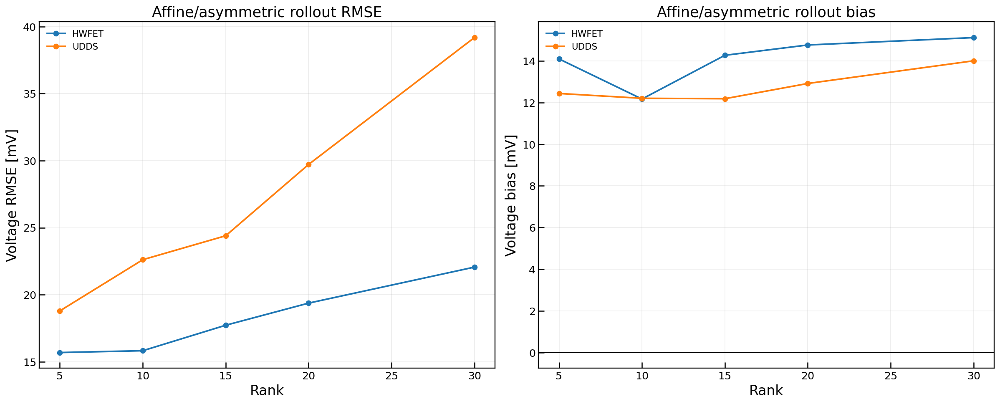

,cycle,voltage_rmse_V,voltage_bias_V,model,voltage_rmse_mV,voltage_bias_mV
4,HWFET,0.015685,0.014097,affine/asym r=5,15.684715,14.096627
6,HWFET,0.015821,0.012173,affine/asym r=10,15.821142,12.173075
8,HWFET,0.017722,0.014273,affine/asym r=15,17.721569,14.272675
0,HWFET,0.018510,0.012737,OCV + R_I I,18.509993,12.736699
10,HWFET,0.019371,0.014768,affine/asym r=20,19.370947,14.767763
12,HWFET,0.022057,0.015123,affine/asym r=30,22.057407,15.123028
2,HWFET,0.026819,-0.020429,eta-only r=10,26.819243,-20.428763
1,UDDS,0.018155,0.010365,OCV + R_I I,18.154833,10.365134
5,UDDS,0.018792,0.012440,affine/asym r=5,18.792296,12.439909
7,UDDS,0.022611,0.012208,affine/asym r=10,22.611063,12.207899


Best affine/asymmetric rank by mean validation rollout RMSE: 5


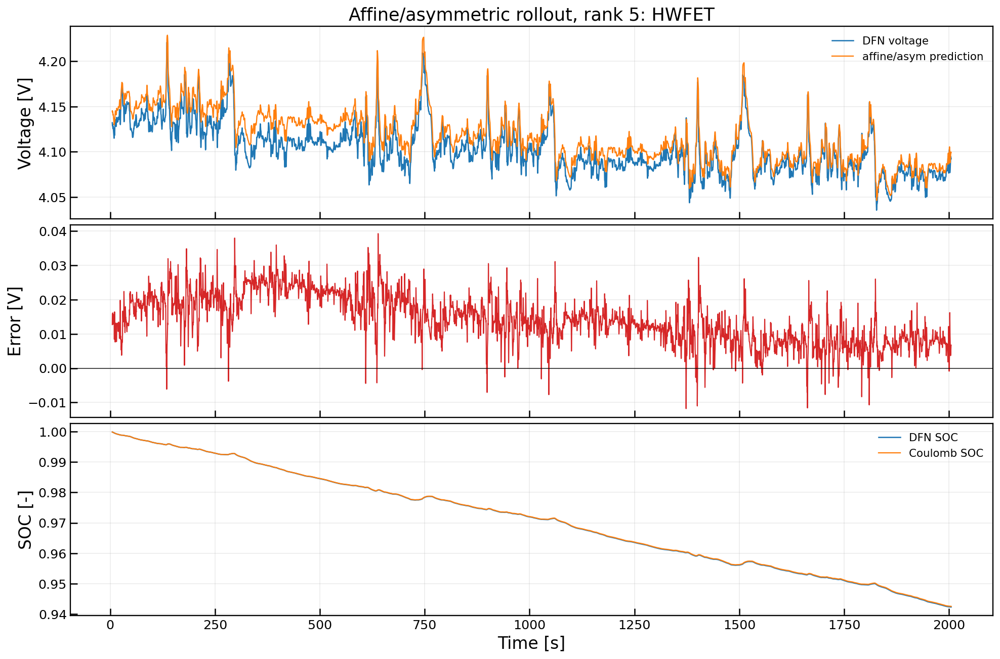

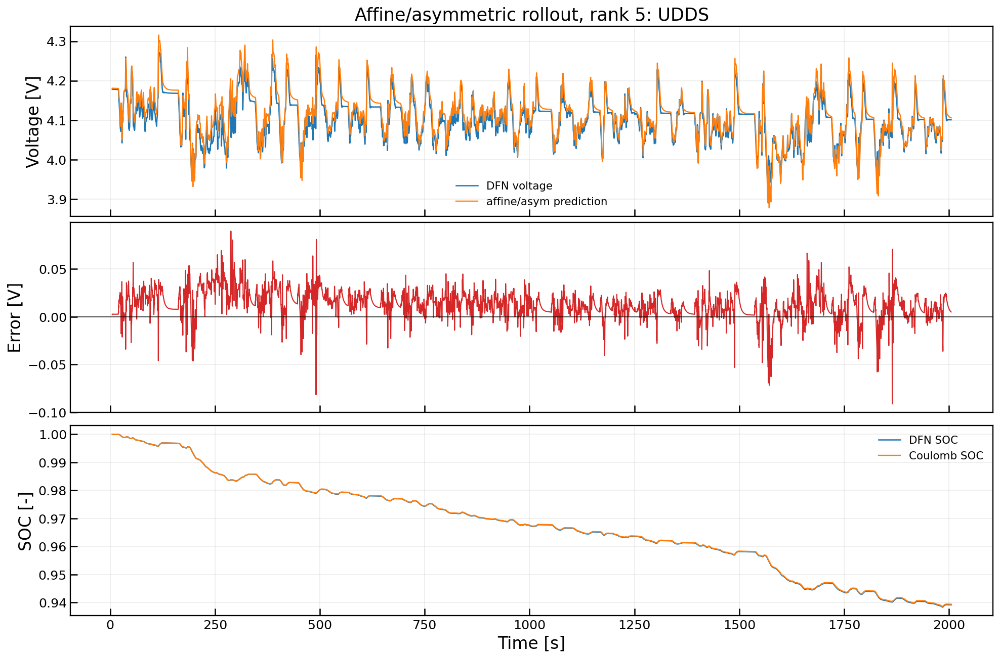

In [219]:
asym_stable = asym_rollout_metrics.loc[asym_rollout_metrics["status"].str.startswith("ok")].copy()

fig, axes = plt.subplots(1, 2, figsize=(17, 6.8), constrained_layout=True)

for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
    group = asym_stable.loc[asym_stable["cycle"] == cycle_name].sort_values("rank")
    axes[0].plot(group["rank"], group["voltage_rmse_mV"], marker="o", linewidth=2.0, label=cycle_name)
    axes[1].plot(group["rank"], group["voltage_bias_mV"], marker="o", linewidth=2.0, label=cycle_name)

axes[0].set_xlabel("Rank")
axes[0].set_ylabel("Voltage RMSE [mV]")
axes[0].set_title("Affine/asymmetric rollout RMSE")

axes[1].axhline(0.0, color="black", linewidth=1.1)
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Voltage bias [mV]")
axes[1].set_title("Affine/asymmetric rollout bias")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)
    ax.legend(frameon=False, loc="best")

fig.savefig("interim_asymmetric_library_rollout_diagnostics.svg", bbox_inches="tight")
fig.savefig("interim_asymmetric_library_rollout_diagnostics.png", dpi=300, bbox_inches="tight")
plt.show()

reference_rows = []

if "baseline_metrics" in globals():
    ohmic_rows = baseline_metrics.loc[baseline_metrics["model"] == "OCV + R_I I", ["cycle", "voltage_rmse_V", "voltage_bias_V"]].copy()
    ohmic_rows["model"] = "OCV + R_I I"
    reference_rows.append(ohmic_rows)

previous_rows = constrained_rollout_metrics.loc[
    (constrained_rollout_metrics["rank"] == BEST_CONSTRAINED_RANK_TO_PLOT)
    & (constrained_rollout_metrics["cycle"].isin(CONSTRAINED_VALIDATION_CYCLES))
    & (constrained_rollout_metrics["status"].str.startswith("ok")),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
previous_rows["model"] = f"eta-only r={BEST_CONSTRAINED_RANK_TO_PLOT}"
reference_rows.append(previous_rows)

for rank in ASYM_RANKS_TO_COMPARE:
    rank_rows = asym_rollout_metrics.loc[
        (asym_rollout_metrics["rank"] == rank)
        & (asym_rollout_metrics["status"].str.startswith("ok")),
        ["cycle", "voltage_rmse_V", "voltage_bias_V"],
    ].copy()
    rank_rows["model"] = f"affine/asym r={rank}"
    reference_rows.append(rank_rows)

rollout_model_comparison = pd.concat(reference_rows, ignore_index=True)
rollout_model_comparison["voltage_rmse_mV"] = 1000.0 * rollout_model_comparison["voltage_rmse_V"]
rollout_model_comparison["voltage_bias_mV"] = 1000.0 * rollout_model_comparison["voltage_bias_V"]

display(rollout_model_comparison.sort_values(["cycle", "voltage_rmse_mV"]))

best_asym_rank_by_mean_rmse = int(
    asym_stable.groupby("rank")["voltage_rmse_V"].mean().sort_values().index[0]
)
print(f"Best affine/asymmetric rank by mean validation rollout RMSE: {best_asym_rank_by_mean_rmse}")

for cycle_name, result in asym_rollout_results.get(best_asym_rank_by_mean_rmse, {}).items():
    fig, axes = plt.subplots(3, 1, figsize=(14, 9.2), sharex=True, constrained_layout=True)

    axes[0].plot(result[TIME_COL], result[VOLTAGE_COL], label="DFN voltage", linewidth=1.3)
    axes[0].plot(result[TIME_COL], result["voltage_pred"], label="affine/asym prediction", linewidth=1.2)
    axes[1].plot(result[TIME_COL], result["voltage_pred"] - result[VOLTAGE_COL], color="tab:red", linewidth=1.1)
    axes[1].axhline(0.0, color="black", linewidth=1.0, alpha=0.7)
    axes[2].plot(result[TIME_COL], result[SOC_COL], label="DFN SOC", linewidth=1.3)
    axes[2].plot(result[TIME_COL], result["soc_coulomb"], label="Coulomb SOC", linewidth=1.2)

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Error [V]")
    axes[2].set_ylabel("SOC [-]")
    axes[2].set_xlabel("Time [s]")
    axes[0].set_title(f"Affine/asymmetric rollout, rank {best_asym_rank_by_mean_rmse}: {cycle_name}")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=7, width=1.3)

    axes[0].legend(frameon=False, loc="best")
    axes[2].legend(frameon=False, loc="best")

    safe_cycle_name = cycle_name.lower().replace(" ", "_")
    fig.savefig(f"interim_asymmetric_library_timeseries_{safe_cycle_name}.svg", bbox_inches="tight")
    fig.savefig(f"interim_asymmetric_library_timeseries_{safe_cycle_name}.png", dpi=300, bbox_inches="tight")
    plt.show()


## Step 16a: Explicit feedthrough model for instantaneous voltage drop

The asymmetric EDMDc model improved the old eta-only rollout, but the simple current-gain baseline remained very competitive. This suggests that part of the voltage residual is an instantaneous current-dependent drop, not only a delayed dynamic state.

A standard controlled state-space model separates these two effects:

$$x_{k+1} = A x_k + B u_k$$

$$y_k = Cx_k + D u_k$$

For the battery voltage model, the feedthrough term is interpreted as the ohmic/current-dependent part of the residual voltage. The dynamic EDMDc state is then used for the remaining polarization memory.

The static feedthrough terms are constrained to vanish when current is zero. This avoids quietly refitting the OCV curve. The basic physical form is:

$$\eta_{static,k} \approx I^+_k R^+(SOC_k) + I^-_k R^-(SOC_k)$$

where the charge and discharge resistance functions are allowed to differ. A low-order SOC basis is used for each direction:

$$R^\pm(SOC) \approx a^\pm_0 + a^\pm_1 SOC + a^\pm_2(SOC - 0.5)^2$$

This gives terms such as $I^+SOC$, $I^-SOC$, $I^+(SOC-0.5)^2$, and $I^-(SOC-0.5)^2$. The squared SOC term is a simple bathtub-shaped basis: it can represent higher resistance near low/high SOC and lower resistance near mid SOC.

The quadratic-current library is also tested as an exploratory extension. It improves the current results, but it has a larger condition number, so the pruned SOC-bathtub library is the cleaner robustness check if time allows.

In [220]:
def signed_current_parts(current):
    current = np.asarray(current, dtype=float)
    current_pos = np.maximum(current, 0.0)
    current_neg = np.minimum(current, 0.0)
    current_neg_abs = -current_neg
    current_pos2 = current_pos**2
    current_neg2_signed = current_neg * current_neg_abs
    return current_pos, current_neg, current_pos2, current_neg2_signed


def feedthrough_design_matrix(current, soc, library_name):
    current = np.asarray(current, dtype=float)
    soc = np.asarray(soc, dtype=float)
    current_pos, current_neg, current_pos2, current_neg2_signed = signed_current_parts(current)
    soc_bathtub = (soc - 0.5) ** 2

    feature_map = {
        "linear_asym": [
            ("I_pos", current_pos),
            ("I_neg", current_neg),
        ],
        "soc_bathtub_asym": [
            ("I_pos", current_pos),
            ("I_neg", current_neg),
            ("I_pos_SOC", current_pos * soc),
            ("I_neg_SOC", current_neg * soc),
            ("I_pos_SOC_bathtub", current_pos * soc_bathtub),
            ("I_neg_SOC_bathtub", current_neg * soc_bathtub),
        ],
        "quadratic_soc_bathtub_asym": [
            ("I_pos", current_pos),
            ("I_neg", current_neg),
            ("I_pos_SOC", current_pos * soc),
            ("I_neg_SOC", current_neg * soc),
            ("I_pos_SOC_bathtub", current_pos * soc_bathtub),
            ("I_neg_SOC_bathtub", current_neg * soc_bathtub),
            ("I_pos2", current_pos2),
            ("I_neg2_signed", current_neg2_signed),
            ("I_pos2_SOC", current_pos2 * soc),
            ("I_neg2_SOC_signed", current_neg2_signed * soc),
            ("I_pos2_SOC_bathtub", current_pos2 * soc_bathtub),
            ("I_neg2_SOC_bathtub_signed", current_neg2_signed * soc_bathtub),
        ],
    }

    if library_name not in feature_map:
        raise ValueError(f"Unknown feedthrough library: {library_name}")

    names = [name for name, _ in feature_map[library_name]]
    Phi = np.column_stack([values for _, values in feature_map[library_name]])
    return Phi, names


feedthrough_library_names = [
    "linear_asym",
    "soc_bathtub_asym",
    "quadratic_soc_bathtub_asym",
]

I_train = train_data_with_eta[CURRENT_COL].to_numpy(dtype=float)
soc_train = train_data_with_eta[SOC_COL].to_numpy(dtype=float)
eta_train = train_data_with_eta[ETA_COL].to_numpy(dtype=float)
finite_train = np.isfinite(I_train) & np.isfinite(soc_train) & np.isfinite(eta_train)
I_train = I_train[finite_train]
soc_train = soc_train[finite_train]
eta_train = eta_train[finite_train]

feedthrough_models = {}
feedthrough_rows = []

for library_name in feedthrough_library_names:
    Phi_train, feature_names = feedthrough_design_matrix(I_train, soc_train, library_name)
    theta, residuals, matrix_rank, singular_values = np.linalg.lstsq(Phi_train, eta_train, rcond=None)
    eta_train_pred = Phi_train @ theta
    train_metrics = compute_error_metrics(eta_train, eta_train_pred)
    condition_number = float(np.linalg.cond(Phi_train))

    feedthrough_models[library_name] = {
        "feature_names": feature_names,
        "theta": theta,
        "matrix_rank": int(matrix_rank),
        "condition_number": condition_number,
    }

    feedthrough_rows.append({
        "library": library_name,
        "cycle": "train",
        "n_features": len(feature_names),
        "matrix_rank": int(matrix_rank),
        "condition_number": condition_number,
        "voltage_rmse_V": train_metrics["rmse"],
        "voltage_mae_V": train_metrics["mae"],
        "voltage_bias_V": train_metrics["bias"],
    })

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        df = cycles_with_eta[cycle_name]
        Phi_val, _ = feedthrough_design_matrix(
            df[CURRENT_COL].to_numpy(dtype=float),
            df[SOC_COL].to_numpy(dtype=float),
            library_name,
        )
        eta_static = Phi_val @ theta
        voltage_pred = df[OCV_COL].to_numpy(dtype=float) + eta_static
        voltage_true = df[VOLTAGE_COL].to_numpy(dtype=float)
        metrics = compute_error_metrics(voltage_true, voltage_pred)

        feedthrough_rows.append({
            "library": library_name,
            "cycle": cycle_name,
            "n_features": len(feature_names),
            "matrix_rank": int(matrix_rank),
            "condition_number": condition_number,
            "voltage_rmse_V": metrics["rmse"],
            "voltage_mae_V": metrics["mae"],
            "voltage_bias_V": metrics["bias"],
        })

feedthrough_static_metrics = pd.DataFrame(feedthrough_rows)
feedthrough_static_metrics["voltage_rmse_mV"] = 1000.0 * feedthrough_static_metrics["voltage_rmse_V"]
feedthrough_static_metrics["voltage_bias_mV"] = 1000.0 * feedthrough_static_metrics["voltage_bias_V"]

display(feedthrough_static_metrics)

validation_mean_rmse = (
    feedthrough_static_metrics.loc[feedthrough_static_metrics["cycle"].isin(CONSTRAINED_VALIDATION_CYCLES)]
    .groupby("library")["voltage_rmse_V"]
    .mean()
    .sort_values()
)
BEST_FEEDTHROUGH_LIBRARY = validation_mean_rmse.index[0]
print(f"Selected feedthrough library for dynamic-residual EDMDc: {BEST_FEEDTHROUGH_LIBRARY}")

coef_table = pd.DataFrame({
    "feature": feedthrough_models[BEST_FEEDTHROUGH_LIBRARY]["feature_names"],
    "coefficient_V_per_feature": feedthrough_models[BEST_FEEDTHROUGH_LIBRARY]["theta"],
})
display(coef_table)


,library,cycle,n_features,matrix_rank,condition_number,voltage_rmse_V,voltage_mae_V,voltage_bias_V,voltage_rmse_mV,voltage_bias_mV
0,linear_asym,train,2,2,1.509323,0.020898,0.014773,0.004485,20.897653,4.485413
1,linear_asym,HWFET,2,2,1.509323,0.018226,0.012636,0.012315,18.226460,12.315239
2,linear_asym,UDDS,2,2,1.509323,0.017698,0.011973,0.009559,17.698365,9.559388
3,soc_bathtub_asym,train,6,6,23.994985,0.019661,0.014340,0.004599,19.660538,4.599242
4,soc_bathtub_asym,HWFET,6,6,23.994985,0.017248,0.012559,0.012290,17.248170,12.289687
5,soc_bathtub_asym,UDDS,6,6,23.994985,0.016247,0.011608,0.009565,16.246861,9.565344
6,quadratic_soc_bathtub_asym,train,12,12,373.690280,0.018154,0.013056,0.002818,18.154026,2.817830
7,quadratic_soc_bathtub_asym,HWFET,12,12,373.690280,0.013376,0.007741,0.006512,13.376305,6.512272
8,quadratic_soc_bathtub_asym,UDDS,12,12,373.690280,0.013966,0.009252,0.005232,13.966409,5.231772


Selected feedthrough library for dynamic-residual EDMDc: quadratic_soc_bathtub_asym


,feature,coefficient_V_per_feature
0,I_pos,-0.043514
1,I_neg,-0.029349
2,I_pos_SOC,0.008437
3,I_neg_SOC,0.000911
4,I_pos_SOC_bathtub,-0.068184
5,I_neg_SOC_bathtub,-0.053579
6,I_pos2,0.002210
7,I_neg2_signed,0.000061
8,I_pos2_SOC,0.000100
9,I_neg2_SOC_signed,0.000025


## Step 16b: Train EDMDc on the dynamic residual after feedthrough removal

The feedthrough model removes the instantaneous current-dependent part of eta:

$$\eta_{static,k} = f_D(I_k, SOC_k)$$

The remaining signal is treated as the dynamic residual:

$$\eta_{dyn,k} = \eta_k - \eta_{static,k}$$

EDMDc is then fit to delayed snapshots of $\eta_{dyn}$. During rollout, terminal voltage is reconstructed as:

$$\widehat{V}_k = \widehat{OCV}(SOC_k) + \widehat{\eta}_{static,k} + \widehat{\eta}_{dyn,k}$$

eta_feedthrough_static                      \
                                             min       max      mean   
cycle                                                                  
HWFET                                  -0.142521  0.111767 -0.024501   
Pseudo-Random_Limit_Based              -0.266739  0.200936 -0.010337   
UDDS                                   -0.281689  0.228569 -0.023623   
US06                                   -0.276503  0.163256 -0.031327   
WLTP                                   -0.190585  0.109842 -0.015436   

                                    eta_dynamic_after_feedthrough            \
                                std                           min       max   
cycle                                                                         
HWFET                      0.022879                     -0.153139  0.034309   
Pseudo-Random_Limit_Based  0.069556                     -0.257701  0.081489   
UDDS                       0.053289                     -0.369816  0.055210   
US06                       0.055715                     -0.212927  0.059709   
WLTP                       0.031462                     -0.193050  0.040606   

                                               \
                               mean       std   
cycle                                           
HWFET                     -0.006512  0.011684   
Pseudo-Random_Limit_Based -0.000752  0.018348   
UDDS                      -0.005232  0.012950   
US06                      -0.008452  0.015403   
WLTP                      -0.003029  0.013553   

                          eta_dynamic_after_feedthrough_scaled            \
                                                           min       max   
cycle                                                                      
HWFET                                                -0.383462  0.721806   
Pseudo-Random_Limit_Based                            -1.000000  1.000000   
UDDS                                                 -1.661077  0.845049   
US06                                                 -0.735997  0.871572   
WLTP                                                 -0.618794  0.758935   

                                               
                               mean       std  
cycle                                          
HWFET                      0.481108  0.068894  
Pseudo-Random_Limit_Based  0.515072  0.108188  
UDDS                       0.488658  0.076355  
US06                       0.469673  0.090824  
WLTP                       0.501647  0.079915

Omega_feed_dyn_train shape: (57, 879809)
feedthrough dynamic-residual numerical rank: 57 / 57
feedthrough dynamic-residual ranks to compare: [5, 10, 15, 20, 30]


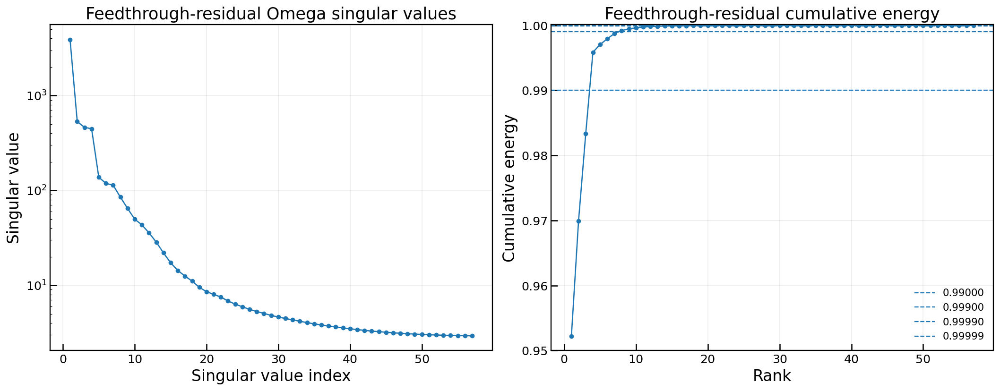

In [221]:
FEED_STATIC_COL = "eta_feedthrough_static"
FEED_DYN_COL = "eta_dynamic_after_feedthrough"
FEED_DYN_SCALED_COL = "eta_dynamic_after_feedthrough_scaled"

best_feed_model = feedthrough_models[BEST_FEEDTHROUGH_LIBRARY]


def predict_feedthrough_eta(current, soc, library_name=BEST_FEEDTHROUGH_LIBRARY):
    Phi, _ = feedthrough_design_matrix(current, soc, library_name)
    return Phi @ feedthrough_models[library_name]["theta"]


cycles_feed = {}
for cycle_name, df in cycles_asym.items():
    work = df.copy()
    work[FEED_STATIC_COL] = predict_feedthrough_eta(
        work[CURRENT_COL].to_numpy(dtype=float),
        work[SOC_COL].to_numpy(dtype=float),
    )
    work[FEED_DYN_COL] = work[ETA_COL] - work[FEED_STATIC_COL]
    cycles_feed[cycle_name] = work

train_feed_data = pd.concat([cycles_feed[name] for name in TRAIN_CYCLES], ignore_index=True)
feed_dyn_min = float(train_feed_data[FEED_DYN_COL].min())
feed_dyn_max = float(train_feed_data[FEED_DYN_COL].max())
feed_dyn_range = feed_dyn_max - feed_dyn_min

if feed_dyn_range == 0.0:
    raise ValueError("Dynamic residual range is zero; cannot scale feedthrough residual.")

for cycle_name in cycles_feed:
    values = cycles_feed[cycle_name][FEED_DYN_COL].to_numpy(dtype=float)
    cycles_feed[cycle_name][FEED_DYN_SCALED_COL] = 2.0 * (values - feed_dyn_min) / feed_dyn_range - 1.0


def inverse_feed_dyn_scaled(values_scaled):
    return 0.5 * (np.asarray(values_scaled, dtype=float) + 1.0) * feed_dyn_range + feed_dyn_min

feed_dyn_summary = pd.concat(cycles_feed.values(), ignore_index=True).groupby("cycle")[[FEED_STATIC_COL, FEED_DYN_COL, FEED_DYN_SCALED_COL]].agg(
    ["min", "max", "mean", "std"]
)
display(feed_dyn_summary)

FEED_DYN_STATE_COLS = [FEED_DYN_SCALED_COL]
FEED_DYN_CONTROL_COLS = ASYM_CONTROL_COLS

feed_dyn_snapshots_by_cycle = {}
for cycle_name, df in cycles_feed.items():
    feed_dyn_snapshots_by_cycle[cycle_name] = make_eta_delay_snapshots_for_cycle(
        df,
        ETA_DELAY,
        state_cols=FEED_DYN_STATE_COLS,
        control_cols=FEED_DYN_CONTROL_COLS,
    )

Z_feed_dyn_train = np.hstack([feed_dyn_snapshots_by_cycle[name]["Z_curr"] for name in TRAIN_CYCLES])
G_feed_dyn_train = np.hstack([feed_dyn_snapshots_by_cycle[name]["G_curr"] for name in TRAIN_CYCLES])
Y_feed_dyn_train = np.hstack([feed_dyn_snapshots_by_cycle[name]["Z_next"] for name in TRAIN_CYCLES])
Omega_feed_dyn_train = np.vstack([Z_feed_dyn_train, G_feed_dyn_train])

n_feed_dyn_z = Z_feed_dyn_train.shape[0]
n_feed_dyn_g = G_feed_dyn_train.shape[0]

gram_feed_dyn = Omega_feed_dyn_train @ Omega_feed_dyn_train.T
eigvals_feed_dyn, U_feed_dyn = linalg.eigh(gram_feed_dyn)
order = np.argsort(eigvals_feed_dyn)[::-1]
eigvals_feed_dyn = np.maximum(eigvals_feed_dyn[order], 0.0)
U_feed_dyn = U_feed_dyn[:, order]
s_feed_dyn = np.sqrt(eigvals_feed_dyn)

positive_feed_dyn = s_feed_dyn > 1e-12 * s_feed_dyn[0]
feed_dyn_numerical_rank = int(np.sum(positive_feed_dyn))
feed_dyn_cumulative_energy = np.cumsum(s_feed_dyn**2) / np.sum(s_feed_dyn**2)
FEED_DYN_RANKS_TO_COMPARE = [r for r in [5, 10, 15, 20, 30] if r <= feed_dyn_numerical_rank]

print(f"Omega_feed_dyn_train shape: {Omega_feed_dyn_train.shape}")
print(f"feedthrough dynamic-residual numerical rank: {feed_dyn_numerical_rank} / {len(s_feed_dyn)}")
print(f"feedthrough dynamic-residual ranks to compare: {FEED_DYN_RANKS_TO_COMPARE}")

rank_axis = np.arange(1, len(s_feed_dyn) + 1)
fig, axes = plt.subplots(1, 2, figsize=(15, 5.8), constrained_layout=True)
axes[0].semilogy(rank_axis, s_feed_dyn, marker="o", markersize=4)
axes[0].set_xlabel("Singular value index")
axes[0].set_ylabel("Singular value")
axes[0].set_title("Feedthrough-residual Omega singular values")

axes[1].plot(rank_axis, feed_dyn_cumulative_energy, marker="o", markersize=4)
for threshold in [0.99, 0.999, 0.9999, 0.99999]:
    axes[1].axhline(threshold, linestyle="--", linewidth=1.2, label=f"{threshold:.5f}")
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Cumulative energy")
axes[1].set_ylim(0.95, 1.0001)
axes[1].set_title("Feedthrough-residual cumulative energy")
axes[1].legend(frameon=False, loc="best")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)

plt.show()


## Step 16c: Rank and eigenvalue diagnostics for the feedthrough-residual model

The same rank discipline is used here: check one-step behavior and eigenvalues before judging open-loop rollout. The state now carries only the delayed dynamic residual, while the instantaneous voltage drop is handled in the output reconstruction.

,rank,energy_at_rank,dyn_train_one_step_rmse_scaled,max_abs_eig_A,n_eigs_outside_unit_circle
0,5,0.997058,0.032804,0.997816,0
1,10,0.999619,0.018919,0.996172,0
2,15,0.999916,0.010757,0.999288,0
3,20,0.999957,0.008455,0.995650,0
4,30,0.999980,0.007280,0.997446,0


,rank,cycle,voltage_rmse_V,voltage_mae_V,voltage_bias_V,dynamic_eta_rmse_V
0,5,HWFET,0.002352,0.001642,-2.220414e-04,0.002352
1,5,UDDS,0.006050,0.004006,9.938133e-05,0.006050
2,10,HWFET,0.001105,0.000729,-2.684796e-05,0.001105
3,10,UDDS,0.003236,0.001870,8.662550e-06,0.003236
4,15,HWFET,0.000468,0.000286,1.843770e-06,0.000468
5,15,UDDS,0.001591,0.000823,-1.287790e-06,0.001591
6,20,HWFET,0.000295,0.000176,7.602864e-06,0.000295
7,20,UDDS,0.001017,0.000491,-4.591418e-07,0.001017
8,30,HWFET,0.000214,0.000125,7.064280e-06,0.000214
9,30,UDDS,0.000710,0.000343,-1.222208e-06,0.000710


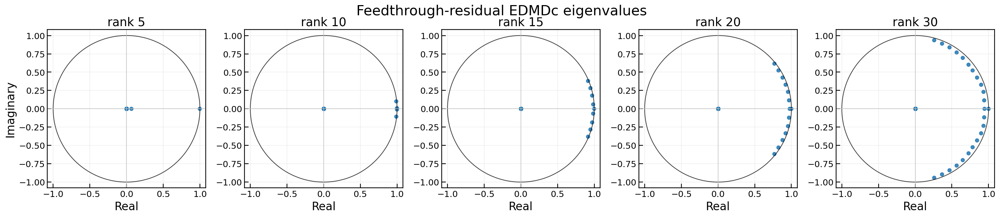

In [222]:
Y_feed_dyn_Omega_T = Y_feed_dyn_train @ Omega_feed_dyn_train.T


def fit_feed_dyn_ranked_operator(rank):
    U_r = U_feed_dyn[:, :rank]
    s_r = s_feed_dyn[:rank]
    K = (Y_feed_dyn_Omega_T @ U_r) @ np.diag(1.0 / (s_r**2)) @ U_r.T
    A = K[:, :n_feed_dyn_z]
    B = K[:, n_feed_dyn_z:]
    return K, A, B


feed_dyn_ranked_models = {}
feed_dyn_rank_rows = []
feed_dyn_one_step_rows = []

for rank in FEED_DYN_RANKS_TO_COMPARE:
    K_tmp, A_tmp, B_tmp = fit_feed_dyn_ranked_operator(rank)
    feed_dyn_ranked_models[rank] = {"K": K_tmp, "A": A_tmp, "B": B_tmp}

    dyn_pred_scaled = K_tmp[0:1, :] @ Omega_feed_dyn_train
    dyn_true_scaled = Y_feed_dyn_train[0:1, :]
    dyn_rmse_scaled = float(np.sqrt(np.mean((dyn_pred_scaled - dyn_true_scaled) ** 2)))
    eigvals_tmp = linalg.eigvals(A_tmp)
    eig_abs_tmp = np.abs(eigvals_tmp)

    feed_dyn_rank_rows.append({
        "rank": rank,
        "energy_at_rank": feed_dyn_cumulative_energy[rank - 1],
        "dyn_train_one_step_rmse_scaled": dyn_rmse_scaled,
        "max_abs_eig_A": float(np.max(eig_abs_tmp)),
        "n_eigs_outside_unit_circle": int(np.sum(eig_abs_tmp > 1.0 + 1e-10)),
    })

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        snapshots = feed_dyn_snapshots_by_cycle[cycle_name]
        omega_val = np.vstack([snapshots["Z_curr"], snapshots["G_curr"]])
        dyn_pred_scaled_val = (K_tmp[0:1, :] @ omega_val).reshape(-1)
        dyn_true_scaled_val = snapshots["Z_next"][0, :]

        df = cycles_feed[cycle_name]
        next_index = np.arange(ETA_DELAY + 1, len(df))
        dyn_pred = inverse_feed_dyn_scaled(dyn_pred_scaled_val)
        dyn_true = inverse_feed_dyn_scaled(dyn_true_scaled_val)
        eta_static_next = df[FEED_STATIC_COL].to_numpy(dtype=float)[next_index]
        soc_true_next = df[SOC_COL].to_numpy(dtype=float)[next_index]
        voltage_true = df[VOLTAGE_COL].to_numpy(dtype=float)[next_index]
        voltage_pred = OCV_func(soc_true_next) + eta_static_next + dyn_pred

        voltage_metrics = compute_error_metrics(voltage_true, voltage_pred)
        dyn_metrics = compute_error_metrics(dyn_true, dyn_pred)

        feed_dyn_one_step_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_bias_V": voltage_metrics["bias"],
            "dynamic_eta_rmse_V": dyn_metrics["rmse"],
        })

feed_dyn_rank_diagnostics = pd.DataFrame(feed_dyn_rank_rows)
feed_dyn_one_step_validation = pd.DataFrame(feed_dyn_one_step_rows)

display(feed_dyn_rank_diagnostics)
display(feed_dyn_one_step_validation)

n_rank_plots = len(FEED_DYN_RANKS_TO_COMPARE)
fig, axes = plt.subplots(1, n_rank_plots, figsize=(4.2 * n_rank_plots, 4.2), constrained_layout=True)
axes = np.atleast_1d(axes)
theta = np.linspace(0.0, 2.0 * np.pi, 400)
unit_x = np.cos(theta)
unit_y = np.sin(theta)

for ax, rank in zip(axes, FEED_DYN_RANKS_TO_COMPARE):
    eigvals_rank = linalg.eigvals(feed_dyn_ranked_models[rank]["A"])
    ax.plot(unit_x, unit_y, color="black", linewidth=1.1, alpha=0.75)
    ax.scatter(eigvals_rank.real, eigvals_rank.imag, s=28, color="tab:blue", alpha=0.85)
    ax.axhline(0.0, color="0.75", linewidth=0.8)
    ax.axvline(0.0, color="0.75", linewidth=0.8)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlim(-1.08, 1.08)
    ax.set_ylim(-1.08, 1.08)
    ax.set_title(f"rank {rank}")
    ax.set_xlabel("Real")
    ax.grid(True, alpha=0.22)

axes[0].set_ylabel("Imaginary")
fig.suptitle("Feedthrough-residual EDMDc eigenvalues", y=1.05)
fig.savefig("interim_feedthrough_residual_eigenvalues.svg", bbox_inches="tight")
fig.savefig("interim_feedthrough_residual_eigenvalues.png", dpi=300, bbox_inches="tight")
plt.show()


## Step 16d: Open-loop rollout with feedthrough plus dynamic residual EDMDc

During rollout, SOC is still advanced by Coulomb counting. The dynamic residual is rolled forward by EDMDc. The output voltage uses the feedthrough term at the prediction sample, using the known current and Coulomb-counted SOC.

In [223]:
def feed_dyn_control_vector(current_value, soc_value):
    raw_values = asymmetric_feature_values(np.array([current_value]), np.array([soc_value]))
    g_values = [1.0]

    for raw_col in ASYM_RAW_FEATURE_COLS:
        params = asym_feature_scale_params[raw_col]
        raw_value = float(raw_values[raw_col][0])
        scaled_value = 2.0 * (raw_value - params["min"]) / params["range"] - 1.0
        g_values.append(scaled_value)

    return np.asarray(g_values, dtype=float)


def rollout_feedthrough_dynamic_segment(
    df,
    A,
    B,
    n_delay=ETA_DELAY,
    max_rollout_steps=CONSTRAINED_MAX_ROLLOUT_STEPS,
    state_abs_limit=CONSTRAINED_STATE_ABS_LIMIT,
):
    dyn_scaled = df[FEED_DYN_SCALED_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    time = df[TIME_COL].to_numpy(dtype=float)

    z = dyn_scaled[0 : n_delay + 1][::-1].copy()
    soc_cc = np.empty(len(df), dtype=float)
    soc_cc[: n_delay + 1] = df[SOC_COL].to_numpy(dtype=float)[: n_delay + 1]

    pred_indices = []
    dyn_pred_scaled_rows = []
    dyn_pred_rows = []
    static_pred_rows = []
    soc_pred_rows = []

    stop_k = min(len(df) - 1, n_delay + max_rollout_steps)

    for k in range(n_delay, stop_k):
        dt = time[k + 1] - time[k]
        soc_next = soc_cc[k] + SOC_CURRENT_GAIN * dt * current[k]
        g_k = feed_dyn_control_vector(current[k], soc_cc[k])

        z_next = A @ z + B @ g_k

        if (not np.all(np.isfinite(z_next))) or (np.max(np.abs(z_next)) > state_abs_limit):
            return {
                "result": None,
                "status": "diverged",
                "failure_k": int(k + 1),
                "failure_time_s": float(time[k + 1]),
                "max_abs_state": float(np.nanmax(np.abs(z_next))),
            }

        dyn_next = float(inverse_feed_dyn_scaled(z_next[0]))
        static_next = float(predict_feedthrough_eta(np.array([current[k + 1]]), np.array([soc_next]))[0])

        soc_cc[k + 1] = soc_next
        pred_indices.append(k + 1)
        dyn_pred_scaled_rows.append(z_next[0])
        dyn_pred_rows.append(dyn_next)
        static_pred_rows.append(static_next)
        soc_pred_rows.append(soc_next)
        z = z_next

    pred_indices = np.asarray(pred_indices, dtype=int)
    result = df.iloc[pred_indices].copy()
    result["eta_dynamic_pred_scaled"] = np.asarray(dyn_pred_scaled_rows, dtype=float)
    result["eta_dynamic_pred"] = np.asarray(dyn_pred_rows, dtype=float)
    result["eta_static_pred"] = np.asarray(static_pred_rows, dtype=float)
    result["eta_pred"] = result["eta_static_pred"] + result["eta_dynamic_pred"]
    result["soc_coulomb"] = np.asarray(soc_pred_rows, dtype=float)
    result["voltage_pred"] = result["eta_pred"] + OCV_func(result["soc_coulomb"].to_numpy(dtype=float))

    return {
        "result": result.reset_index(drop=True),
        "status": "ok_short" if stop_k < len(df) - 1 else "ok_full",
        "failure_k": None,
        "failure_time_s": None,
        "max_abs_state": float(np.max(np.abs(z))),
    }


feed_dyn_rollout_rows = []
feed_dyn_rollout_results = {}

for rank in FEED_DYN_RANKS_TO_COMPARE:
    A_tmp = feed_dyn_ranked_models[rank]["A"]
    B_tmp = feed_dyn_ranked_models[rank]["B"]
    feed_dyn_rollout_results[rank] = {}

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        df = cycles_feed[cycle_name]
        rollout = rollout_feedthrough_dynamic_segment(df, A_tmp, B_tmp)

        if rollout["result"] is not None:
            result = rollout["result"]
            feed_dyn_rollout_results[rank][cycle_name] = result
            voltage_metrics = compute_error_metrics(result[VOLTAGE_COL], result["voltage_pred"])
            eta_metrics = compute_error_metrics(result[ETA_COL], result["eta_pred"])
            dyn_metrics = compute_error_metrics(result[FEED_DYN_COL], result["eta_dynamic_pred"])
            soc_metrics = compute_error_metrics(result[SOC_COL], result["soc_coulomb"])
        else:
            voltage_metrics = {"rmse": np.nan, "mae": np.nan, "max_abs_error": np.nan, "bias": np.nan}
            eta_metrics = {"rmse": np.nan}
            dyn_metrics = {"rmse": np.nan}
            soc_metrics = {"rmse": np.nan}

        feed_dyn_rollout_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "status": rollout["status"],
            "failure_time_s": rollout["failure_time_s"],
            "n_predicted_samples": 0 if rollout["result"] is None else len(rollout["result"]),
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
            "voltage_bias_V": voltage_metrics["bias"],
            "eta_rmse_V": eta_metrics["rmse"],
            "dynamic_eta_rmse_V": dyn_metrics["rmse"],
            "soc_rmse": soc_metrics["rmse"],
        })

feed_dyn_rollout_metrics = pd.DataFrame(feed_dyn_rollout_rows)
feed_dyn_rollout_metrics["voltage_rmse_mV"] = 1000.0 * feed_dyn_rollout_metrics["voltage_rmse_V"]
feed_dyn_rollout_metrics["voltage_bias_mV"] = 1000.0 * feed_dyn_rollout_metrics["voltage_bias_V"]

display(feed_dyn_rollout_metrics)


,rank,cycle,status,failure_time_s,n_predicted_samples,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,voltage_bias_V,eta_rmse_V,dynamic_eta_rmse_V,soc_rmse,voltage_rmse_mV,voltage_bias_mV
0,5,HWFET,ok_short,None,20000,0.012501,0.011281,0.029565,-0.011170,0.012610,0.012607,0.000121,12.501342,-11.170419
1,5,UDDS,ok_short,None,20000,0.014614,0.011207,0.060882,0.002599,0.014606,0.014603,0.000139,14.614170,2.599272
2,10,HWFET,ok_short,None,20000,0.008933,0.007297,0.021783,0.006654,0.008862,0.008863,0.000121,8.932719,6.653869
3,10,UDDS,ok_short,None,20000,0.013327,0.009754,0.061900,0.006424,0.013275,0.013273,0.000139,13.326937,6.423615
4,15,HWFET,ok_short,None,20000,0.007072,0.006006,0.023619,-0.003236,0.007149,0.007146,0.000121,7.072495,-3.235836
5,15,UDDS,ok_short,None,20000,0.010196,0.007474,0.055918,0.000178,0.010206,0.010200,0.000139,10.195894,0.178468
6,20,HWFET,ok_short,None,20000,0.007262,0.006006,0.016369,0.004881,0.007202,0.007202,0.000121,7.261897,4.880648
7,20,UDDS,ok_short,None,20000,0.010524,0.008296,0.055489,0.003150,0.010494,0.010489,0.000139,10.524080,3.149756
8,30,HWFET,ok_short,None,20000,0.006333,0.005283,0.014710,0.003410,0.006291,0.006290,0.000121,6.333107,3.409523
9,30,UDDS,ok_short,None,20000,0.010554,0.008064,0.051861,0.001198,0.010546,0.010539,0.000139,10.554064,1.197694


## Step 16e: Compare feedthrough-residual rollout with previous models

The comparison includes the static feedthrough model, the previous affine/asymmetric EDMDc branch, and the feedthrough plus dynamic-residual EDMDc branch. The useful model is the one that improves RMSE and bias while keeping stable eigenvalues and stable rollout.

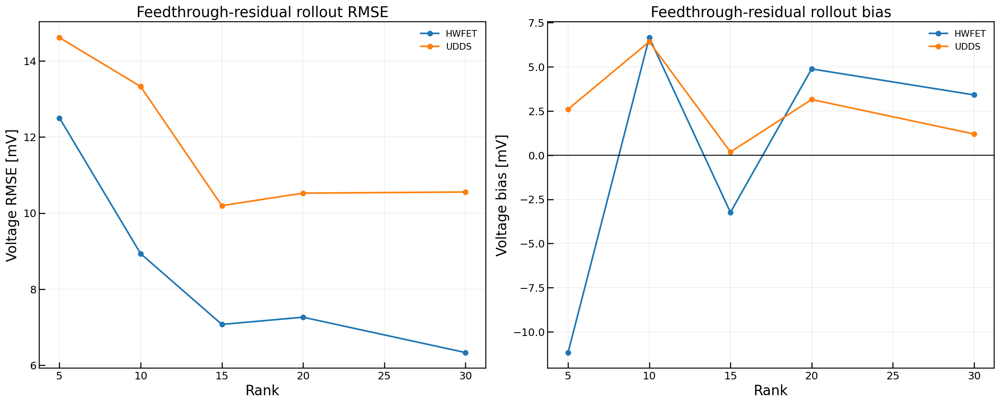

,cycle,voltage_rmse_V,voltage_bias_V,model,voltage_rmse_mV,voltage_bias_mV
14,HWFET,0.006333,0.003410,feedthrough + dyn r=30,6.333107,3.409523
10,HWFET,0.007072,-0.003236,feedthrough + dyn r=15,7.072495,-3.235836
12,HWFET,0.007262,0.004881,feedthrough + dyn r=20,7.261897,4.880648
8,HWFET,0.008933,0.006654,feedthrough + dyn r=10,8.932719,6.653869
6,HWFET,0.012501,-0.011170,feedthrough + dyn r=5,12.501342,-11.170419
0,HWFET,0.013376,0.006512,static feedthrough: quadratic_soc_bathtub_asym,13.376305,6.512272
4,HWFET,0.015685,0.014097,affine/asym r=5,15.684715,14.096627
2,HWFET,0.018510,0.012737,OCV + R_I I,18.509993,12.736699
11,UDDS,0.010196,0.000178,feedthrough + dyn r=15,10.195894,0.178468
13,UDDS,0.010524,0.003150,feedthrough + dyn r=20,10.524080,3.149756


Best feedthrough-residual rank by mean validation rollout RMSE: 30


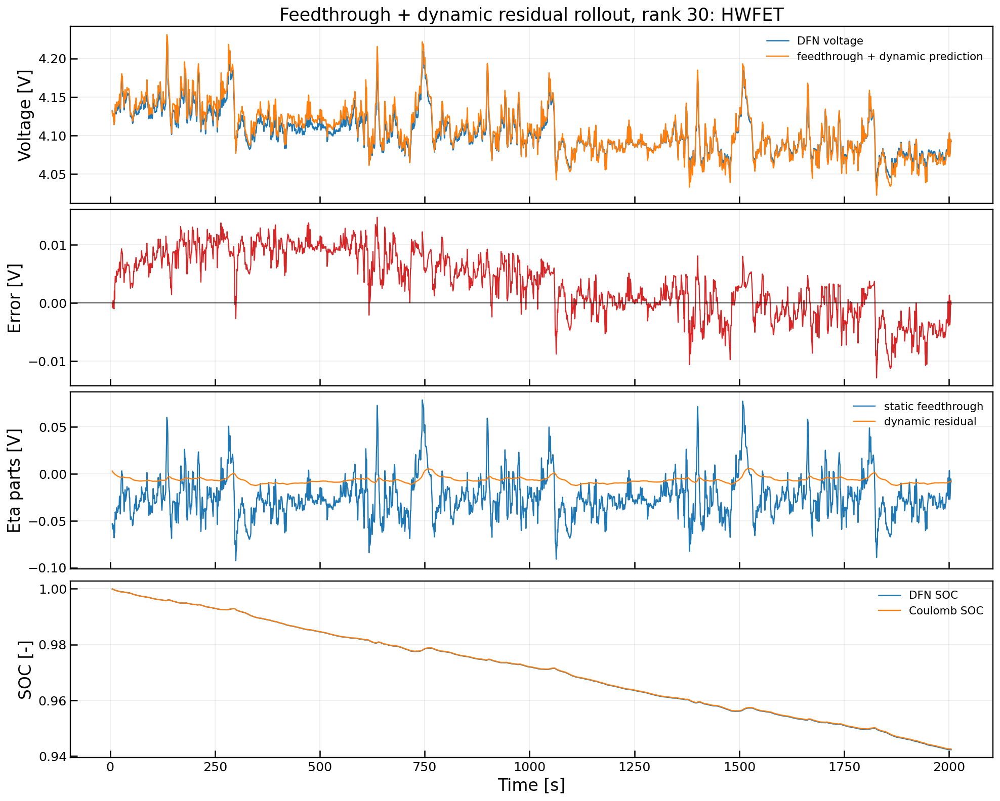

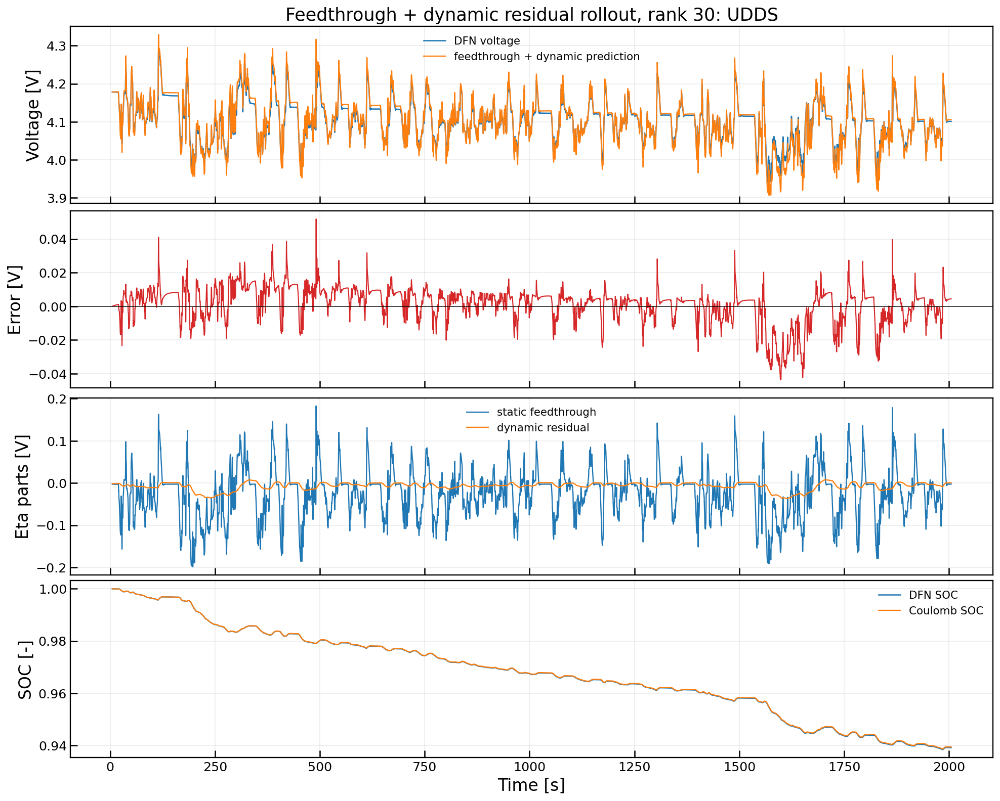

In [224]:
feed_dyn_stable = feed_dyn_rollout_metrics.loc[feed_dyn_rollout_metrics["status"].str.startswith("ok")].copy()

fig, axes = plt.subplots(1, 2, figsize=(17, 6.8), constrained_layout=True)

for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
    group = feed_dyn_stable.loc[feed_dyn_stable["cycle"] == cycle_name].sort_values("rank")
    axes[0].plot(group["rank"], group["voltage_rmse_mV"], marker="o", linewidth=2.0, label=cycle_name)
    axes[1].plot(group["rank"], group["voltage_bias_mV"], marker="o", linewidth=2.0, label=cycle_name)

axes[0].set_xlabel("Rank")
axes[0].set_ylabel("Voltage RMSE [mV]")
axes[0].set_title("Feedthrough-residual rollout RMSE")

axes[1].axhline(0.0, color="black", linewidth=1.1)
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Voltage bias [mV]")
axes[1].set_title("Feedthrough-residual rollout bias")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)
    ax.legend(frameon=False, loc="best")

fig.savefig("interim_feedthrough_residual_rollout_diagnostics.svg", bbox_inches="tight")
fig.savefig("interim_feedthrough_residual_rollout_diagnostics.png", dpi=300, bbox_inches="tight")
plt.show()

comparison_rows = []

static_best_rows = feedthrough_static_metrics.loc[
    (feedthrough_static_metrics["library"] == BEST_FEEDTHROUGH_LIBRARY)
    & (feedthrough_static_metrics["cycle"].isin(CONSTRAINED_VALIDATION_CYCLES)),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
static_best_rows["model"] = f"static feedthrough: {BEST_FEEDTHROUGH_LIBRARY}"
comparison_rows.append(static_best_rows)

if "rollout_model_comparison" in globals():
    prior_best = rollout_model_comparison.loc[
        rollout_model_comparison["model"].isin(["OCV + R_I I", "affine/asym r=5"]),
        ["cycle", "model", "voltage_rmse_V", "voltage_bias_V"],
    ].copy()
    comparison_rows.append(prior_best)

for rank in FEED_DYN_RANKS_TO_COMPARE:
    rank_rows = feed_dyn_rollout_metrics.loc[
        (feed_dyn_rollout_metrics["rank"] == rank)
        & (feed_dyn_rollout_metrics["status"].str.startswith("ok")),
        ["cycle", "voltage_rmse_V", "voltage_bias_V"],
    ].copy()
    rank_rows["model"] = f"feedthrough + dyn r={rank}"
    comparison_rows.append(rank_rows)

feedthrough_model_comparison = pd.concat(comparison_rows, ignore_index=True)
feedthrough_model_comparison["voltage_rmse_mV"] = 1000.0 * feedthrough_model_comparison["voltage_rmse_V"]
feedthrough_model_comparison["voltage_bias_mV"] = 1000.0 * feedthrough_model_comparison["voltage_bias_V"]

display(feedthrough_model_comparison.sort_values(["cycle", "voltage_rmse_mV"]))

best_feed_dyn_rank = int(feed_dyn_stable.groupby("rank")["voltage_rmse_V"].mean().sort_values().index[0])
print(f"Best feedthrough-residual rank by mean validation rollout RMSE: {best_feed_dyn_rank}")

for cycle_name, result in feed_dyn_rollout_results.get(best_feed_dyn_rank, {}).items():
    fig, axes = plt.subplots(4, 1, figsize=(14, 11.2), sharex=True, constrained_layout=True)

    axes[0].plot(result[TIME_COL], result[VOLTAGE_COL], label="DFN voltage", linewidth=1.3)
    axes[0].plot(result[TIME_COL], result["voltage_pred"], label="feedthrough + dynamic prediction", linewidth=1.2)
    axes[1].plot(result[TIME_COL], result["voltage_pred"] - result[VOLTAGE_COL], color="tab:red", linewidth=1.1)
    axes[1].axhline(0.0, color="black", linewidth=1.0, alpha=0.7)
    axes[2].plot(result[TIME_COL], result["eta_static_pred"], label="static feedthrough", linewidth=1.2)
    axes[2].plot(result[TIME_COL], result["eta_dynamic_pred"], label="dynamic residual", linewidth=1.2)
    axes[3].plot(result[TIME_COL], result[SOC_COL], label="DFN SOC", linewidth=1.3)
    axes[3].plot(result[TIME_COL], result["soc_coulomb"], label="Coulomb SOC", linewidth=1.2)

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Error [V]")
    axes[2].set_ylabel("Eta parts [V]")
    axes[3].set_ylabel("SOC [-]")
    axes[3].set_xlabel("Time [s]")
    axes[0].set_title(f"Feedthrough + dynamic residual rollout, rank {best_feed_dyn_rank}: {cycle_name}")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=7, width=1.3)

    axes[0].legend(frameon=False, loc="best")
    axes[2].legend(frameon=False, loc="best")
    axes[3].legend(frameon=False, loc="best")

    safe_cycle_name = cycle_name.lower().replace(" ", "_")
    fig.savefig(f"interim_feedthrough_residual_timeseries_{safe_cycle_name}.svg", bbox_inches="tight")
    fig.savefig(f"interim_feedthrough_residual_timeseries_{safe_cycle_name}.png", dpi=300, bbox_inches="tight")
    plt.show()


## Step 17a: Pruned SOC-bathtub feedthrough robustness check

The best Step 16 result used the quadratic SOC-bathtub feedthrough library. That gave the lowest errors so far, but its static design matrix was more strongly conditioned than the simpler libraries. This check repeats the same feedthrough-residual EDMDc workflow using the pruned SOC-bathtub library:

$$\eta_{static,k} = I^+_k R^+(SOC_k) + I^-_k R^-(SOC_k)$$

with:

$$R^\pm(SOC) = a^\pm_0 + a^\pm_1 SOC + a^\pm_2(SOC - 0.5)^2$$

This keeps the static term current-dependent, direction-dependent, and SOC-dependent, while avoiding quadratic-current terms.

,library,cycle,n_features,matrix_rank,condition_number,voltage_rmse_V,voltage_mae_V,voltage_bias_V,voltage_rmse_mV,voltage_bias_mV
3,soc_bathtub_asym,train,6,6,23.994985,0.019661,0.014340,0.004599,19.660538,4.599242
4,soc_bathtub_asym,HWFET,6,6,23.994985,0.017248,0.012559,0.012290,17.248170,12.289687
5,soc_bathtub_asym,UDDS,6,6,23.994985,0.016247,0.011608,0.009565,16.246861,9.565344


eta_pruned_feedthrough_static                      \
                                                    min       max      mean   
cycle                                                                         
HWFET                                         -0.121963  0.108128 -0.018724   
Pseudo-Random_Limit_Based                     -0.366151  0.213836 -0.009915   
UDDS                                          -0.494677  0.251420 -0.019289   
US06                                          -0.389685  0.166451 -0.025838   
WLTP                                          -0.177981  0.106778 -0.011751   

                                    eta_pruned_dynamic_after_feedthrough  \
                                std                                  min   
cycle                                                                      
HWFET                      0.019272                            -0.165919   
Pseudo-Random_Limit_Based  0.070844                            -0.256470   
UDDS                       0.050676                            -0.345020   
US06                       0.052303                            -0.225784   
WLTP                       0.027022                            -0.209221   

                                                         \
                                max      mean       std   
cycle                                                     
HWFET                      0.038060 -0.012290  0.012102   
Pseudo-Random_Limit_Based  0.140199 -0.001174  0.018976   
UDDS                       0.111320 -0.009565  0.013133   
US06                       0.125987 -0.013941  0.016143   
WLTP                       0.037630 -0.006715  0.014201   

                          eta_pruned_dynamic_after_feedthrough_scaled  \
                                                                  min   
cycle                                                                   
HWFET                                                       -0.543441   
Pseudo-Random_Limit_Based                                   -1.000000   
UDDS                                                        -1.446470   
US06                                                        -0.845284   
WLTP                                                        -0.761772   

                                                         
                                max      mean       std  
cycle                                                    
HWFET                      0.485016  0.231155  0.061019  
Pseudo-Random_Limit_Based  1.000000  0.287200  0.095676  
UDDS                       0.854392  0.244891  0.066214  
US06                       0.928345  0.222830  0.081391  
WLTP                       0.482850  0.259264  0.071603

Omega_pruned_dyn_train shape: (57, 879809)
pruned feedthrough dynamic-residual numerical rank: 57 / 57
pruned feedthrough dynamic-residual ranks to compare: [5, 10, 15, 20, 30]


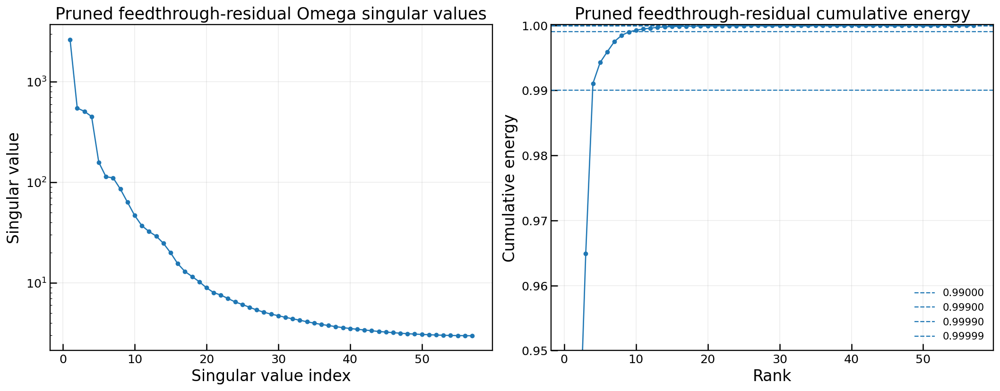

In [225]:
PRUNED_FEEDTHROUGH_LIBRARY = "soc_bathtub_asym"
PRUNED_FEED_STATIC_COL = "eta_pruned_feedthrough_static"
PRUNED_FEED_DYN_COL = "eta_pruned_dynamic_after_feedthrough"
PRUNED_FEED_DYN_SCALED_COL = "eta_pruned_dynamic_after_feedthrough_scaled"


def predict_pruned_feedthrough_eta(current, soc):
    Phi, _ = feedthrough_design_matrix(current, soc, PRUNED_FEEDTHROUGH_LIBRARY)
    return Phi @ feedthrough_models[PRUNED_FEEDTHROUGH_LIBRARY]["theta"]


cycles_pruned_feed = {}
for cycle_name, df in cycles_asym.items():
    work = df.copy()
    work[PRUNED_FEED_STATIC_COL] = predict_pruned_feedthrough_eta(
        work[CURRENT_COL].to_numpy(dtype=float),
        work[SOC_COL].to_numpy(dtype=float),
    )
    work[PRUNED_FEED_DYN_COL] = work[ETA_COL] - work[PRUNED_FEED_STATIC_COL]
    cycles_pruned_feed[cycle_name] = work

train_pruned_feed_data = pd.concat([cycles_pruned_feed[name] for name in TRAIN_CYCLES], ignore_index=True)
pruned_dyn_min = float(train_pruned_feed_data[PRUNED_FEED_DYN_COL].min())
pruned_dyn_max = float(train_pruned_feed_data[PRUNED_FEED_DYN_COL].max())
pruned_dyn_range = pruned_dyn_max - pruned_dyn_min

if pruned_dyn_range == 0.0:
    raise ValueError("Pruned dynamic residual range is zero; cannot scale residual.")

for cycle_name in cycles_pruned_feed:
    values = cycles_pruned_feed[cycle_name][PRUNED_FEED_DYN_COL].to_numpy(dtype=float)
    cycles_pruned_feed[cycle_name][PRUNED_FEED_DYN_SCALED_COL] = 2.0 * (values - pruned_dyn_min) / pruned_dyn_range - 1.0


def inverse_pruned_dyn_scaled(values_scaled):
    return 0.5 * (np.asarray(values_scaled, dtype=float) + 1.0) * pruned_dyn_range + pruned_dyn_min

pruned_feed_static_metrics = feedthrough_static_metrics.loc[
    feedthrough_static_metrics["library"] == PRUNED_FEEDTHROUGH_LIBRARY
].copy()
display(pruned_feed_static_metrics)

pruned_dyn_summary = pd.concat(cycles_pruned_feed.values(), ignore_index=True).groupby("cycle")[[
    PRUNED_FEED_STATIC_COL,
    PRUNED_FEED_DYN_COL,
    PRUNED_FEED_DYN_SCALED_COL,
]].agg(["min", "max", "mean", "std"])
display(pruned_dyn_summary)

PRUNED_DYN_STATE_COLS = [PRUNED_FEED_DYN_SCALED_COL]
PRUNED_DYN_CONTROL_COLS = ASYM_CONTROL_COLS

pruned_dyn_snapshots_by_cycle = {}
for cycle_name, df in cycles_pruned_feed.items():
    pruned_dyn_snapshots_by_cycle[cycle_name] = make_eta_delay_snapshots_for_cycle(
        df,
        ETA_DELAY,
        state_cols=PRUNED_DYN_STATE_COLS,
        control_cols=PRUNED_DYN_CONTROL_COLS,
    )

Z_pruned_dyn_train = np.hstack([pruned_dyn_snapshots_by_cycle[name]["Z_curr"] for name in TRAIN_CYCLES])
G_pruned_dyn_train = np.hstack([pruned_dyn_snapshots_by_cycle[name]["G_curr"] for name in TRAIN_CYCLES])
Y_pruned_dyn_train = np.hstack([pruned_dyn_snapshots_by_cycle[name]["Z_next"] for name in TRAIN_CYCLES])
Omega_pruned_dyn_train = np.vstack([Z_pruned_dyn_train, G_pruned_dyn_train])

n_pruned_dyn_z = Z_pruned_dyn_train.shape[0]
n_pruned_dyn_g = G_pruned_dyn_train.shape[0]

gram_pruned_dyn = Omega_pruned_dyn_train @ Omega_pruned_dyn_train.T
eigvals_pruned_dyn, U_pruned_dyn = linalg.eigh(gram_pruned_dyn)
order = np.argsort(eigvals_pruned_dyn)[::-1]
eigvals_pruned_dyn = np.maximum(eigvals_pruned_dyn[order], 0.0)
U_pruned_dyn = U_pruned_dyn[:, order]
s_pruned_dyn = np.sqrt(eigvals_pruned_dyn)

positive_pruned_dyn = s_pruned_dyn > 1e-12 * s_pruned_dyn[0]
pruned_dyn_numerical_rank = int(np.sum(positive_pruned_dyn))
pruned_dyn_cumulative_energy = np.cumsum(s_pruned_dyn**2) / np.sum(s_pruned_dyn**2)
PRUNED_DYN_RANKS_TO_COMPARE = [r for r in [5, 10, 15, 20, 30] if r <= pruned_dyn_numerical_rank]

print(f"Omega_pruned_dyn_train shape: {Omega_pruned_dyn_train.shape}")
print(f"pruned feedthrough dynamic-residual numerical rank: {pruned_dyn_numerical_rank} / {len(s_pruned_dyn)}")
print(f"pruned feedthrough dynamic-residual ranks to compare: {PRUNED_DYN_RANKS_TO_COMPARE}")

rank_axis = np.arange(1, len(s_pruned_dyn) + 1)
fig, axes = plt.subplots(1, 2, figsize=(15, 5.8), constrained_layout=True)
axes[0].semilogy(rank_axis, s_pruned_dyn, marker="o", markersize=4)
axes[0].set_xlabel("Singular value index")
axes[0].set_ylabel("Singular value")
axes[0].set_title("Pruned feedthrough-residual Omega singular values")

axes[1].plot(rank_axis, pruned_dyn_cumulative_energy, marker="o", markersize=4)
for threshold in [0.99, 0.999, 0.9999, 0.99999]:
    axes[1].axhline(threshold, linestyle="--", linewidth=1.2, label=f"{threshold:.5f}")
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Cumulative energy")
axes[1].set_ylim(0.95, 1.0001)
axes[1].set_title("Pruned feedthrough-residual cumulative energy")
axes[1].legend(frameon=False, loc="best")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)

plt.show()


## Step 17b: Rank, eigenvalue, and rollout diagnostics for the pruned feedthrough model

The diagnostics are kept identical to Step 16 so the pruned SOC-bathtub feedthrough model can be compared directly against the full quadratic feedthrough model.

,rank,energy_at_rank,dyn_train_one_step_rmse_scaled,max_abs_eig_A,n_eigs_outside_unit_circle
0,5,0.994283,0.031185,0.999047,0
1,10,0.999265,0.017445,0.996687,0
2,15,0.999816,0.011495,0.999254,0
3,20,0.999909,0.008573,0.994625,0
4,30,0.999958,0.007406,0.997298,0


,rank,cycle,voltage_rmse_V,voltage_mae_V,voltage_bias_V,dynamic_eta_rmse_V
0,5,HWFET,0.001521,0.000834,-0.000151,0.001521
1,5,UDDS,0.006347,0.003262,0.000137,0.006347
2,10,HWFET,0.000535,0.000242,0.000032,0.000535
3,10,UDDS,0.004026,0.001585,0.000048,0.004026
4,15,HWFET,0.000245,0.000101,0.000016,0.000245
5,15,UDDS,0.002100,0.000775,0.000012,0.002100
6,20,HWFET,0.000147,0.000060,0.000020,0.000147
7,20,UDDS,0.001285,0.000430,0.000009,0.001285
8,30,HWFET,0.000106,0.000044,0.000016,0.000106
9,30,UDDS,0.000900,0.000299,0.000005,0.000900


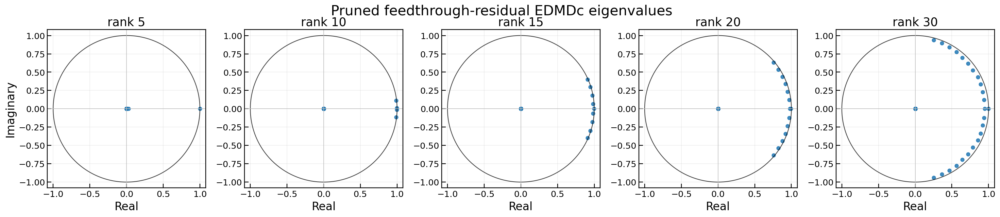

In [226]:
Y_pruned_dyn_Omega_T = Y_pruned_dyn_train @ Omega_pruned_dyn_train.T


def fit_pruned_dyn_ranked_operator(rank):
    U_r = U_pruned_dyn[:, :rank]
    s_r = s_pruned_dyn[:rank]
    K = (Y_pruned_dyn_Omega_T @ U_r) @ np.diag(1.0 / (s_r**2)) @ U_r.T
    A = K[:, :n_pruned_dyn_z]
    B = K[:, n_pruned_dyn_z:]
    return K, A, B


pruned_dyn_ranked_models = {}
pruned_dyn_rank_rows = []
pruned_dyn_one_step_rows = []

for rank in PRUNED_DYN_RANKS_TO_COMPARE:
    K_tmp, A_tmp, B_tmp = fit_pruned_dyn_ranked_operator(rank)
    pruned_dyn_ranked_models[rank] = {"K": K_tmp, "A": A_tmp, "B": B_tmp}

    dyn_pred_scaled = K_tmp[0:1, :] @ Omega_pruned_dyn_train
    dyn_true_scaled = Y_pruned_dyn_train[0:1, :]
    dyn_rmse_scaled = float(np.sqrt(np.mean((dyn_pred_scaled - dyn_true_scaled) ** 2)))
    eigvals_tmp = linalg.eigvals(A_tmp)
    eig_abs_tmp = np.abs(eigvals_tmp)

    pruned_dyn_rank_rows.append({
        "rank": rank,
        "energy_at_rank": pruned_dyn_cumulative_energy[rank - 1],
        "dyn_train_one_step_rmse_scaled": dyn_rmse_scaled,
        "max_abs_eig_A": float(np.max(eig_abs_tmp)),
        "n_eigs_outside_unit_circle": int(np.sum(eig_abs_tmp > 1.0 + 1e-10)),
    })

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        snapshots = pruned_dyn_snapshots_by_cycle[cycle_name]
        omega_val = np.vstack([snapshots["Z_curr"], snapshots["G_curr"]])
        dyn_pred_scaled_val = (K_tmp[0:1, :] @ omega_val).reshape(-1)
        dyn_true_scaled_val = snapshots["Z_next"][0, :]

        df = cycles_pruned_feed[cycle_name]
        next_index = np.arange(ETA_DELAY + 1, len(df))
        dyn_pred = inverse_pruned_dyn_scaled(dyn_pred_scaled_val)
        dyn_true = inverse_pruned_dyn_scaled(dyn_true_scaled_val)
        eta_static_next = df[PRUNED_FEED_STATIC_COL].to_numpy(dtype=float)[next_index]
        soc_true_next = df[SOC_COL].to_numpy(dtype=float)[next_index]
        voltage_true = df[VOLTAGE_COL].to_numpy(dtype=float)[next_index]
        voltage_pred = OCV_func(soc_true_next) + eta_static_next + dyn_pred

        voltage_metrics = compute_error_metrics(voltage_true, voltage_pred)
        dyn_metrics = compute_error_metrics(dyn_true, dyn_pred)

        pruned_dyn_one_step_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_bias_V": voltage_metrics["bias"],
            "dynamic_eta_rmse_V": dyn_metrics["rmse"],
        })

pruned_dyn_rank_diagnostics = pd.DataFrame(pruned_dyn_rank_rows)
pruned_dyn_one_step_validation = pd.DataFrame(pruned_dyn_one_step_rows)

display(pruned_dyn_rank_diagnostics)
display(pruned_dyn_one_step_validation)

n_rank_plots = len(PRUNED_DYN_RANKS_TO_COMPARE)
fig, axes = plt.subplots(1, n_rank_plots, figsize=(4.2 * n_rank_plots, 4.2), constrained_layout=True)
axes = np.atleast_1d(axes)
theta = np.linspace(0.0, 2.0 * np.pi, 400)
unit_x = np.cos(theta)
unit_y = np.sin(theta)

for ax, rank in zip(axes, PRUNED_DYN_RANKS_TO_COMPARE):
    eigvals_rank = linalg.eigvals(pruned_dyn_ranked_models[rank]["A"])
    ax.plot(unit_x, unit_y, color="black", linewidth=1.1, alpha=0.75)
    ax.scatter(eigvals_rank.real, eigvals_rank.imag, s=28, color="tab:blue", alpha=0.85)
    ax.axhline(0.0, color="0.75", linewidth=0.8)
    ax.axvline(0.0, color="0.75", linewidth=0.8)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlim(-1.08, 1.08)
    ax.set_ylim(-1.08, 1.08)
    ax.set_title(f"rank {rank}")
    ax.set_xlabel("Real")
    ax.grid(True, alpha=0.22)

axes[0].set_ylabel("Imaginary")
fig.suptitle("Pruned feedthrough-residual EDMDc eigenvalues", y=1.05)
fig.savefig("interim_pruned_feedthrough_residual_eigenvalues.svg", bbox_inches="tight")
fig.savefig("interim_pruned_feedthrough_residual_eigenvalues.png", dpi=300, bbox_inches="tight")
plt.show()


## Step 17c: Open-loop rollout and comparison for the pruned feedthrough model

The rollout uses the same Coulomb-counted SOC and the same delayed dynamic-residual structure. The only change from Step 16 is the simpler static feedthrough library.

,rank,cycle,status,failure_time_s,n_predicted_samples,voltage_rmse_V,voltage_mae_V,voltage_max_abs_error_V,voltage_bias_V,eta_rmse_V,dynamic_eta_rmse_V,soc_rmse,voltage_rmse_mV,voltage_bias_mV
0,5,HWFET,ok_short,None,20000,0.022707,0.021441,0.036859,-0.021270,0.022821,0.022819,0.000121,22.706783,-21.269562
1,5,UDDS,ok_short,None,20000,0.016879,0.013498,0.078747,0.001858,0.016881,0.016879,0.000139,16.878606,1.858372
2,10,HWFET,ok_short,None,20000,0.012893,0.011340,0.027538,0.011195,0.012804,0.012806,0.000121,12.893047,11.195200
3,10,UDDS,ok_short,None,20000,0.015569,0.011406,0.072294,0.009179,0.015502,0.015501,0.000139,15.569452,9.179008
4,15,HWFET,ok_short,None,20000,0.006336,0.005361,0.016561,0.000997,0.006342,0.006342,0.000121,6.335539,0.997404
5,15,UDDS,ok_short,None,20000,0.012570,0.008599,0.080085,0.004597,0.012534,0.012532,0.000139,12.569685,4.596608
6,20,HWFET,ok_short,None,20000,0.010965,0.009572,0.021119,0.009564,0.010876,0.010878,0.000121,10.964914,9.564086
7,20,UDDS,ok_short,None,20000,0.012437,0.009282,0.083803,0.006587,0.012377,0.012374,0.000139,12.437089,6.586624
8,30,HWFET,ok_short,None,20000,0.009533,0.008063,0.018926,0.008045,0.009449,0.009450,0.000121,9.533153,8.044603
9,30,UDDS,ok_short,None,20000,0.011497,0.008331,0.088403,0.004652,0.011451,0.011448,0.000139,11.497117,4.651566


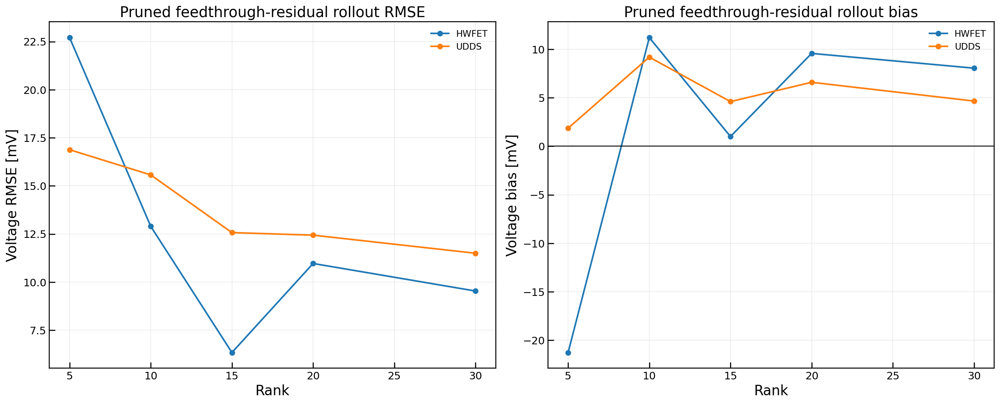

,cycle,model,voltage_rmse_V,voltage_bias_V,voltage_rmse_mV,voltage_bias_mV
4,HWFET,feedthrough + dyn r=30,0.006333,0.003410,6.333107,3.409523
12,HWFET,pruned feedthrough + dyn r=15,0.006336,0.000997,6.335539,0.997404
2,HWFET,feedthrough + dyn r=15,0.007072,-0.003236,7.072495,-3.235836
16,HWFET,pruned feedthrough + dyn r=30,0.009533,0.008045,9.533153,8.044603
14,HWFET,pruned feedthrough + dyn r=20,0.010965,0.009564,10.964914,9.564086
10,HWFET,pruned feedthrough + dyn r=10,0.012893,0.011195,12.893047,11.195200
0,HWFET,static feedthrough: quadratic_soc_bathtub_asym,0.013376,0.006512,13.376305,6.512272
6,HWFET,static feedthrough: pruned SOC-bathtub,0.017248,0.012290,17.248170,12.289687
8,HWFET,pruned feedthrough + dyn r=5,0.022707,-0.021270,22.706783,-21.269562
3,UDDS,feedthrough + dyn r=15,0.010196,0.000178,10.195894,0.178468


Best pruned feedthrough-residual rank by mean validation rollout RMSE: 15


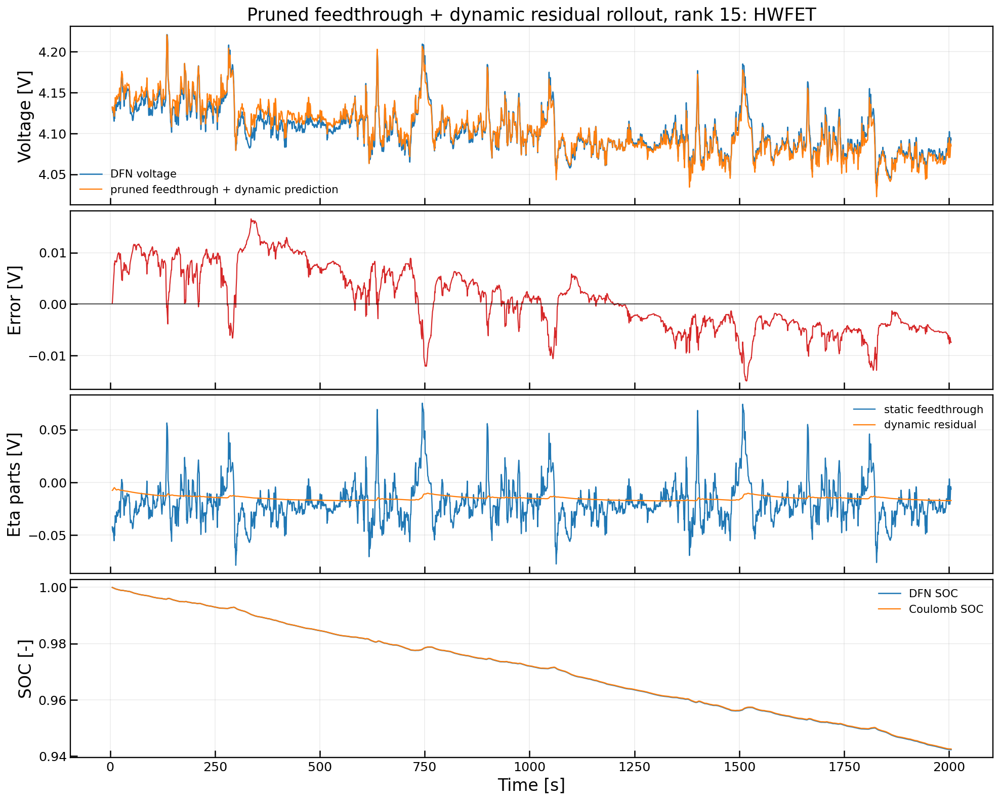

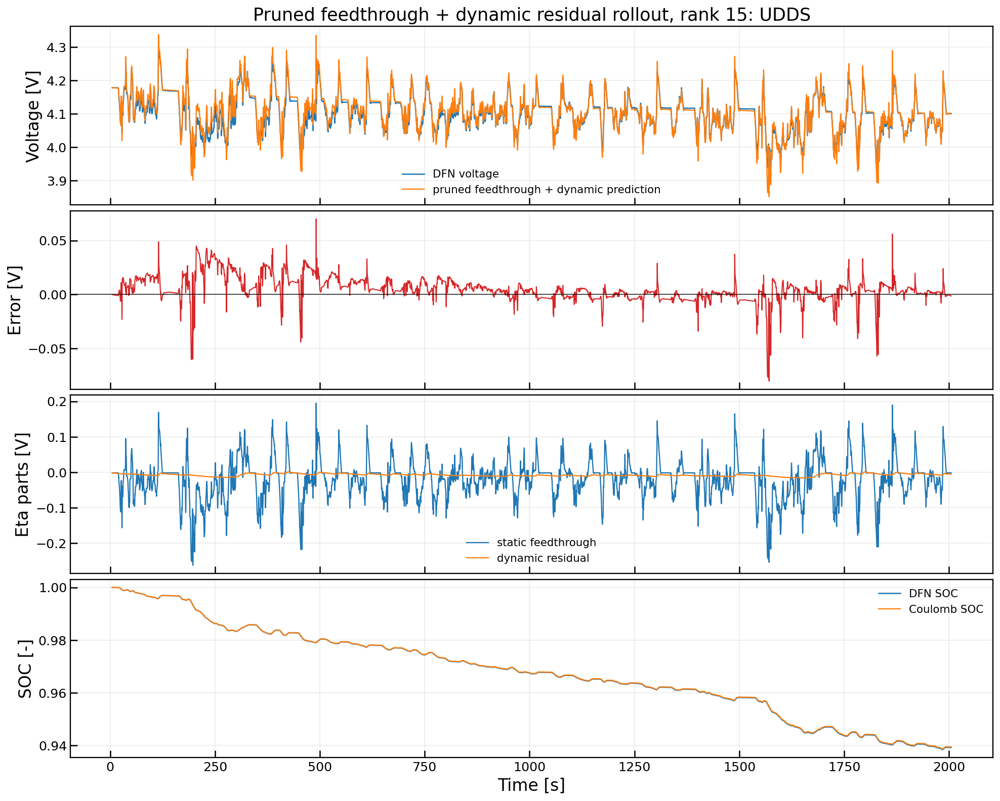

In [227]:
def rollout_pruned_feedthrough_dynamic_segment(
    df,
    A,
    B,
    n_delay=ETA_DELAY,
    max_rollout_steps=CONSTRAINED_MAX_ROLLOUT_STEPS,
    state_abs_limit=CONSTRAINED_STATE_ABS_LIMIT,
):
    dyn_scaled = df[PRUNED_FEED_DYN_SCALED_COL].to_numpy(dtype=float)
    current = df[CURRENT_COL].to_numpy(dtype=float)
    time = df[TIME_COL].to_numpy(dtype=float)

    z = dyn_scaled[0 : n_delay + 1][::-1].copy()
    soc_cc = np.empty(len(df), dtype=float)
    soc_cc[: n_delay + 1] = df[SOC_COL].to_numpy(dtype=float)[: n_delay + 1]

    pred_indices = []
    dyn_pred_scaled_rows = []
    dyn_pred_rows = []
    static_pred_rows = []
    soc_pred_rows = []

    stop_k = min(len(df) - 1, n_delay + max_rollout_steps)

    for k in range(n_delay, stop_k):
        dt = time[k + 1] - time[k]
        soc_next = soc_cc[k] + SOC_CURRENT_GAIN * dt * current[k]
        g_k = feed_dyn_control_vector(current[k], soc_cc[k])

        z_next = A @ z + B @ g_k

        if (not np.all(np.isfinite(z_next))) or (np.max(np.abs(z_next)) > state_abs_limit):
            return {
                "result": None,
                "status": "diverged",
                "failure_k": int(k + 1),
                "failure_time_s": float(time[k + 1]),
                "max_abs_state": float(np.nanmax(np.abs(z_next))),
            }

        dyn_next = float(inverse_pruned_dyn_scaled(z_next[0]))
        static_next = float(predict_pruned_feedthrough_eta(np.array([current[k + 1]]), np.array([soc_next]))[0])

        soc_cc[k + 1] = soc_next
        pred_indices.append(k + 1)
        dyn_pred_scaled_rows.append(z_next[0])
        dyn_pred_rows.append(dyn_next)
        static_pred_rows.append(static_next)
        soc_pred_rows.append(soc_next)
        z = z_next

    pred_indices = np.asarray(pred_indices, dtype=int)
    result = df.iloc[pred_indices].copy()
    result["eta_dynamic_pred_scaled"] = np.asarray(dyn_pred_scaled_rows, dtype=float)
    result["eta_dynamic_pred"] = np.asarray(dyn_pred_rows, dtype=float)
    result["eta_static_pred"] = np.asarray(static_pred_rows, dtype=float)
    result["eta_pred"] = result["eta_static_pred"] + result["eta_dynamic_pred"]
    result["soc_coulomb"] = np.asarray(soc_pred_rows, dtype=float)
    result["voltage_pred"] = result["eta_pred"] + OCV_func(result["soc_coulomb"].to_numpy(dtype=float))

    return {
        "result": result.reset_index(drop=True),
        "status": "ok_short" if stop_k < len(df) - 1 else "ok_full",
        "failure_k": None,
        "failure_time_s": None,
        "max_abs_state": float(np.max(np.abs(z))),
    }


pruned_dyn_rollout_rows = []
pruned_dyn_rollout_results = {}

for rank in PRUNED_DYN_RANKS_TO_COMPARE:
    A_tmp = pruned_dyn_ranked_models[rank]["A"]
    B_tmp = pruned_dyn_ranked_models[rank]["B"]
    pruned_dyn_rollout_results[rank] = {}

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        df = cycles_pruned_feed[cycle_name]
        rollout = rollout_pruned_feedthrough_dynamic_segment(df, A_tmp, B_tmp)

        if rollout["result"] is not None:
            result = rollout["result"]
            pruned_dyn_rollout_results[rank][cycle_name] = result
            voltage_metrics = compute_error_metrics(result[VOLTAGE_COL], result["voltage_pred"])
            eta_metrics = compute_error_metrics(result[ETA_COL], result["eta_pred"])
            dyn_metrics = compute_error_metrics(result[PRUNED_FEED_DYN_COL], result["eta_dynamic_pred"])
            soc_metrics = compute_error_metrics(result[SOC_COL], result["soc_coulomb"])
        else:
            voltage_metrics = {"rmse": np.nan, "mae": np.nan, "max_abs_error": np.nan, "bias": np.nan}
            eta_metrics = {"rmse": np.nan}
            dyn_metrics = {"rmse": np.nan}
            soc_metrics = {"rmse": np.nan}

        pruned_dyn_rollout_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "status": rollout["status"],
            "failure_time_s": rollout["failure_time_s"],
            "n_predicted_samples": 0 if rollout["result"] is None else len(rollout["result"]),
            "voltage_rmse_V": voltage_metrics["rmse"],
            "voltage_mae_V": voltage_metrics["mae"],
            "voltage_max_abs_error_V": voltage_metrics["max_abs_error"],
            "voltage_bias_V": voltage_metrics["bias"],
            "eta_rmse_V": eta_metrics["rmse"],
            "dynamic_eta_rmse_V": dyn_metrics["rmse"],
            "soc_rmse": soc_metrics["rmse"],
        })

pruned_dyn_rollout_metrics = pd.DataFrame(pruned_dyn_rollout_rows)
pruned_dyn_rollout_metrics["voltage_rmse_mV"] = 1000.0 * pruned_dyn_rollout_metrics["voltage_rmse_V"]
pruned_dyn_rollout_metrics["voltage_bias_mV"] = 1000.0 * pruned_dyn_rollout_metrics["voltage_bias_V"]

display(pruned_dyn_rollout_metrics)

pruned_stable = pruned_dyn_rollout_metrics.loc[pruned_dyn_rollout_metrics["status"].str.startswith("ok")].copy()

fig, axes = plt.subplots(1, 2, figsize=(17, 6.8), constrained_layout=True)
for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
    group = pruned_stable.loc[pruned_stable["cycle"] == cycle_name].sort_values("rank")
    axes[0].plot(group["rank"], group["voltage_rmse_mV"], marker="o", linewidth=2.0, label=cycle_name)
    axes[1].plot(group["rank"], group["voltage_bias_mV"], marker="o", linewidth=2.0, label=cycle_name)

axes[0].set_xlabel("Rank")
axes[0].set_ylabel("Voltage RMSE [mV]")
axes[0].set_title("Pruned feedthrough-residual rollout RMSE")
axes[1].axhline(0.0, color="black", linewidth=1.1)
axes[1].set_xlabel("Rank")
axes[1].set_ylabel("Voltage bias [mV]")
axes[1].set_title("Pruned feedthrough-residual rollout bias")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)
    ax.legend(frameon=False, loc="best")

fig.savefig("interim_pruned_feedthrough_residual_rollout_diagnostics.svg", bbox_inches="tight")
fig.savefig("interim_pruned_feedthrough_residual_rollout_diagnostics.png", dpi=300, bbox_inches="tight")
plt.show()

comparison_rows = []
if "feedthrough_model_comparison" in globals():
    full_quad_rows = feedthrough_model_comparison.loc[
        feedthrough_model_comparison["model"].isin([
            "static feedthrough: quadratic_soc_bathtub_asym",
            "feedthrough + dyn r=15",
            "feedthrough + dyn r=30",
        ]),
        ["cycle", "model", "voltage_rmse_V", "voltage_bias_V"],
    ].copy()
    comparison_rows.append(full_quad_rows)

static_pruned_rows = pruned_feed_static_metrics.loc[
    pruned_feed_static_metrics["cycle"].isin(CONSTRAINED_VALIDATION_CYCLES),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
static_pruned_rows["model"] = "static feedthrough: pruned SOC-bathtub"
comparison_rows.append(static_pruned_rows)

for rank in PRUNED_DYN_RANKS_TO_COMPARE:
    rank_rows = pruned_dyn_rollout_metrics.loc[
        (pruned_dyn_rollout_metrics["rank"] == rank)
        & (pruned_dyn_rollout_metrics["status"].str.startswith("ok")),
        ["cycle", "voltage_rmse_V", "voltage_bias_V"],
    ].copy()
    rank_rows["model"] = f"pruned feedthrough + dyn r={rank}"
    comparison_rows.append(rank_rows)

pruned_feedthrough_model_comparison = pd.concat(comparison_rows, ignore_index=True)
pruned_feedthrough_model_comparison["voltage_rmse_mV"] = 1000.0 * pruned_feedthrough_model_comparison["voltage_rmse_V"]
pruned_feedthrough_model_comparison["voltage_bias_mV"] = 1000.0 * pruned_feedthrough_model_comparison["voltage_bias_V"]

display(pruned_feedthrough_model_comparison.sort_values(["cycle", "voltage_rmse_mV"]))

best_pruned_dyn_rank = int(pruned_stable.groupby("rank")["voltage_rmse_V"].mean().sort_values().index[0])
print(f"Best pruned feedthrough-residual rank by mean validation rollout RMSE: {best_pruned_dyn_rank}")

for cycle_name, result in pruned_dyn_rollout_results.get(best_pruned_dyn_rank, {}).items():
    fig, axes = plt.subplots(4, 1, figsize=(14, 11.2), sharex=True, constrained_layout=True)

    axes[0].plot(result[TIME_COL], result[VOLTAGE_COL], label="DFN voltage", linewidth=1.3)
    axes[0].plot(result[TIME_COL], result["voltage_pred"], label="pruned feedthrough + dynamic prediction", linewidth=1.2)
    axes[1].plot(result[TIME_COL], result["voltage_pred"] - result[VOLTAGE_COL], color="tab:red", linewidth=1.1)
    axes[1].axhline(0.0, color="black", linewidth=1.0, alpha=0.7)
    axes[2].plot(result[TIME_COL], result["eta_static_pred"], label="static feedthrough", linewidth=1.2)
    axes[2].plot(result[TIME_COL], result["eta_dynamic_pred"], label="dynamic residual", linewidth=1.2)
    axes[3].plot(result[TIME_COL], result[SOC_COL], label="DFN SOC", linewidth=1.3)
    axes[3].plot(result[TIME_COL], result["soc_coulomb"], label="Coulomb SOC", linewidth=1.2)

    axes[0].set_ylabel("Voltage [V]")
    axes[1].set_ylabel("Error [V]")
    axes[2].set_ylabel("Eta parts [V]")
    axes[3].set_ylabel("SOC [-]")
    axes[3].set_xlabel("Time [s]")
    axes[0].set_title(f"Pruned feedthrough + dynamic residual rollout, rank {best_pruned_dyn_rank}: {cycle_name}")

    for ax in axes:
        ax.grid(True, alpha=0.25)
        ax.tick_params(direction="in", length=7, width=1.3)

    axes[0].legend(frameon=False, loc="best")
    axes[2].legend(frameon=False, loc="best")
    axes[3].legend(frameon=False, loc="best")

    safe_cycle_name = cycle_name.lower().replace(" ", "_")
    fig.savefig(f"interim_pruned_feedthrough_residual_timeseries_{safe_cycle_name}.svg", bbox_inches="tight")
    fig.savefig(f"interim_pruned_feedthrough_residual_timeseries_{safe_cycle_name}.png", dpi=300, bbox_inches="tight")
    plt.show()


## Step 18: Full numerical-rank diagnostic

check the full numerical-rank version of the selected feedthrough-residual EDMDc branch

Selected reference rank: 15
Full numerical rank: 57
Ranks checked here: [15, 57]
Nominal time step for time-scale estimates: 0.1000 s


,rank,energy_at_rank,max_abs_eig_A,n_eigs_outside_unit_circle,slowest_stable_tau_s
0,15,0.999916,0.999288,0,140.453746
1,57,1.000000,0.997841,0,46.276188


,rank,cycle,voltage_rmse_mV,voltage_bias_mV,dynamic_eta_rmse_mV
0,15,HWFET,0.467882,0.001844,0.467882
1,15,UDDS,1.590927,-0.001288,1.590927
2,57,HWFET,0.192237,0.006748,0.192237
3,57,UDDS,0.637543,-0.001482,0.637543


,rank,cycle,status,failure_time_s,n_predicted_samples,voltage_rmse_mV,voltage_bias_mV
0,15,HWFET,ok_short,None,20000,7.072495,-3.235836
1,15,UDDS,ok_short,None,20000,10.195894,0.178468
2,57,HWFET,ok_short,None,20000,5.984865,2.636851
3,57,UDDS,ok_short,None,20000,11.005480,0.038112


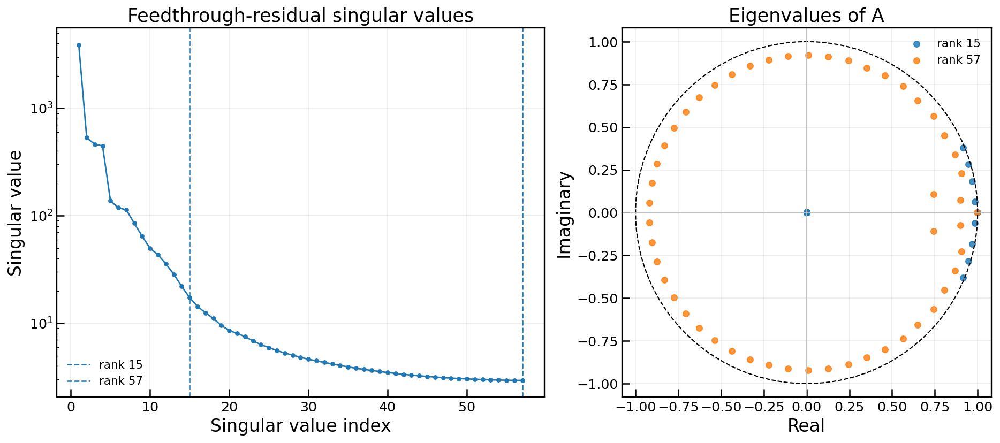

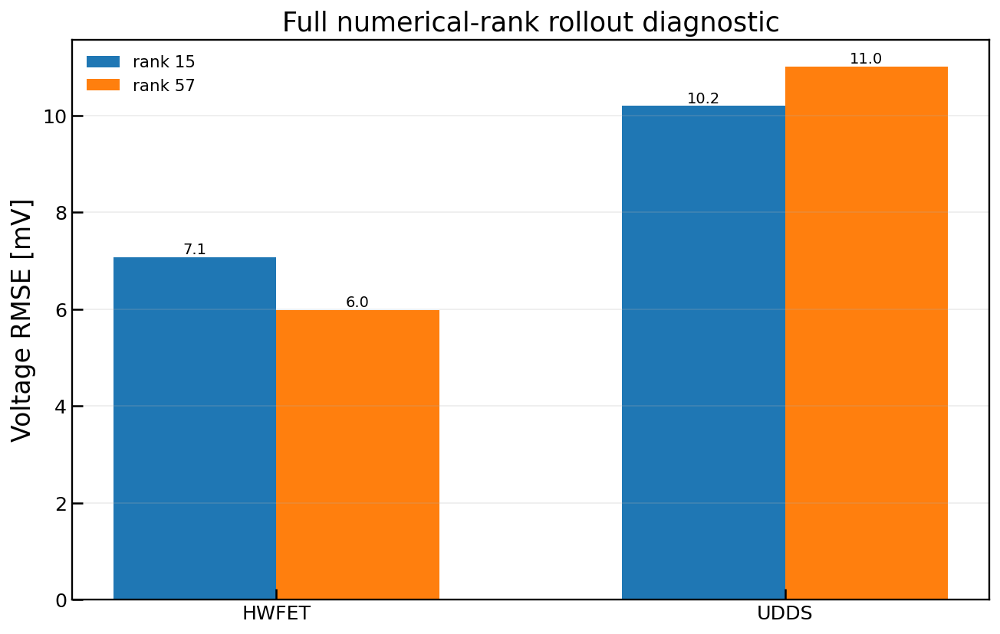

In [228]:
FULL_RANK_REFERENCE_RANK = 15
FEED_DYN_FULL_NUMERICAL_RANK = feed_dyn_numerical_rank
FULL_RANKS_TO_CHECK = sorted({
    rank for rank in [FULL_RANK_REFERENCE_RANK, FEED_DYN_FULL_NUMERICAL_RANK]
    if 1 <= rank <= feed_dyn_numerical_rank
})

print(f"Selected reference rank: {FULL_RANK_REFERENCE_RANK}")
print(f"Full numerical rank: {FEED_DYN_FULL_NUMERICAL_RANK}")
print(f"Ranks checked here: {FULL_RANKS_TO_CHECK}")

full_rank_dt_s = float(dt_summary.loc[dt_summary["cycle"].isin(TRAIN_CYCLES), "dt_median_s"].median())
print(f"Nominal time step for time-scale estimates: {full_rank_dt_s:.4f} s")

for rank in FULL_RANKS_TO_CHECK:
    if rank not in feed_dyn_ranked_models:
        K_tmp, A_tmp, B_tmp = fit_feed_dyn_ranked_operator(rank)
        feed_dyn_ranked_models[rank] = {"K": K_tmp, "A": A_tmp, "B": B_tmp}

full_rank_rows = []
full_rank_one_step_rows = []
full_rank_rollout_rows = []
full_rank_rollout_results = {}

for rank in FULL_RANKS_TO_CHECK:
    model = feed_dyn_ranked_models[rank]
    A_tmp = model["A"]
    B_tmp = model["B"]
    K_tmp = model["K"]

    eigvals_tmp = linalg.eigvals(A_tmp)
    eig_abs_tmp = np.abs(eigvals_tmp)
    stable_abs = eig_abs_tmp[eig_abs_tmp < 1.0]
    slow_tau_s = np.nan
    if len(stable_abs) > 0:
        slowest_abs = float(np.max(stable_abs))
        if slowest_abs > 0.0:
            slow_tau_s = float(-full_rank_dt_s / np.log(slowest_abs))

    full_rank_rows.append({
        "rank": rank,
        "energy_at_rank": feed_dyn_cumulative_energy[rank - 1],
        "max_abs_eig_A": float(np.max(eig_abs_tmp)),
        "n_eigs_outside_unit_circle": int(np.sum(eig_abs_tmp > 1.0 + 1e-10)),
        "slowest_stable_tau_s": slow_tau_s,
    })

    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        snapshots = feed_dyn_snapshots_by_cycle[cycle_name]
        omega_val = np.vstack([snapshots["Z_curr"], snapshots["G_curr"]])
        dyn_pred_scaled_val = (K_tmp[0:1, :] @ omega_val).reshape(-1)
        dyn_true_scaled_val = snapshots["Z_next"][0, :]

        df = cycles_feed[cycle_name]
        next_index = np.arange(ETA_DELAY + 1, len(df))
        dyn_pred = inverse_feed_dyn_scaled(dyn_pred_scaled_val)
        dyn_true = inverse_feed_dyn_scaled(dyn_true_scaled_val)
        eta_static_next = df[FEED_STATIC_COL].to_numpy(dtype=float)[next_index]
        soc_true_next = df[SOC_COL].to_numpy(dtype=float)[next_index]
        voltage_true = df[VOLTAGE_COL].to_numpy(dtype=float)[next_index]
        voltage_pred = OCV_func(soc_true_next) + eta_static_next + dyn_pred

        voltage_metrics = compute_error_metrics(voltage_true, voltage_pred)
        dyn_metrics = compute_error_metrics(dyn_true, dyn_pred)
        full_rank_one_step_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "voltage_rmse_mV": 1000.0 * voltage_metrics["rmse"],
            "voltage_bias_mV": 1000.0 * voltage_metrics["bias"],
            "dynamic_eta_rmse_mV": 1000.0 * dyn_metrics["rmse"],
        })

        rollout = rollout_feedthrough_dynamic_segment(df, A_tmp, B_tmp)
        full_rank_rollout_results.setdefault(rank, {})[cycle_name] = rollout["result"]

        if rollout["result"] is not None:
            result = rollout["result"]
            rollout_voltage_metrics = compute_error_metrics(result[VOLTAGE_COL], result["voltage_pred"])
        else:
            rollout_voltage_metrics = {"rmse": np.nan, "bias": np.nan, "mae": np.nan, "max_abs_error": np.nan}

        full_rank_rollout_rows.append({
            "rank": rank,
            "cycle": cycle_name,
            "status": rollout["status"],
            "failure_time_s": rollout["failure_time_s"],
            "n_predicted_samples": 0 if rollout["result"] is None else len(rollout["result"]),
            "voltage_rmse_mV": 1000.0 * rollout_voltage_metrics["rmse"],
            "voltage_bias_mV": 1000.0 * rollout_voltage_metrics["bias"],
        })

full_rank_diagnostics = pd.DataFrame(full_rank_rows)
full_rank_one_step_metrics = pd.DataFrame(full_rank_one_step_rows)
full_rank_rollout_metrics = pd.DataFrame(full_rank_rollout_rows)

display(full_rank_diagnostics)
display(full_rank_one_step_metrics)
display(full_rank_rollout_metrics)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.8), constrained_layout=True)
rank_axis = np.arange(1, len(s_feed_dyn) + 1)
axes[0].semilogy(rank_axis, s_feed_dyn, marker="o", markersize=3.5, linewidth=1.4)
for rank in FULL_RANKS_TO_CHECK:
    axes[0].axvline(rank, linestyle="--", linewidth=1.3, label=f"rank {rank}")
axes[0].set_xlabel("Singular value index")
axes[0].set_ylabel("Singular value")
axes[0].set_title("Feedthrough-residual singular values")
axes[0].legend(frameon=False, loc="best")

unit_theta = np.linspace(0.0, 2.0 * np.pi, 500)
for rank in FULL_RANKS_TO_CHECK:
    eigvals_rank = linalg.eigvals(feed_dyn_ranked_models[rank]["A"])
    axes[1].scatter(eigvals_rank.real, eigvals_rank.imag, s=32, alpha=0.82, label=f"rank {rank}")
axes[1].plot(np.cos(unit_theta), np.sin(unit_theta), color="black", linestyle="--", linewidth=1.1)
axes[1].axhline(0.0, color="0.75", linewidth=0.9)
axes[1].axvline(0.0, color="0.75", linewidth=0.9)
axes[1].set_aspect("equal", adjustable="box")
axes[1].set_xlim(-1.08, 1.08)
axes[1].set_ylim(-1.08, 1.08)
axes[1].set_xlabel("Real")
axes[1].set_ylabel("Imaginary")
axes[1].set_title("Eigenvalues of A")
axes[1].legend(frameon=False, loc="best")

for ax in axes:
    ax.grid(True, alpha=0.25)
    ax.tick_params(direction="in", length=7, width=1.3)

fig.savefig("interim_full_rank_feedthrough_diagnostic.svg", bbox_inches="tight")
fig.savefig("interim_full_rank_feedthrough_diagnostic.png", dpi=300, bbox_inches="tight")
plt.show()

fig, ax = plt.subplots(figsize=(9.2, 5.8), constrained_layout=True)
plot_data = full_rank_rollout_metrics.copy()
x = np.arange(len(CONSTRAINED_VALIDATION_CYCLES))
bar_width = 0.32

for j, rank in enumerate(FULL_RANKS_TO_CHECK):
    values = []
    labels = []
    for cycle_name in CONSTRAINED_VALIDATION_CYCLES:
        match = plot_data.loc[(plot_data["rank"] == rank) & (plot_data["cycle"] == cycle_name)]
        values.append(float(match["voltage_rmse_mV"].iloc[0]) if len(match) else np.nan)
        labels.append(str(match["status"].iloc[0]) if len(match) else "missing")
    offset = (j - (len(FULL_RANKS_TO_CHECK) - 1) / 2.0) * bar_width
    bars = ax.bar(x + offset, values, width=bar_width, label=f"rank {rank}")
    for bar, value, status in zip(bars, values, labels):
        if np.isfinite(value):
            ax.text(bar.get_x() + bar.get_width() / 2.0, value, f"{value:.1f}", ha="center", va="bottom", fontsize=10)
        else:
            ax.text(bar.get_x() + bar.get_width() / 2.0, 1.0, status, ha="center", va="bottom", rotation=90, fontsize=10)

ax.set_xticks(x)
ax.set_xticklabels(CONSTRAINED_VALIDATION_CYCLES)
ax.set_ylabel("Voltage RMSE [mV]")
ax.set_title("Full numerical-rank rollout diagnostic")
ax.grid(True, axis="y", alpha=0.25)
ax.legend(frameon=False, loc="best")
ax.tick_params(direction="in", length=7, width=1.3)
fig.savefig("interim_full_rank_feedthrough_rollout_rmse.svg", bbox_inches="tight")
fig.savefig("interim_full_rank_feedthrough_rollout_rmse.png", dpi=300, bbox_inches="tight")
plt.show()

## Report figures

These cells export the EDMDc report figures

In [229]:
# Plot style for exported report figures.
FINAL_FIG_DIR = Path("final_report_figures")
FINAL_FIG_DIR.mkdir(exist_ok=True)

FINAL_LABEL_SIZE = 20
FINAL_TICK_SIZE = 17
FINAL_TITLE_SIZE = 21
FINAL_LEGEND_SIZE = 16
FINAL_LINEWIDTH = 1.8

plt.rcParams.update({
    "axes.titlesize": FINAL_TITLE_SIZE,
    "axes.labelsize": FINAL_LABEL_SIZE,
    "xtick.labelsize": FINAL_TICK_SIZE,
    "ytick.labelsize": FINAL_TICK_SIZE,
    "legend.fontsize": FINAL_LEGEND_SIZE,
    "figure.titlesize": FINAL_TITLE_SIZE,
    "axes.linewidth": 1.2,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})

FINAL_VALIDATION_CYCLES = ["HWFET", "UDDS"]
FINAL_COMPACT_RANK = 15
FINAL_FULL_RANK = FEED_DYN_FULL_NUMERICAL_RANK
FINAL_MODEL_RANKS = [FINAL_COMPACT_RANK, FINAL_FULL_RANK]
FINAL_MAIN_RANK = FINAL_FULL_RANK

print(f"Final report figures will be saved to: {FINAL_FIG_DIR.resolve()}")
print(f"Final selected rank: {FINAL_MAIN_RANK}")
print(f"Compact comparison rank: {FINAL_COMPACT_RANK}")

Final report figures will be saved to: C:\GitHub Repos\ME-595-Project\src\koopman-methods\final_report_figures
Final selected rank: 57
Compact comparison rank: 15


### Model comparison

This comparison summarizes the main EDMDc model variants

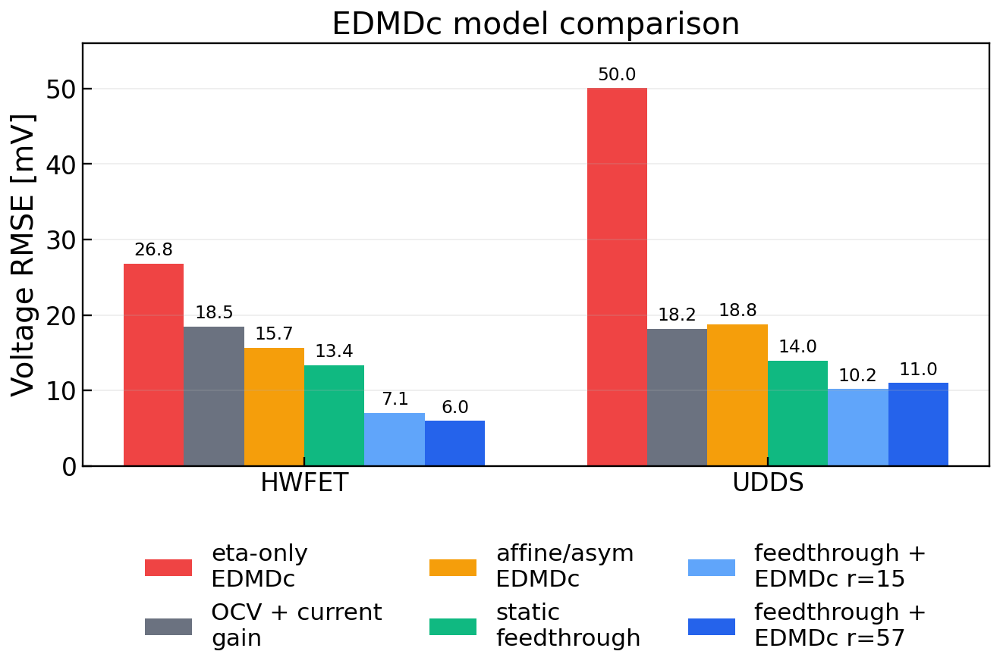

,cycle,voltage_rmse_V,voltage_bias_V,model,voltage_rmse_mV,voltage_bias_mV
10,HWFET,0.005985,0.002637,feedthrough + EDMDc r=57,5.984865,2.636851
8,HWFET,0.007072,-0.003236,feedthrough + EDMDc r=15,7.072495,-3.235836
6,HWFET,0.013376,0.006512,static feedthrough,13.376305,6.512272
4,HWFET,0.015685,0.014097,affine/asym EDMDc,15.684715,14.096627
0,HWFET,0.018510,0.012737,OCV + current gain,18.509993,12.736699
2,HWFET,0.026819,-0.020429,eta-only EDMDc,26.819243,-20.428763
9,UDDS,0.010196,0.000178,feedthrough + EDMDc r=15,10.195894,0.178468
11,UDDS,0.011005,0.000038,feedthrough + EDMDc r=57,11.005480,0.038112
7,UDDS,0.013966,0.005232,static feedthrough,13.966409,5.231772
1,UDDS,0.018155,0.010365,OCV + current gain,18.154833,10.365134


In [230]:
comparison_parts = []

# Simple current-gain baseline.
ohmic_rows = baseline_metrics.loc[
    (baseline_metrics["model"] == "OCV + R_I I")
    & (baseline_metrics["cycle"].isin(FINAL_VALIDATION_CYCLES)),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
ohmic_rows["model"] = "OCV + current gain"
comparison_parts.append(ohmic_rows)

# Earlier constrained eta-only EDMDc baseline.
eta_only_rows = constrained_rollout_metrics.loc[
    (constrained_rollout_metrics["rank"] == BEST_CONSTRAINED_RANK_TO_PLOT)
    & (constrained_rollout_metrics["cycle"].isin(FINAL_VALIDATION_CYCLES))
    & (constrained_rollout_metrics["status"].str.startswith("ok")),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
eta_only_rows["model"] = "eta-only EDMDc"
comparison_parts.append(eta_only_rows)

# Affine/asymmetric EDMDc branch, best conservative rank from Step 15.
asym_rows = asym_rollout_metrics.loc[
    (asym_rollout_metrics["rank"] == 5)
    & (asym_rollout_metrics["cycle"].isin(FINAL_VALIDATION_CYCLES))
    & (asym_rollout_metrics["status"].str.startswith("ok")),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
asym_rows["model"] = "affine/asym EDMDc"
comparison_parts.append(asym_rows)

# Static feedthrough alone from the selected Step 16 quadratic SOC-bathtub library.
static_rows = feedthrough_static_metrics.loc[
    (feedthrough_static_metrics["library"] == BEST_FEEDTHROUGH_LIBRARY)
    & (feedthrough_static_metrics["cycle"].isin(FINAL_VALIDATION_CYCLES)),
    ["cycle", "voltage_rmse_V", "voltage_bias_V"],
].copy()
static_rows["model"] = "static feedthrough"
comparison_parts.append(static_rows)

# Feedthrough + dynamic residual EDMDc at compact and full numerical rank.
for rank in FINAL_MODEL_RANKS:
    rank_rows = full_rank_rollout_metrics.loc[
        (full_rank_rollout_metrics["rank"] == rank)
        & (full_rank_rollout_metrics["cycle"].isin(FINAL_VALIDATION_CYCLES))
        & (full_rank_rollout_metrics["status"].str.startswith("ok")),
        ["cycle", "voltage_rmse_mV", "voltage_bias_mV"],
    ].copy()
    rank_rows["voltage_rmse_V"] = rank_rows["voltage_rmse_mV"] / 1000.0
    rank_rows["voltage_bias_V"] = rank_rows["voltage_bias_mV"] / 1000.0
    rank_rows = rank_rows[["cycle", "voltage_rmse_V", "voltage_bias_V"]]
    rank_rows["model"] = f"feedthrough + EDMDc r={rank}"
    comparison_parts.append(rank_rows)

final_model_comparison = pd.concat(comparison_parts, ignore_index=True)
final_model_comparison["voltage_rmse_mV"] = 1000.0 * final_model_comparison["voltage_rmse_V"]
final_model_comparison["voltage_bias_mV"] = 1000.0 * final_model_comparison["voltage_bias_V"]

model_order = [
    "eta-only EDMDc",
    "OCV + current gain",
    "affine/asym EDMDc",
    "static feedthrough",
    f"feedthrough + EDMDc r={FINAL_COMPACT_RANK}",
    f"feedthrough + EDMDc r={FINAL_FULL_RANK}",
]
model_labels = {
    "OCV + current gain": "OCV + current\ngain",
    "eta-only EDMDc": "eta-only\nEDMDc",
    "affine/asym EDMDc": "affine/asym\nEDMDc",
    "static feedthrough": "static\nfeedthrough",
    f"feedthrough + EDMDc r={FINAL_COMPACT_RANK}": f"feedthrough +\nEDMDc r={FINAL_COMPACT_RANK}",
    f"feedthrough + EDMDc r={FINAL_FULL_RANK}": f"feedthrough +\nEDMDc r={FINAL_FULL_RANK}",
}
colors = ["#ef4444", "#6b7280", "#f59e0b", "#10b981", "#60a5fa", "#2563eb"]

fig, ax = plt.subplots(figsize=(9.3, 6.2), constrained_layout=True)
bar_width = 0.13
x = np.arange(len(FINAL_VALIDATION_CYCLES))

for j, model_name in enumerate(model_order):
    values = []
    for cycle_name in FINAL_VALIDATION_CYCLES:
        match = final_model_comparison.loc[
            (final_model_comparison["cycle"] == cycle_name)
            & (final_model_comparison["model"] == model_name),
            "voltage_rmse_mV",
        ]
        values.append(float(match.iloc[0]) if len(match) else np.nan)

    offset = (j - (len(model_order) - 1) / 2.0) * bar_width
    bars = ax.bar(x + offset, values, width=bar_width, label=model_labels[model_name], color=colors[j])
    ax.bar_label(bars, fmt="%.1f", padding=3, fontsize=12)

ax.set_xticks(x)
ax.set_xticklabels(FINAL_VALIDATION_CYCLES)
ax.set_ylabel("Voltage RMSE [mV]")
ax.set_title("EDMDc model comparison")
ax.grid(True, axis="y", alpha=0.25)
ax.set_ylim(0.0, max(56.0, 1.12 * np.nanmax(final_model_comparison["voltage_rmse_mV"])))
ax.legend(frameon=False, loc="upper center", bbox_to_anchor=(0.5, -0.16), ncol=3, borderaxespad=0.0)

fig.savefig(FINAL_FIG_DIR / "final_edmdc_model_comparison.svg", bbox_inches="tight")
fig.savefig(FINAL_FIG_DIR / "final_edmdc_model_comparison.png", dpi=300, bbox_inches="tight")
plt.show()

display(final_model_comparison.sort_values(["cycle", "voltage_rmse_mV"]))

### UDDS rollout for the selected model

UDDS is used as the stress-test validation cycle

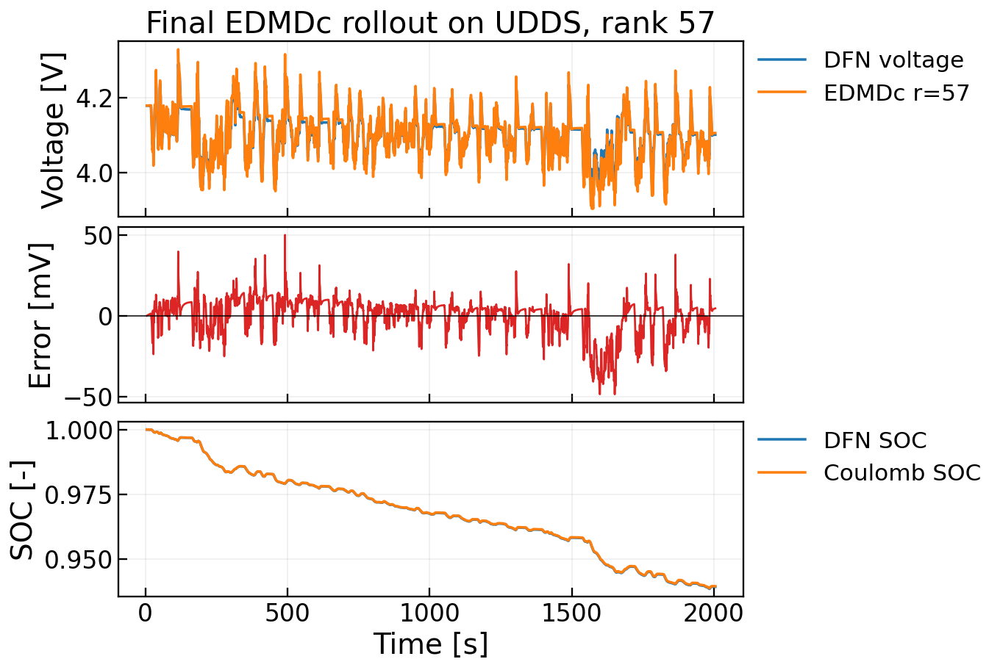

,rank,cycle,status,failure_time_s,n_predicted_samples,voltage_rmse_mV,voltage_bias_mV
3,57,UDDS,ok_short,None,20000,11.00548,0.038112


In [231]:
TRACE_CYCLE_FINAL = "UDDS"
trace_result = full_rank_rollout_results[FINAL_MAIN_RANK][TRACE_CYCLE_FINAL]

fig, axes = plt.subplots(3, 1, figsize=(9.6, 6.4), sharex=True, constrained_layout=True)

axes[0].plot(trace_result[TIME_COL], trace_result[VOLTAGE_COL], label="DFN voltage", linewidth=FINAL_LINEWIDTH, color="#1f77b4")
axes[0].plot(trace_result[TIME_COL], trace_result["voltage_pred"], label=f"EDMDc r={FINAL_MAIN_RANK}", linewidth=FINAL_LINEWIDTH, color="#ff7f0e")
axes[1].plot(
    trace_result[TIME_COL],
    1000.0 * (trace_result["voltage_pred"] - trace_result[VOLTAGE_COL]),
    color="#dc2626",
    linewidth=1.4,
)
axes[1].axhline(0.0, color="black", linewidth=1.0, alpha=0.75)
axes[2].plot(trace_result[TIME_COL], trace_result[SOC_COL], label="DFN SOC", linewidth=FINAL_LINEWIDTH, color="#1f77b4")
axes[2].plot(trace_result[TIME_COL], trace_result["soc_coulomb"], label="Coulomb SOC", linewidth=FINAL_LINEWIDTH, color="#ff7f0e")

axes[0].set_ylabel("Voltage [V]")
axes[1].set_ylabel("Error [mV]")
axes[2].set_ylabel("SOC [-]")
axes[2].set_xlabel("Time [s]")
axes[0].set_title(f"Final EDMDc rollout on {TRACE_CYCLE_FINAL}, rank {FINAL_MAIN_RANK}")

for ax in axes:
    ax.grid(True, alpha=0.22)
    ax.tick_params(direction="in", length=6, width=1.2)

axes[0].legend(frameon=False, loc="upper left", bbox_to_anchor=(1.01, 1.0), borderaxespad=0.0)
axes[2].legend(frameon=False, loc="upper left", bbox_to_anchor=(1.01, 1.0), borderaxespad=0.0)

fig.savefig(FINAL_FIG_DIR / f"final_edmdc_udds_rollout_rank{FINAL_MAIN_RANK}.svg", bbox_inches="tight")
fig.savefig(FINAL_FIG_DIR / f"final_edmdc_udds_rollout_rank{FINAL_MAIN_RANK}.png", dpi=300, bbox_inches="tight")
plt.show()

udds_metrics = full_rank_rollout_metrics.loc[
    (full_rank_rollout_metrics["rank"] == FINAL_MAIN_RANK)
    & (full_rank_rollout_metrics["cycle"] == TRACE_CYCLE_FINAL)
]
display(udds_metrics)

### Transient zoom comparison

This figure compares the compact and full-rank models around one high-current UDDS transient

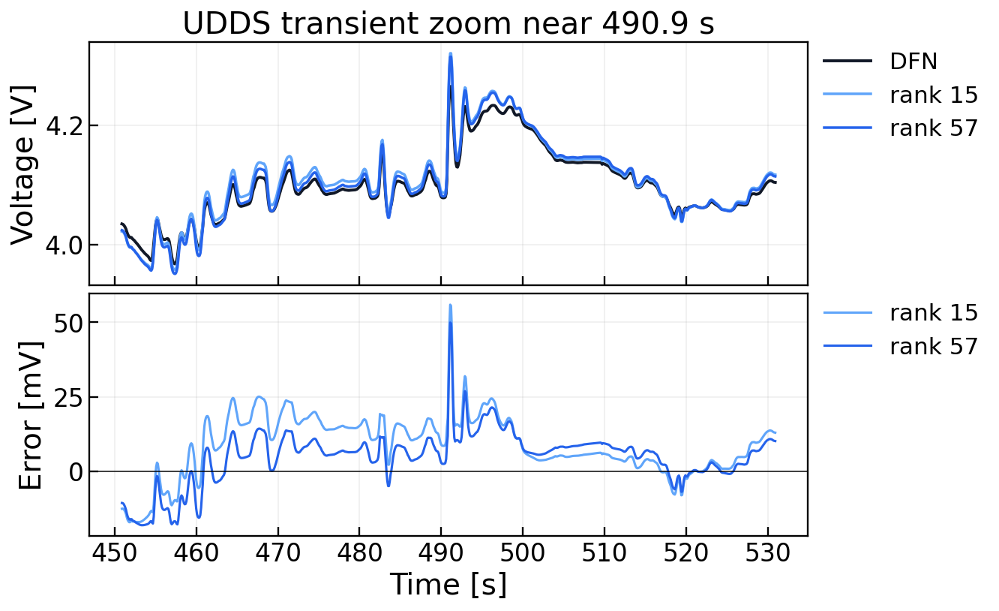

In [232]:
ZOOM_CYCLE_FINAL = "UDDS"
ZOOM_RANKS = [FINAL_COMPACT_RANK, FINAL_FULL_RANK]
zoom_results = {rank: full_rank_rollout_results[rank][ZOOM_CYCLE_FINAL] for rank in ZOOM_RANKS}
base_result = zoom_results[FINAL_FULL_RANK]

current = base_result[CURRENT_COL].to_numpy(dtype=float)
time = base_result[TIME_COL].to_numpy(dtype=float)
current_step = np.abs(np.diff(current, prepend=current[0]))
search_mask = (time > time[0] + 150.0) & (time < time[0] + 1800.0)
search_scores = np.where(search_mask, current_step, -np.inf)
center_idx = int(np.argmax(search_scores))
center_time = float(time[center_idx])
window_s = 80.0

fig, axes = plt.subplots(2, 1, figsize=(9.4, 5.7), sharex=True, constrained_layout=True)

mask = (time >= center_time - window_s / 2.0) & (time <= center_time + window_s / 2.0)
axes[0].plot(time[mask], base_result[VOLTAGE_COL].to_numpy(dtype=float)[mask], label="DFN", linewidth=2.0, color="#111827")
for rank, color in zip(ZOOM_RANKS, ["#60a5fa", "#2563eb"]):
    result = zoom_results[rank]
    rank_time = result[TIME_COL].to_numpy(dtype=float)
    rank_mask = (rank_time >= center_time - window_s / 2.0) & (rank_time <= center_time + window_s / 2.0)
    axes[0].plot(rank_time[rank_mask], result["voltage_pred"].to_numpy(dtype=float)[rank_mask], label=f"rank {rank}", linewidth=1.8, color=color)
    err = 1000.0 * (result["voltage_pred"].to_numpy(dtype=float) - result[VOLTAGE_COL].to_numpy(dtype=float))
    axes[1].plot(rank_time[rank_mask], err[rank_mask], label=f"rank {rank}", linewidth=1.6, color=color)

axes[1].axhline(0.0, color="black", linewidth=1.0, alpha=0.75)
axes[0].set_ylabel("Voltage [V]")
axes[1].set_ylabel("Error [mV]")
axes[1].set_xlabel("Time [s]")
axes[0].set_title(f"UDDS transient zoom near {center_time:.1f} s")

for ax in axes:
    ax.grid(True, alpha=0.22)
    ax.tick_params(direction="in", length=6, width=1.2)
    ax.legend(frameon=False, loc="upper left", bbox_to_anchor=(1.01, 1.0), borderaxespad=0.0)

fig.savefig(FINAL_FIG_DIR / "final_edmdc_udds_transient_zoom_rank15_vs_full.svg", bbox_inches="tight")
fig.savefig(FINAL_FIG_DIR / "final_edmdc_udds_transient_zoom_rank15_vs_full.png", dpi=300, bbox_inches="tight")
plt.show()

### Combined UDDS rollout and transient zoom

This figure puts the full UDDS rollout and a representative transient window in one panel for the final report.



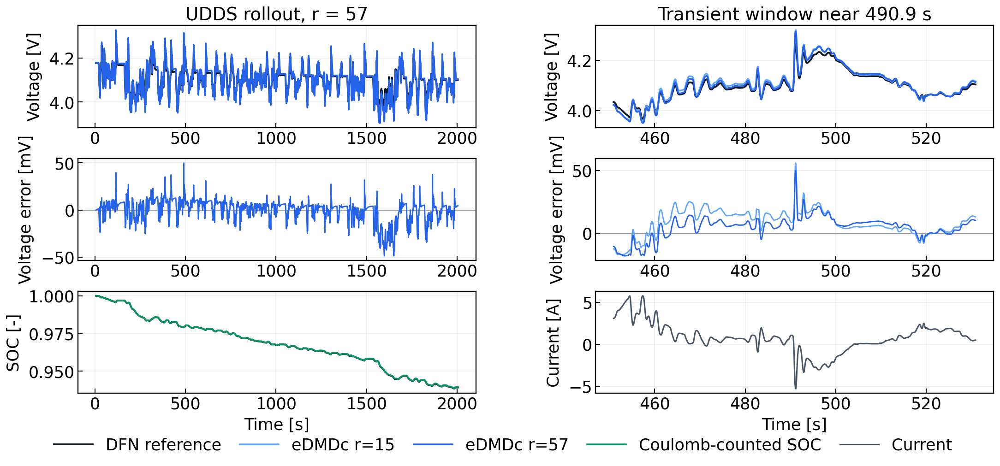

In [244]:
COMBINED_CYCLE_FINAL = "UDDS"

combined_trace = full_rank_rollout_results[FINAL_MAIN_RANK][COMBINED_CYCLE_FINAL]
combined_zoom_results = {
    rank: full_rank_rollout_results[rank][COMBINED_CYCLE_FINAL]
    for rank in ZOOM_RANKS
}
combined_base = combined_zoom_results[FINAL_FULL_RANK]

combined_time = combined_base[TIME_COL].to_numpy(dtype=float)
combined_current = combined_base[CURRENT_COL].to_numpy(dtype=float)

current_step = np.abs(np.diff(combined_current, prepend=combined_current[0]))
search_mask = (
    (combined_time > combined_time[0] + 150.0)
    & (combined_time < combined_time[0] + 1800.0)
)
search_scores = np.where(search_mask, current_step, -np.inf)

center_idx = int(np.argmax(search_scores))
center_time = float(combined_time[center_idx])

window_s = 80.0
zoom_mask = (
    (combined_time >= center_time - window_s / 2.0)
    & (combined_time <= center_time + window_s / 2.0)
)

# -------------------------------------------------------------------
# Figure style controls
# -------------------------------------------------------------------
TITLE_SIZE = 20
LABEL_SIZE = 18
TICK_SIZE = 18
LEGEND_SIZE = 18

LINE_DFN = 2.0
LINE_MODEL = 1.8
LINE_ERROR = 1.45
LINE_CURRENT = 1.6

COL_DFN = "#111827"
COL_FINAL = "#2563eb"
COL_SOC = "#059669"
COL_CURRENT = "#4b5563"
COL_ZERO = "#6b7280"

# Preserve your original zoom rank color assignment exactly:
# for rank, color in zip(ZOOM_RANKS, ["#60a5fa", "#2563eb"])
zoom_rank_colors = {
    rank: color
    for rank, color in zip(ZOOM_RANKS, ["#60a5fa", "#2563eb"])
}

fig, axes = plt.subplots(
    3,
    2,
    figsize=(15.5, 7.6),
    constrained_layout=False,
)

# -------------------------------------------------------------------
# Full-cycle rollout, selected final rank
# -------------------------------------------------------------------
full_time = combined_trace[TIME_COL].to_numpy(dtype=float)
full_voltage = combined_trace[VOLTAGE_COL].to_numpy(dtype=float)
full_pred = combined_trace["voltage_pred"].to_numpy(dtype=float)
full_error_mV = 1000.0 * (full_pred - full_voltage)

axes[0, 0].plot(
    full_time,
    full_voltage,
    label="DFN reference",
    linewidth=LINE_DFN,
    color=COL_DFN,
)

axes[0, 0].plot(
    full_time,
    full_pred,
    label=f"eDMDc r={FINAL_MAIN_RANK}",
    linewidth=LINE_MODEL,
    color=COL_FINAL,
)

axes[1, 0].plot(
    full_time,
    full_error_mV,
    label=f"eDMDc r={FINAL_MAIN_RANK} error",
    linewidth=LINE_ERROR,
    color=COL_FINAL,
)

axes[1, 0].axhline(
    0.0,
    color=COL_ZERO,
    linewidth=1.0,
    alpha=0.8,
    zorder=0,
)

axes[2, 0].plot(
    full_time,
    combined_trace[SOC_COL].to_numpy(dtype=float),
    label="DFN SOC",
    linewidth=LINE_DFN,
    color=COL_DFN,
)

axes[2, 0].plot(
    full_time,
    combined_trace["soc_coulomb"].to_numpy(dtype=float),
    label="Coulomb-counted SOC",
    linewidth=LINE_MODEL,
    color=COL_SOC,
)

axes[0, 0].set_title(
    f"UDDS rollout, r = {FINAL_MAIN_RANK}",
    fontsize=TITLE_SIZE,
)
axes[0, 0].set_ylabel("Voltage [V]", fontsize=LABEL_SIZE, labelpad=7)
axes[1, 0].set_ylabel("Voltage error [mV]", fontsize=LABEL_SIZE, labelpad=7)
axes[2, 0].set_ylabel("SOC [-]", fontsize=LABEL_SIZE, labelpad=7)
axes[2, 0].set_xlabel("Time [s]", fontsize=LABEL_SIZE, labelpad=6)

# -------------------------------------------------------------------
# Transient window, compact-vs-final rank comparison
# -------------------------------------------------------------------
axes[0, 1].plot(
    combined_time[zoom_mask],
    combined_base[VOLTAGE_COL].to_numpy(dtype=float)[zoom_mask],
    label="DFN reference",
    linewidth=LINE_DFN,
    color=COL_DFN,
)

for rank in ZOOM_RANKS:
    result = combined_zoom_results[rank]

    rank_time = result[TIME_COL].to_numpy(dtype=float)
    rank_voltage = result[VOLTAGE_COL].to_numpy(dtype=float)
    rank_pred = result["voltage_pred"].to_numpy(dtype=float)

    rank_mask = (
        (rank_time >= center_time - window_s / 2.0)
        & (rank_time <= center_time + window_s / 2.0)
    )

    rank_error_mV = 1000.0 * (rank_pred - rank_voltage)

    axes[0, 1].plot(
        rank_time[rank_mask],
        rank_pred[rank_mask],
        label=f"eDMDc r={rank}",
        linewidth=LINE_MODEL,
        color=zoom_rank_colors[rank],
        linestyle="-",   # preserves your original solid r=15/r=57 lines
    )

    axes[1, 1].plot(
        rank_time[rank_mask],
        rank_error_mV[rank_mask],
        label=f"eDMDc r={rank} error",
        linewidth=LINE_ERROR,
        color=zoom_rank_colors[rank],
        linestyle="-",   # preserves your original solid r=15/r=57 lines
    )

axes[1, 1].axhline(
    0.0,
    color=COL_ZERO,
    linewidth=1.0,
    alpha=0.8,
    zorder=0,
)

axes[2, 1].plot(
    combined_time[zoom_mask],
    combined_current[zoom_mask],
    label="Current",
    linewidth=LINE_CURRENT,
    color=COL_CURRENT,
)

axes[0, 1].set_title(
    f"Transient window near {center_time:.1f} s",
    fontsize=TITLE_SIZE,
)
axes[0, 1].set_ylabel("Voltage [V]", fontsize=LABEL_SIZE, labelpad=7)
axes[1, 1].set_ylabel("Voltage error [mV]", fontsize=LABEL_SIZE, labelpad=7)
axes[2, 1].set_ylabel("Current [A]", fontsize=LABEL_SIZE, labelpad=7)
axes[2, 1].set_xlabel("Time [s]", fontsize=LABEL_SIZE, labelpad=6)

# -------------------------------------------------------------------
# Axis formatting
# -------------------------------------------------------------------
for ax in axes.ravel():
    ax.grid(True, alpha=0.22)
    ax.tick_params(
        axis="both",
        labelsize=TICK_SIZE,
        direction="in",
        length=5,
        width=1.1,
    )

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

# -------------------------------------------------------------------
# Figure-level legend
# -------------------------------------------------------------------
from matplotlib.lines import Line2D

legend_handles = [
    Line2D(
        [0],
        [0],
        color=COL_DFN,
        linewidth=LINE_DFN,
        label="DFN reference",
    ),
]

# Preserve zoom rank colors/styles in legend
for rank in ZOOM_RANKS:
    legend_handles.append(
        Line2D(
            [0],
            [0],
            color=zoom_rank_colors[rank],
            linewidth=LINE_MODEL,
            linestyle="-",
            label=f"eDMDc r={rank}",
        )
    )

legend_handles.extend(
    [
        Line2D(
            [0],
            [0],
            color=COL_SOC,
            linewidth=LINE_MODEL,
            label="Coulomb-counted SOC",
        ),
        Line2D(
            [0],
            [0],
            color=COL_CURRENT,
            linewidth=LINE_CURRENT,
            label="Current",
        ),
    ]
)

fig.legend(
    handles=legend_handles,
    frameon=False,
    loc="lower center",
    bbox_to_anchor=(0.5, 0.025),
    ncol=len(legend_handles),
    fontsize=LEGEND_SIZE,
    handlelength=2.4,
    columnspacing=1.15,
    borderaxespad=0.0,
)

fig.subplots_adjust(
    left=0.075,
    right=0.99,
    top=0.91,
    bottom=0.16,
    wspace=0.30,
    hspace=0.30,
)

fig.savefig(
    FINAL_FIG_DIR / f"final_edmdc_udds_rollout_and_zoom_rank{FINAL_MAIN_RANK}.svg",
    bbox_inches="tight",
)

fig.savefig(
    FINAL_FIG_DIR / f"final_edmdc_udds_rollout_and_zoom_rank{FINAL_MAIN_RANK}.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

### Compact two-cycle rollout

This compact panel shows the rollout on both HWFET and UDDS.

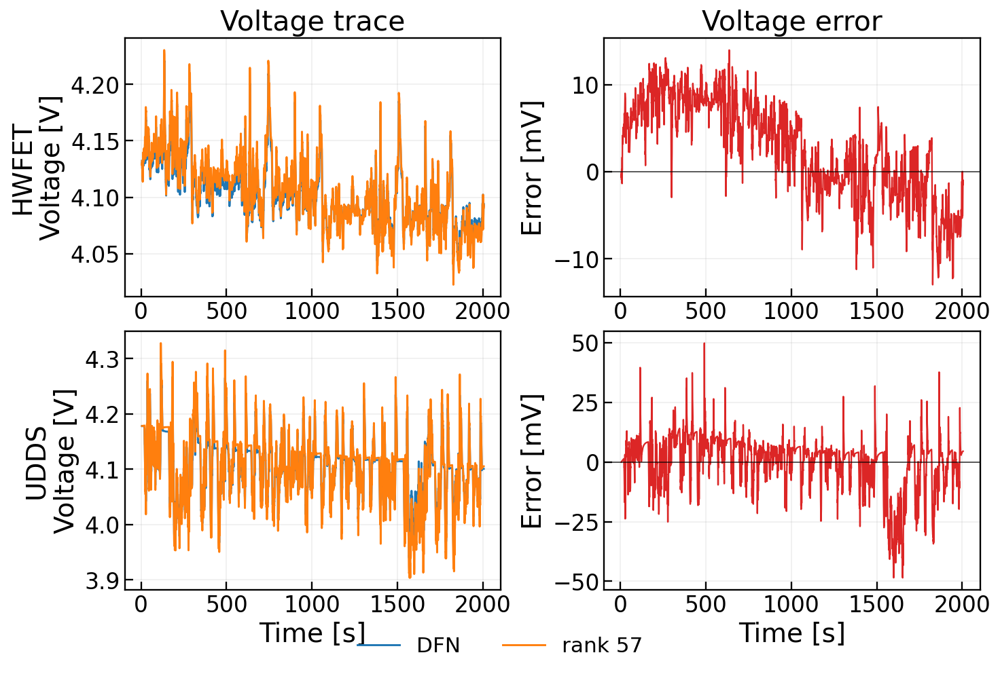

In [234]:
fig, axes = plt.subplots(2, 2, figsize=(10.4, 6.8), constrained_layout=True)

for row, cycle_name in enumerate(FINAL_VALIDATION_CYCLES):
    result = full_rank_rollout_results[FINAL_MAIN_RANK][cycle_name]
    time = result[TIME_COL]
    error_mV = 1000.0 * (result["voltage_pred"] - result[VOLTAGE_COL])

    axes[row, 0].plot(time, result[VOLTAGE_COL], label="DFN", linewidth=1.5, color="#1f77b4")
    axes[row, 0].plot(time, result["voltage_pred"], label=f"rank {FINAL_MAIN_RANK}", linewidth=1.5, color="#ff7f0e")
    axes[row, 1].plot(time, error_mV, linewidth=1.2, color="#dc2626")
    axes[row, 1].axhline(0.0, color="black", linewidth=0.9, alpha=0.7)

    axes[row, 0].set_ylabel(f"{cycle_name}\nVoltage [V]")
    axes[row, 1].set_ylabel("Error [mV]")
    axes[row, 0].grid(True, alpha=0.22)
    axes[row, 1].grid(True, alpha=0.22)

axes[0, 0].set_title("Voltage trace")
axes[0, 1].set_title("Voltage error")
axes[1, 0].set_xlabel("Time [s]")
axes[1, 1].set_xlabel("Time [s]")
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, frameon=False, loc="lower center", bbox_to_anchor=(0.5, -0.02), ncol=2, borderaxespad=0.0)

for ax in axes.ravel():
    ax.tick_params(direction="in", length=6, width=1.2)

fig.savefig(FINAL_FIG_DIR / f"final_edmdc_two_cycle_rollout_rank{FINAL_MAIN_RANK}.svg", bbox_inches="tight")
fig.savefig(FINAL_FIG_DIR / f"final_edmdc_two_cycle_rollout_rank{FINAL_MAIN_RANK}.png", dpi=300, bbox_inches="tight")
plt.show()